# Standard Genetic Algorithm for Feature Selection

This notebook implements a Standard Genetic Algorithm (GA) for feature selection on benchmark metaheuristic datasets.

## Overview
- Binary chromosome representation of feature subsets
- Tournament selection (size 2)
- Single-point crossover
- Bit-flip mutation
- Comprehensive visualizations of the evolutionary process


## 1. Imports and Setup


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score, matthews_corrcoef
from sklearn.datasets import (load_breast_cancer, load_wine, load_iris, make_classification,
                             load_digits, load_diabetes, fetch_covtype, load_linnerud)
import warnings
warnings.filterwarnings('ignore')

# Set random seed for reproducibility
np.random.seed(42)

# Set plotting style
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

print("Libraries imported successfully!")


Libraries imported successfully!


## 2. Dataset Loading and Preprocessing


In [2]:
def load_benchmark_dataset(dataset_name='breast_cancer'):
    """
    Load benchmark datasets for feature selection
    
    Args:
        dataset_name: Name of the dataset
    
    Returns:
        X: Feature matrix
        y: Target vector
        feature_names: List of feature names
    """
    if dataset_name == 'breast_cancer':
        data = load_breast_cancer()
        X, y = data.data, data.target
        feature_names = data.feature_names
    elif dataset_name == 'wine':
        data = load_wine()
        X, y = data.data, data.target
        feature_names = data.feature_names
    elif dataset_name == 'iris':
        data = load_iris()
        X, y = data.data, data.target
        feature_names = data.feature_names
    elif dataset_name == 'digits':
        data = load_digits()
        X, y = data.data, data.target
        feature_names = [f'Pixel_{i+1}' for i in range(X.shape[1])]
    elif dataset_name == 'diabetes':
        data = load_diabetes()
        X, y = data.data, data.target
        # Convert regression to binary classification (threshold at median)
        y = (y > np.median(y)).astype(int)
        feature_names = data.feature_names
    elif dataset_name == 'synthetic_1':
        # Synthetic dataset 1: Small, balanced
        X, y = make_classification(
            n_samples=500,
            n_features=20,
            n_informative=8,
            n_redundant=5,
            n_repeated=0,
            n_classes=2,
            n_clusters_per_class=1,
            random_state=42
        )
        feature_names = [f'Feature_{i+1}' for i in range(X.shape[1])]
    elif dataset_name == 'synthetic_2':
        # Synthetic dataset 2: Medium, multi-class
        X, y = make_classification(
            n_samples=1000,
            n_features=30,
            n_informative=10,
            n_redundant=10,
            n_repeated=0,
            n_classes=3,
            n_clusters_per_class=1,
            random_state=43
        )
        feature_names = [f'Feature_{i+1}' for i in range(X.shape[1])]
    elif dataset_name == 'synthetic_3':
        # Synthetic dataset 3: Large, high-dimensional
        X, y = make_classification(
            n_samples=800,
            n_features=50,
            n_informative=15,
            n_redundant=20,
            n_repeated=0,
            n_classes=2,
            n_clusters_per_class=2,
            random_state=44
        )
        feature_names = [f'Feature_{i+1}' for i in range(X.shape[1])]
    else:
        raise ValueError(f"Unknown dataset: {dataset_name}")
    
    # Standardize features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    print(f"Dataset: {dataset_name}")
    print(f"  Samples: {X.shape[0]}, Features: {X.shape[1]}, Classes: {len(np.unique(y))}")
    
    return X_scaled, y, feature_names

# Define all benchmark datasets to test
BENCHMARK_DATASETS = [
    'breast_cancer',
    'wine',
    'iris',
    'digits',
    'diabetes',
    'synthetic_1',
    'synthetic_2',
    'synthetic_3'
]

print(f"Available benchmark datasets: {BENCHMARK_DATASETS}")
print(f"Total datasets: {len(BENCHMARK_DATASETS)}")


Available benchmark datasets: ['breast_cancer', 'wine', 'iris', 'digits', 'diabetes', 'synthetic_1', 'synthetic_2', 'synthetic_3']
Total datasets: 8


## 3. Genetic Algorithm Implementation

### 3.1 Representation and Initialization


In [3]:
def initialize_population(pop_size, n_features, init_rate=0.5):
    """
    Initialize population of binary chromosomes
    
    Args:
        pop_size: Population size
        n_features: Number of features
        init_rate: Probability of initializing a feature as selected (default 0.5)
    
    Returns:
        population: Array of shape (pop_size, n_features) with binary values
    """
    population = np.random.rand(pop_size, n_features) < init_rate
    population = population.astype(int)
    
    # Ensure at least one feature is selected for each chromosome
    for i in range(pop_size):
        if np.sum(population[i]) == 0:
            # Randomly select one feature
            population[i, np.random.randint(n_features)] = 1
    
    return population

print("Population initialization function defined!")


Population initialization function defined!


### 3.2 Fitness Function


In [4]:
def evaluate_fitness(chromosome, X, y, classifier='rf', cv_folds=5, metric='accuracy', 
                     alpha=1.0, beta=0.0):
    """
    Evaluate fitness of a chromosome (feature subset)
    
    Fitness = α * Performance - β * (|X|/n)
    
    Args:
        chromosome: Binary array indicating selected features
        X: Feature matrix
        y: Target vector
        classifier: Type of classifier ('rf', 'svm', 'knn')
        cv_folds: Number of cross-validation folds
        metric: Performance metric ('accuracy', 'f1', 'mcc', 'roc_auc')
        alpha: Weight for performance term
        beta: Weight for size penalty term
    
    Returns:
        fitness: Fitness value
        performance: Performance metric value
    """
    # Get selected features
    selected_features = np.where(chromosome == 1)[0]
    
    # If no features selected, return low fitness
    if len(selected_features) == 0:
        return 0.0, 0.0
    
    # Select features
    X_selected = X[:, selected_features]
    
    # Initialize classifier
    if classifier == 'rf':
        clf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
    elif classifier == 'svm':
        clf = SVC(kernel='rbf', random_state=42, probability=True)
    elif classifier == 'knn':
        clf = KNeighborsClassifier(n_neighbors=5)
    else:
        raise ValueError(f"Unknown classifier: {classifier}")
    
    # Perform cross-validation
    cv = StratifiedKFold(n_splits=cv_folds, shuffle=True, random_state=42)
    
    if metric == 'accuracy':
        scores = cross_val_score(clf, X_selected, y, cv=cv, scoring='accuracy')
        performance = scores.mean()
    elif metric == 'f1':
        scores = cross_val_score(clf, X_selected, y, cv=cv, scoring='f1_macro')
        performance = scores.mean()
    elif metric == 'mcc':
        # MCC requires custom scoring
        scores = []
        for train_idx, val_idx in cv.split(X_selected, y):
            clf.fit(X_selected[train_idx], y[train_idx])
            y_pred = clf.predict(X_selected[val_idx])
            mcc = matthews_corrcoef(y[val_idx], y_pred)
            scores.append(mcc)
        performance = np.mean(scores)
    elif metric == 'roc_auc':
        if len(np.unique(y)) == 2:
            scores = cross_val_score(clf, X_selected, y, cv=cv, scoring='roc_auc')
            performance = scores.mean()
        else:
            # Multi-class ROC-AUC
            scores = cross_val_score(clf, X_selected, y, cv=cv, scoring='roc_auc_ovo')
            performance = scores.mean()
    else:
        raise ValueError(f"Unknown metric: {metric}")
    
    # Compute fitness with optional size penalty
    n_selected = len(selected_features)
    size_penalty = beta * (n_selected / len(chromosome))
    fitness = alpha * performance - size_penalty
    
    return fitness, performance

print("Fitness evaluation function defined!")


Fitness evaluation function defined!


### 3.3 Genetic Operators


In [5]:
def tournament_selection(population, fitness_values, tournament_size=2):
    """
    Tournament selection: select the best individual from a random tournament
    
    Args:
        population: Current population
        fitness_values: Fitness values for each individual
        tournament_size: Size of tournament (default 2)
    
    Returns:
        selected_individual: Selected chromosome
    """
    pop_size = len(population)
    
    # Randomly select tournament_size individuals
    tournament_indices = np.random.choice(pop_size, size=tournament_size, replace=False)
    tournament_fitness = fitness_values[tournament_indices]
    
    # Select the best individual from tournament
    winner_idx = tournament_indices[np.argmax(tournament_fitness)]
    
    return population[winner_idx].copy()


def single_point_crossover(parent1, parent2, crossover_rate=0.8):
    """
    Single-point crossover: exchange genetic material at a random cut point
    
    Args:
        parent1: First parent chromosome
        parent2: Second parent chromosome
        crossover_rate: Probability of performing crossover
    
    Returns:
        offspring1, offspring2: Two offspring chromosomes
    """
    if np.random.rand() < crossover_rate:
        # Select random cut point
        cut_point = np.random.randint(1, len(parent1))
        
        # Create offspring by swapping segments
        offspring1 = np.concatenate([parent1[:cut_point], parent2[cut_point:]])
        offspring2 = np.concatenate([parent2[:cut_point], parent1[cut_point:]])
    else:
        # No crossover, offspring are copies of parents
        offspring1 = parent1.copy()
        offspring2 = parent2.copy()
    
    # Ensure at least one feature is selected
    if np.sum(offspring1) == 0:
        offspring1[np.random.randint(len(offspring1))] = 1
    if np.sum(offspring2) == 0:
        offspring2[np.random.randint(len(offspring2))] = 1
    
    return offspring1, offspring2


def bit_flip_mutation(chromosome, mutation_rate=None):
    """
    Bit-flip mutation: flip each bit with probability mutation_rate
    
    Args:
        chromosome: Chromosome to mutate
        mutation_rate: Probability of flipping each bit (default: 1/n_features)
    
    Returns:
        mutated_chromosome: Mutated chromosome
    """
    if mutation_rate is None:
        mutation_rate = 1.0 / len(chromosome)
    
    mutated = chromosome.copy()
    
    # Flip each bit with probability mutation_rate
    mutation_mask = np.random.rand(len(chromosome)) < mutation_rate
    mutated[mutation_mask] = 1 - mutated[mutation_mask]
    
    # Ensure at least one feature is selected
    if np.sum(mutated) == 0:
        mutated[np.random.randint(len(mutated))] = 1
    
    return mutated

print("Genetic operators defined!")


Genetic operators defined!


### 3.4 Spiral-Based Enhancement Operators


In [6]:
def compute_spiral_radius(spiral_type, theta, a=1.0, b=1.0, k=1.0):
    """
    Compute radial distance for different spiral types
    
    Args:
        spiral_type: Type of spiral ('archimedean', 'logarithmic', 'fermat', 'hyperbolic', 'euler')
        theta: Angular displacement
        a: Spiral parameter a (default 1.0)
        b: Spiral parameter b (default 1.0, used for Archimedean)
        k: Spiral parameter k (default 1.0, used for Logarithmic)
    
    Returns:
        r: Radial distance
    """
    if spiral_type == 'archimedean':
        # Linear radial growth: r = a + b*theta
        r = a + b * theta
    elif spiral_type == 'logarithmic':
        # Exponential radial growth: r = a * exp(k*theta)
        r = a * np.exp(k * theta)
    elif spiral_type == 'fermat':
        # Square-root expansion: r = a * sqrt(theta)
        r = a * np.sqrt(np.maximum(theta, 0))
    elif spiral_type == 'hyperbolic':
        # Inverse decay: r = a / theta
        r = a / np.maximum(theta, 1e-10)  # Avoid division by zero
    elif spiral_type == 'euler':
        # Euler spiral uses Fresnel integrals, approximate with logarithmic
        # For simplicity, we use a logarithmic approximation
        r = a * np.exp(k * theta)
    else:
        raise ValueError(f"Unknown spiral type: {spiral_type}")
    
    return r

def spiral_update(chromosome, elite_chromosome, spiral_type='archimedean', 
                  r_factor=0.5, theta_factor=2*np.pi, a=1.0, b=1.0, k=1.0):
    """
    Apply spiral-based update to a chromosome
    
    Generic spiral update: z = x* + R(r,θ)(x - x*)
    where x* is the elite solution and x is the current chromosome
    
    Args:
        chromosome: Current binary chromosome (n_features,)
        elite_chromosome: Elite (best) binary chromosome (n_features,)
        spiral_type: Type of spiral ('archimedean', 'logarithmic', 'fermat', 'hyperbolic', 'euler')
        r_factor: Radial scaling factor (default 0.5)
        theta_factor: Angular displacement factor (default 2π)
        a, b, k: Spiral parameters
    
    Returns:
        new_chromosome: Updated binary chromosome
    """
    n_features = len(chromosome)
    
    # Step 1: Interpret binary chromosomes as continuous vectors in [0,1]
    x_continuous = chromosome.astype(float)
    x_star_continuous = elite_chromosome.astype(float)
    
    # Step 2: Compute spiral parameters
    # Generate random angular displacement for each dimension
    theta = np.random.uniform(0, theta_factor, size=n_features)
    
    # Compute radial scaling for each dimension
    r = compute_spiral_radius(spiral_type, theta, a=a, b=b, k=k)
    r = r_factor * r  # Scale by r_factor
    
    # Step 3: Apply spiral update: z = x* + R(r,θ)(x - x*)
    # R(r,θ) represents rotation and scaling
    # For binary GA, we use a simplified version: R(r,θ) = r * cos(θ) + (1-r) * sin(θ)
    # This creates a spiral motion toward the elite
    
    # Compute rotation-scaling factor
    R = r * np.cos(theta) + (1 - r) * np.sin(theta)
    R = np.clip(R, 0, 1)  # Ensure R is in [0,1]
    
    # Apply spiral transformation
    z = x_star_continuous + R * (x_continuous - x_star_continuous)
    
    # Step 4: Clamp z to [0,1]
    z = np.clip(z, 0.0, 1.0)
    
    # Step 5: Convert back to binary using thresholding
    new_chromosome = (z >= 0.5).astype(int)
    
    # Ensure at least one feature is selected
    if np.sum(new_chromosome) == 0:
        new_chromosome[np.random.randint(n_features)] = 1
    
    return new_chromosome

def apply_spiral_enhancement(population, elite_chromosome, elite_fitness, 
                            fitness_values, spiral_type='archimedean',
                            spiral_rate=0.3, r_factor=0.5, theta_factor=2*np.pi,
                            a=1.0, b=1.0, k=1.0):
    """
    Apply spiral enhancement to a portion of the population
    
    Args:
        population: Current population
        elite_chromosome: Best chromosome (elite solution)
        elite_fitness: Fitness of elite solution
        fitness_values: Fitness values for all individuals
        spiral_type: Type of spiral to use
        spiral_rate: Fraction of population to enhance with spiral (default 0.3)
        r_factor: Radial scaling factor
        theta_factor: Angular displacement factor
        a, b, k: Spiral parameters
    
    Returns:
        enhanced_population: Population with spiral-enhanced individuals
    """
    enhanced_population = population.copy()
    pop_size = len(population)
    
    # Select individuals to enhance (excluding the elite itself)
    # We enhance individuals that are not the elite but have reasonable fitness
    n_to_enhance = max(1, int(spiral_rate * pop_size))
    
    # Get indices sorted by fitness (excluding elite)
    elite_idx = np.argmax(fitness_values)
    candidate_indices = [i for i in range(pop_size) if i != elite_idx]
    
    # Select top candidates for enhancement (those with good but not best fitness)
    if len(candidate_indices) > 0:
        candidate_fitness = [fitness_values[i] for i in candidate_indices]
        sorted_candidates = sorted(zip(candidate_fitness, candidate_indices), reverse=True)
        selected_indices = [idx for _, idx in sorted_candidates[:n_to_enhance]]
        
        # Apply spiral enhancement to selected individuals
        for idx in selected_indices:
            enhanced_population[idx] = spiral_update(
                population[idx], 
                elite_chromosome,
                spiral_type=spiral_type,
                r_factor=r_factor,
                theta_factor=theta_factor,
                a=a, b=b, k=k
            )
    
    return enhanced_population

print("Spiral-based enhancement operators defined!")


Spiral-based enhancement operators defined!


In [7]:
class GeneticAlgorithmFeatureSelection:
    """
    Genetic Algorithm for Feature Selection with Spiral-Based Enhancement
    """
    
    def __init__(self, X, y, pop_size=50, n_generations=50, crossover_rate=0.8, 
                 mutation_rate=None, classifier='rf', metric='accuracy',
                 alpha=1.0, beta=0.0, cv_folds=5, elitism=True,
                 use_spiral=False, spiral_type='archimedean', spiral_rate=0.3,
                 r_factor=0.5, theta_factor=2*np.pi, spiral_a=1.0, spiral_b=1.0, spiral_k=1.0):
        """
        Initialize GA for feature selection
        
        Args:
            X: Feature matrix
            y: Target vector
            pop_size: Population size
            n_generations: Number of generations
            crossover_rate: Crossover probability
            mutation_rate: Mutation probability per bit (None = 1/n_features)
            classifier: Classifier type ('rf', 'svm', 'knn')
            metric: Performance metric ('accuracy', 'f1', 'mcc', 'roc_auc')
            alpha: Weight for performance term
            beta: Weight for size penalty term
            cv_folds: Number of CV folds
            elitism: Whether to use elitism (keep best solution)
            use_spiral: Whether to use spiral-based enhancement (default False)
            spiral_type: Type of spiral ('archimedean', 'logarithmic', 'fermat', 'hyperbolic', 'euler')
            spiral_rate: Fraction of population to enhance with spiral (default 0.3)
            r_factor: Radial scaling factor for spiral (default 0.5)
            theta_factor: Angular displacement factor for spiral (default 2π)
            spiral_a: Spiral parameter a (default 1.0)
            spiral_b: Spiral parameter b (default 1.0, used for Archimedean)
            spiral_k: Spiral parameter k (default 1.0, used for Logarithmic)
        """
        self.X = X
        self.y = y
        self.n_features = X.shape[1]
        self.pop_size = pop_size
        self.n_generations = n_generations
        self.crossover_rate = crossover_rate
        self.mutation_rate = mutation_rate if mutation_rate is not None else 1.0 / self.n_features
        self.classifier = classifier
        self.metric = metric
        self.alpha = alpha
        self.beta = beta
        self.cv_folds = cv_folds
        self.elitism = elitism
        
        # Spiral enhancement parameters
        self.use_spiral = use_spiral
        self.spiral_type = spiral_type
        self.spiral_rate = spiral_rate
        self.r_factor = r_factor
        self.theta_factor = theta_factor
        self.spiral_a = spiral_a
        self.spiral_b = spiral_b
        self.spiral_k = spiral_k
        
        # History tracking
        self.history = {
            'best_fitness': [],
            'avg_fitness': [],
            'worst_fitness': [],
            'best_performance': [],
            'avg_performance': [],
            'best_n_features': [],
            'avg_n_features': [],
            'diversity': [],
            'best_chromosome': None
        }
    
    def compute_diversity(self, population):
        """
        Compute population diversity as average Hamming distance
        """
        pop_size = len(population)
        if pop_size < 2:
            return 0.0
        
        total_distance = 0
        n_pairs = 0
        
        for i in range(pop_size):
            for j in range(i + 1, pop_size):
                # Hamming distance
                distance = np.sum(population[i] != population[j])
                total_distance += distance
                n_pairs += 1
        
        return total_distance / n_pairs if n_pairs > 0 else 0.0
    
    def run(self):
        """
        Run the genetic algorithm
        """
        print(f"Starting Genetic Algorithm for Feature Selection")
        print(f"  Population size: {self.pop_size}")
        print(f"  Generations: {self.n_generations}")
        print(f"  Crossover rate: {self.crossover_rate}")
        print(f"  Mutation rate: {self.mutation_rate:.4f}")
        print(f"  Classifier: {self.classifier}")
        print(f"  Metric: {self.metric}")
        if self.use_spiral:
            print(f"  Spiral Enhancement: ENABLED ({self.spiral_type})")
            print(f"    Spiral rate: {self.spiral_rate}, r_factor: {self.r_factor}")
        else:
            print(f"  Spiral Enhancement: DISABLED")
        print(f"\n{'='*60}")
        
        # Initialize population
        population = initialize_population(self.pop_size, self.n_features)
        
        # Evaluate initial population
        fitness_values = np.zeros(self.pop_size)
        performance_values = np.zeros(self.pop_size)
        
        print("Evaluating initial population...")
        for i in range(self.pop_size):
            fitness_values[i], performance_values[i] = evaluate_fitness(
                population[i], self.X, self.y, 
                classifier=self.classifier, 
                metric=self.metric,
                alpha=self.alpha, 
                beta=self.beta,
                cv_folds=self.cv_folds
            )
            if (i + 1) % 10 == 0:
                print(f"  Evaluated {i+1}/{self.pop_size} individuals")
        
        # Find best solution
        best_idx = np.argmax(fitness_values)
        best_sol = population[best_idx].copy()
        best_fitness = fitness_values[best_idx]
        
        # Record initial statistics
        self.history['best_fitness'].append(best_fitness)
        self.history['avg_fitness'].append(np.mean(fitness_values))
        self.history['worst_fitness'].append(np.min(fitness_values))
        self.history['best_performance'].append(performance_values[best_idx])
        self.history['avg_performance'].append(np.mean(performance_values))
        self.history['best_n_features'].append(np.sum(best_sol))
        self.history['avg_n_features'].append(np.mean([np.sum(p) for p in population]))
        self.history['diversity'].append(self.compute_diversity(population))
        
        print(f"\nGeneration 0: Best fitness = {best_fitness:.6f}, "
              f"Performance = {performance_values[best_idx]:.6f}, "
              f"Features = {np.sum(best_sol)}")
        
        # Main evolution loop
        for gen in range(1, self.n_generations + 1):
            # Create new population
            new_population = []
            
            # Generate offspring
            for _ in range(self.pop_size // 2):
                # Selection
                parent1 = tournament_selection(population, fitness_values, tournament_size=2)
                parent2 = tournament_selection(population, fitness_values, tournament_size=2)
                
                # Crossover
                offspring1, offspring2 = single_point_crossover(
                    parent1, parent2, crossover_rate=self.crossover_rate
                )
                
                # Mutation
                offspring1 = bit_flip_mutation(offspring1, mutation_rate=self.mutation_rate)
                offspring2 = bit_flip_mutation(offspring2, mutation_rate=self.mutation_rate)
                
                new_population.append(offspring1)
                new_population.append(offspring2)
            
            # Convert to numpy array
            new_population = np.array(new_population)
            
            # Evaluate new population
            new_fitness = np.zeros(self.pop_size)
            new_performance = np.zeros(self.pop_size)
            
            for i in range(self.pop_size):
                new_fitness[i], new_performance[i] = evaluate_fitness(
                    new_population[i], self.X, self.y,
                    classifier=self.classifier,
                    metric=self.metric,
                    alpha=self.alpha,
                    beta=self.beta,
                    cv_folds=self.cv_folds
                )
            
            # Elitism: replace worst individual with best from previous generation
            if self.elitism:
                worst_idx = np.argmin(new_fitness)
                new_population[worst_idx] = best_sol.copy()
                new_fitness[worst_idx] = best_fitness
                new_performance[worst_idx] = performance_values[best_idx]
            
            # Update population
            population = new_population
            fitness_values = new_fitness
            performance_values = new_performance
            
            # Update best solution
            current_best_idx = np.argmax(fitness_values)
            if fitness_values[current_best_idx] > best_fitness:
                best_sol = population[current_best_idx].copy()
                best_fitness = fitness_values[current_best_idx]
                best_idx = current_best_idx
            
            # Apply spiral-based enhancement if enabled
            if self.use_spiral:
                # Store population before spiral enhancement for comparison
                population_before_spiral = population.copy()
                
                # Apply spiral enhancement to a portion of the population
                population = apply_spiral_enhancement(
                    population,
                    best_sol,  # Elite chromosome
                    best_fitness,  # Elite fitness
                    fitness_values,
                    spiral_type=self.spiral_type,
                    spiral_rate=self.spiral_rate,
                    r_factor=self.r_factor,
                    theta_factor=self.theta_factor,
                    a=self.spiral_a,
                    b=self.spiral_b,
                    k=self.spiral_k
                )
                
                # Re-evaluate enhanced individuals (only those that changed)
                for i in range(self.pop_size):
                    if not np.array_equal(population[i], population_before_spiral[i]):
                        fitness_values[i], performance_values[i] = evaluate_fitness(
                            population[i], self.X, self.y,
                            classifier=self.classifier,
                            metric=self.metric,
                            alpha=self.alpha,
                            beta=self.beta,
                            cv_folds=self.cv_folds
                        )
                
                # Update best solution after spiral enhancement
                current_best_idx = np.argmax(fitness_values)
                if fitness_values[current_best_idx] > best_fitness:
                    best_sol = population[current_best_idx].copy()
                    best_fitness = fitness_values[current_best_idx]
                    best_idx = current_best_idx
            
            # Record statistics
            self.history['best_fitness'].append(best_fitness)
            self.history['avg_fitness'].append(np.mean(fitness_values))
            self.history['worst_fitness'].append(np.min(fitness_values))
            self.history['best_performance'].append(performance_values[best_idx])
            self.history['avg_performance'].append(np.mean(performance_values))
            self.history['best_n_features'].append(np.sum(best_sol))
            self.history['avg_n_features'].append(np.mean([np.sum(p) for p in population]))
            self.history['diversity'].append(self.compute_diversity(population))
            
            # Print progress
            if gen % 5 == 0 or gen == self.n_generations:
                print(f"Generation {gen}: Best fitness = {best_fitness:.6f}, "
                      f"Performance = {performance_values[best_idx]:.6f}, "
                      f"Features = {np.sum(best_sol)}, "
                      f"Diversity = {self.history['diversity'][-1]:.2f}")
        
        # Store best solution
        self.history['best_chromosome'] = best_sol
        
        print(f"\n{'='*60}")
        print(f"Evolution completed!")
        print(f"Best fitness: {best_fitness:.6f}")
        print(f"Best performance: {performance_values[best_idx]:.6f}")
        print(f"Selected features: {np.sum(best_sol)}/{self.n_features}")
        
        return best_sol, best_fitness

print("Genetic Algorithm class defined!")


Genetic Algorithm class defined!


## 4. Run Genetic Algorithm on All Datasets and Classifiers


In [8]:
# Define all spiral types to test (including 'standard' for comparison)
SPIRAL_TYPES = ['standard', 'archimedean', 'logarithmic', 'fermat', 'hyperbolic', 'euler']

# Spiral enhancement parameters (will be used when spiral_type != 'standard')
spiral_params = {
    'spiral_rate': 0.3,  # Fraction of population to enhance with spiral (30%)
    'r_factor': 0.5,  # Radial scaling factor
    'theta_factor': 2*np.pi,  # Angular displacement factor
    'spiral_a': 1.0,  # Spiral parameter a
    'spiral_b': 1.0,  # Spiral parameter b (used for Archimedean)
    'spiral_k': 1.0  # Spiral parameter k (used for Logarithmic)
}

print("="*80)
print("SPIRAL TYPES CONFIGURATION")
print("="*80)
print(f"Spiral types to test: {SPIRAL_TYPES}")
print(f"  - 'standard': Standard GA without spiral enhancement")
print(f"  - 'archimedean': Linear radial growth (r = a + b*θ)")
print(f"  - 'logarithmic': Exponential radial growth (r = a*e^(k*θ))")
print(f"  - 'fermat': Square-root expansion (r = a*√θ)")
print(f"  - 'hyperbolic': Inverse decay (r = a/θ)")
print(f"  - 'euler': Euler spiral (approximated with logarithmic)")
print(f"\nSpiral parameters: {spiral_params}")
print("="*80)


SPIRAL TYPES CONFIGURATION
Spiral types to test: ['standard', 'archimedean', 'logarithmic', 'fermat', 'hyperbolic', 'euler']
  - 'standard': Standard GA without spiral enhancement
  - 'archimedean': Linear radial growth (r = a + b*θ)
  - 'logarithmic': Exponential radial growth (r = a*e^(k*θ))
  - 'fermat': Square-root expansion (r = a*√θ)
  - 'hyperbolic': Inverse decay (r = a/θ)
  - 'euler': Euler spiral (approximated with logarithmic)

Spiral parameters: {'spiral_rate': 0.3, 'r_factor': 0.5, 'theta_factor': 6.283185307179586, 'spiral_a': 1.0, 'spiral_b': 1.0, 'spiral_k': 1.0}


In [9]:
# ============================================================================
# SPIRAL ENHANCEMENT CONFIGURATION - AUTOMATIC ALL SPIRAL TYPES
# ============================================================================
# AUTOMATICALLY RUNS ALL SPIRAL TYPES IN A LOOP
# This will test: 'standard', 'archimedean', 'logarithmic', 'fermat', 'hyperbolic', 'euler'

# Define all spiral types to test (including 'standard' for comparison)
SPIRAL_TYPES = ['standard', 'archimedean', 'logarithmic', 'fermat', 'hyperbolic', 'euler']

# Spiral parameters (used for all non-standard spiral types)
spiral_params = {
    'spiral_rate': 0.3,  # Fraction of population to enhance with spiral (30%)
    'r_factor': 0.5,  # Radial scaling factor
    'theta_factor': 2*np.pi,  # Angular displacement factor
    'spiral_a': 1.0,  # Spiral parameter a
    'spiral_b': 1.0,  # Spiral parameter b (used for Archimedean)
    'spiral_k': 1.0  # Spiral parameter k (used for Logarithmic)
}

print("="*80)
print("SPIRAL ENHANCEMENT: AUTOMATIC MODE - ALL SPIRAL TYPES")
print("="*80)
print(f"Will automatically test {len(SPIRAL_TYPES)} spiral types:")
for st in SPIRAL_TYPES:
    print(f"  - {st.upper()}")
print("="*80)

# Configure GA parameters (base parameters, classifier will be set in loop)
ga_base_params = {
    'pop_size': 20,
    'n_generations': 10,
    'crossover_rate': 0.8,
    'mutation_rate': None,  # Will be set to 1/n_features
    'metric': 'accuracy',  # 'accuracy', 'f1', 'mcc', 'roc_auc'
    'alpha': 1.0,  # Performance weight
    'beta': 0.0,  # Size penalty weight (0 = no penalty)
    'cv_folds': 5,
    'elitism': True
}

# Define all classifiers to test
CLASSIFIERS = ['rf', 'svm', 'knn']

# Storage for all results across datasets, models, and spiral types
# Structure: all_results[dataset_name][classifier_name][spiral_type] = {...}
all_results = {}


baseline_results = {}

print("="*80)
print("STEP 1: BASELINE EVALUATION - ALL CLASSIFIERS ON ALL FEATURES")
print("="*80)
print(f"Datasets: {len(BENCHMARK_DATASETS)}")
print(f"Classifiers: {CLASSIFIERS}")
print(f"Total baseline evaluations: {len(BENCHMARK_DATASETS) * len(CLASSIFIERS)}")
print("="*80)

# Preprocessing: Evaluate all classifiers on all features for all datasets
import time
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for dataset_name in BENCHMARK_DATASETS:
    print(f"\n{'-'*80}")
    print(f"Baseline Evaluation - Dataset: {dataset_name.upper()}")
    print(f"{'-'*80}")
    
    try:
        # Load dataset
        X, y, feature_names = load_benchmark_dataset(dataset_name)
        n_features = X.shape[1]
        
        # Initialize baseline results dictionary for this dataset
        baseline_results[dataset_name] = {}
        
        # Evaluate each classifier on all features
        for classifier_name in CLASSIFIERS:
            try:
                print(f"  Evaluating {classifier_name.upper()} on all features...", end=' ')
                
                # Initialize classifier
                if classifier_name == 'rf':
                    clf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
                elif classifier_name == 'svm':
                    clf = SVC(kernel='rbf', random_state=42, probability=True)
                elif classifier_name == 'knn':
                    clf = KNeighborsClassifier(n_neighbors=5)
                
                # Evaluate on all features
                baseline_start = time.time()
                scores_all = cross_val_score(clf, X, y, cv=cv, scoring='accuracy')
                baseline_time = time.time() - baseline_start
                
                # Store baseline results
                baseline_results[dataset_name][classifier_name] = {
                    'X': X,
                    'y': y,
                    'feature_names': feature_names,
                    'n_features': n_features,
                    'scores_all': scores_all,
                    'performance_all': scores_all.mean(),
                    'performance_std_all': scores_all.std(),
                    'baseline_time': baseline_time
                }
                
                print(f" Performance: {scores_all.mean():.4f} ± {scores_all.std():.4f} (Time: {baseline_time:.2f}s)")
                
            except Exception as e:
                print(f"✗ Error: {str(e)}")
                import traceback
                traceback.print_exc()
                continue
        
    except Exception as e:
        print(f"\n✗ Error loading dataset {dataset_name}: {str(e)}")
        import traceback
        traceback.print_exc()
        continue

print(f"\n{'='*80}")
print("STEP 1 COMPLETED: Baseline evaluation finished")
print(f"{'='*80}")

print("\n" + "="*80)
print("STEP 2: RUNNING GENETIC ALGORITHM ON ALL BENCHMARK DATASETS AND MODELS")
print("="*80)
print(f"Datasets: {len(BENCHMARK_DATASETS)}")
print(f"Classifiers: {CLASSIFIERS}")
print(f"Spiral Types: {SPIRAL_TYPES}")
print(f"Total combinations: {len(BENCHMARK_DATASETS) * len(CLASSIFIERS) * len(SPIRAL_TYPES)}")
print("="*80)

# Loop through all spiral types
for spiral_type in SPIRAL_TYPES:
    print(f"\n{'#'*80}")
    print(f"# SPIRAL TYPE: {spiral_type.upper()}")
    print(f"{'#'*80}")
    
    # Determine if we should use spiral enhancement
    use_spiral = (spiral_type != 'standard')
    
        # Loop through all benchmark datasets
    for dataset_name in BENCHMARK_DATASETS:
        print(f"\n{'='*80}")
        print(f"Processing Dataset: {dataset_name.upper()}")
        print(f"{'='*80}")

        try:
            # Load dataset
            X, y, feature_names = load_benchmark_dataset(dataset_name)
            n_features = X.shape[1]

            # Initialize results dictionary for this dataset if not exists
            if dataset_name not in all_results:
                all_results[dataset_name] = {}

            # Loop through all classifiers
            for classifier_name in CLASSIFIERS:
                print(f"\n{'-'*80}")
                print(f"  Classifier: {classifier_name.upper()} | Spiral: {spiral_type.upper()}")
                print(f"{'-'*80}")

                try:
                    # Start timing
                    import time
                    start_time = time.time()

                    # Create GA parameters with current classifier and spiral settings
                    ga_params = ga_base_params.copy()
                    ga_params['classifier'] = classifier_name
                    ga_params['use_spiral'] = use_spiral

                    # Add spiral-specific parameters if using spiral
                    if use_spiral:
                        ga_params['spiral_type'] = spiral_type
                        ga_params['spiral_rate'] = spiral_params['spiral_rate']
                        ga_params['r_factor'] = spiral_params['r_factor']
                        ga_params['theta_factor'] = spiral_params['theta_factor']
                        ga_params['spiral_a'] = spiral_params['spiral_a']
                        ga_params['spiral_b'] = spiral_params['spiral_b']
                        ga_params['spiral_k'] = spiral_params['spiral_k']

                    # Initialize and run GA
                    ga = GeneticAlgorithmFeatureSelection(X, y, **ga_params)
                    best_chromosome, best_fitness = ga.run()

                    # Get selected features
                    selected_features = np.where(best_chromosome == 1)[0]
                    selected_features_idx = np.where(best_chromosome == 1)[0]
                    X_selected = X[:, selected_features_idx]

                    # End timing
                    ga_time = time.time() - start_time

                    # Evaluate performance with selected features using the same classifier
                    if classifier_name == 'rf':
                        clf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
                    elif classifier_name == 'svm':
                        clf = SVC(kernel='rbf', random_state=42, probability=True)
                    elif classifier_name == 'knn':
                        clf = KNeighborsClassifier(n_neighbors=5)

                    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

                    # Time the evaluation of selected features
                    eval_start = time.time()
                    scores_selected = cross_val_score(clf, X_selected, y, cv=cv, scoring='accuracy')
                    eval_time = time.time() - eval_start

                    # Get baseline results (all features) from preprocessing step
                    baseline_data = baseline_results[dataset_name][classifier_name]
                    scores_all = baseline_data['scores_all']

                    total_time = ga_time + eval_time

                    # Initialize classifier dictionary if not exists
                    if classifier_name not in all_results[dataset_name]:
                        all_results[dataset_name][classifier_name] = {}

                    # Store results with spiral_type
                    all_results[dataset_name][classifier_name][spiral_type] = {
                        'X': X,
                        'y': y,
                        'feature_names': feature_names,
                        'n_features': n_features,
                        'ga': ga,
                        'best_chromosome': best_chromosome,
                        'best_fitness': best_fitness,
                        'selected_features': selected_features,
                        'selected_features_idx': selected_features_idx,
                        'scores_selected': scores_selected,
                        'scores_all': scores_all,  # From baseline evaluation
                        'performance_selected': scores_selected.mean(),
                        'performance_all': scores_all.mean(),  # From baseline evaluation
                        'n_selected': len(selected_features),
                        'reduction_ratio': len(selected_features) / n_features,
                        'ga_time': ga_time,
                        'eval_time': eval_time,
                        'total_time': total_time,
                        'baseline_time': baseline_data['baseline_time']  # Store baseline evaluation time
                    }

                    print(f"\n  Completed {dataset_name} with {classifier_name}")
                    print(f"    Selected: {len(selected_features)}/{n_features} features ({len(selected_features)/n_features*100:.1f}%)")
                    print(f"    Performance (Selected): {scores_selected.mean():.4f} ± {scores_selected.std():.4f}")
                    print(f"    Performance (All): {scores_all.mean():.4f} ± {scores_all.std():.4f}")
                    print(f"    GA Time: {ga_time:.2f}s, Eval Time: {eval_time:.2f}s, Total: {total_time:.2f}s")

                except Exception as e:
                    print(f"\n  ✗ Error processing {dataset_name} with {classifier_name}: {str(e)}")
                    import traceback
                    traceback.print_exc()
                    continue

            print(f"\n✓ Completed all classifiers for {dataset_name}")

        except Exception as e:
            print(f"\n✗ Error loading dataset {dataset_name}: {str(e)}")
            import traceback
            traceback.print_exc()
            continue

# Summary
total_combinations = sum(len(all_results[ds]) for ds in all_results.keys())
print(f"\n{'='*80}")
print(f"COMPLETED PROCESSING")
print(f"  Successful combinations: {total_combinations}/{len(BENCHMARK_DATASETS) * len(CLASSIFIERS)}")
print(f"  Datasets processed: {len(all_results)}/{len(BENCHMARK_DATASETS)}")
print(f"{'='*80}")


SPIRAL ENHANCEMENT: AUTOMATIC MODE - ALL SPIRAL TYPES
Will automatically test 6 spiral types:
  - STANDARD
  - ARCHIMEDEAN
  - LOGARITHMIC
  - FERMAT
  - HYPERBOLIC
  - EULER
STEP 1: BASELINE EVALUATION - ALL CLASSIFIERS ON ALL FEATURES
Datasets: 8
Classifiers: ['rf', 'svm', 'knn']
Total baseline evaluations: 24

--------------------------------------------------------------------------------
Baseline Evaluation - Dataset: BREAST_CANCER
--------------------------------------------------------------------------------
Dataset: breast_cancer
  Samples: 569, Features: 30, Classes: 2
  Evaluating RF on all features...  Performance: 0.9561 ± 0.0123 (Time: 0.47s)
  Evaluating SVM on all features...  Performance: 0.9754 ± 0.0195 (Time: 0.04s)
  Evaluating KNN on all features...  Performance: 0.9666 ± 0.0140 (Time: 1.34s)

--------------------------------------------------------------------------------
Baseline Evaluation - Dataset: WINE
---------------------------------------------------------

In [10]:
# # Initialize spiral_results dictionary
# spiral_results = {}
#
# print("="*80)
# print("RUNNING GENETIC ALGORITHM WITH ALL SPIRAL TYPES")
# print("="*80)
# print(f"Spiral types to test: {SPIRAL_TYPES}")
# print(f"Datasets: {len(BENCHMARK_DATASETS)}")
# print(f"Classifiers: {CLASSIFIERS}")
# print(f"Total experiments: {len(SPIRAL_TYPES) * len(BENCHMARK_DATASETS) * len(CLASSIFIERS)}")
# print("="*80)
#
# import time
#
# # Loop through all spiral types
# for spiral_type in SPIRAL_TYPES:
#     print(f"\n{'='*80}")
#     print(f"SPIRAL TYPE: {spiral_type.upper()}")
#     print(f"{'='*80}")
#
#     # Determine if we should use spiral enhancement
#     use_spiral = (spiral_type != 'standard')
#
#     # Loop through all benchmark datasets
#     for dataset_name in BENCHMARK_DATASETS:
#         print(f"\n{'-'*80}")
#         print(f"Dataset: {dataset_name.upper()}")
#         print(f"{'-'*80}")
#
#         try:
#             # Load dataset
#             X, y, feature_names = load_benchmark_dataset(dataset_name)
#             n_features = X.shape[1]
#
#             # Initialize results dictionary for this dataset if not exists
#             if dataset_name not in spiral_results:
#                 spiral_results[dataset_name] = {}
#
#             # Loop through all classifiers
#             for classifier_name in CLASSIFIERS:
#                 print(f"  Running {classifier_name.upper()}...", end=' ')
#
#                 try:
#                     # Start timing
#                     start_time = time.time()
#
#                     # Create GA parameters with current classifier and spiral settings
#                     ga_params = ga_base_params.copy()
#                     ga_params['classifier'] = classifier_name
#                     ga_params['use_spiral'] = use_spiral
#
#                     # Add spiral-specific parameters if using spiral
#                     if use_spiral:
#                         ga_params['spiral_type'] = spiral_type
#                         ga_params['spiral_rate'] = spiral_params['spiral_rate']
#                         ga_params['r_factor'] = spiral_params['r_factor']
#                         ga_params['theta_factor'] = spiral_params['theta_factor']
#                         ga_params['spiral_a'] = spiral_params['spiral_a']
#                         ga_params['spiral_b'] = spiral_params['spiral_b']
#                         ga_params['spiral_k'] = spiral_params['spiral_k']
#
#                     # Initialize and run GA
#                     ga = GeneticAlgorithmFeatureSelection(X, y, **ga_params)
#                     best_chromosome, best_fitness = ga.run()
#
#                     # Get selected features
#                     selected_features = np.where(best_chromosome == 1)[0]
#                     selected_features_idx = np.where(best_chromosome == 1)[0]
#                     X_selected = X[:, selected_features_idx]
#
#                     # End timing
#                     ga_time = time.time() - start_time
#
#                     # Evaluate performance with selected features using the same classifier
#                     if classifier_name == 'rf':
#                         clf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
#                     elif classifier_name == 'svm':
#                         clf = SVC(kernel='rbf', random_state=42, probability=True)
#                     elif classifier_name == 'knn':
#                         clf = KNeighborsClassifier(n_neighbors=5)
#
#                     cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
#
#                     # Time the evaluation of selected features
#                     eval_start = time.time()
#                     scores_selected = cross_val_score(clf, X_selected, y, cv=cv, scoring='accuracy')
#                     eval_time = time.time() - eval_start
#
#                                         # Get baseline results (all features) from preprocessing step or compute on the fly
#                     have_baseline = (
#                         'baseline_results' in globals()
#                         and dataset_name in baseline_results
#                         and classifier_name in baseline_results[dataset_name]
#                     )
#                     if have_baseline:
#                         baseline_data = baseline_results[dataset_name][classifier_name]
#                         scores_all = baseline_data['scores_all']
#                         baseline_time = baseline_data.get('baseline_time', None)
#                     else:
#                         # Compute baseline using all features
#                         baseline_start = time.time()
#                         scores_all = cross_val_score(clf, X, y, cv=cv, scoring='accuracy')
#                         baseline_time = time.time() - baseline_start
#
#                     total_time = ga_time + eval_time
#
#                     # Initialize classifier dictionary if not exists
#                     if classifier_name not in spiral_results[dataset_name]:
#                         spiral_results[dataset_name][classifier_name] = {}
#
#                     # Store results
#                     spiral_results[dataset_name][classifier_name][spiral_type] = {
#                         'X': X,
#                         'y': y,
#                         'feature_names': feature_names,
#                         'n_features': n_features,
#                         'ga': ga,
#                         'best_chromosome': best_chromosome,
#                         'best_fitness': best_fitness,
#                         'selected_features': selected_features,
#                         'selected_features_idx': selected_features_idx,
#                         'scores_selected': scores_selected,
#                         'scores_all': scores_all,
#                         'performance_selected': scores_selected.mean(),
#                         'performance_all': scores_all.mean(),
#                         'n_selected': len(selected_features),
#                         'reduction_ratio': len(selected_features) / n_features,
#                         'ga_time': ga_time,
#                         'eval_time': eval_time,
#                         'total_time': total_time,
#                         'baseline_time': baseline_time
#                     }
#
#                     print(f"✓ Performance: {scores_selected.mean():.4f}, "
#                           f"Features: {len(selected_features)}/{n_features}, "
#                           f"Time: {total_time:.2f}s")
#
#                 except Exception as e:
#                     print(f"✗ Error: {str(e)}")
#                     import traceback
#                     traceback.print_exc()
#                     continue
#
#         except Exception as e:
#             print(f"\n✗ Error loading dataset {dataset_name}: {str(e)}")
#             import traceback
#             traceback.print_exc()
#             continue
#
# # Summary
# total_experiments = sum(
#     len(spiral_results[ds][clf])
#     for ds in spiral_results.keys()
#     for clf in spiral_results[ds].keys()
# )
# print(f"\n{'='*80}")
# print(f"SPIRAL EXPERIMENTS COMPLETED")
# print(f"  Total successful experiments: {total_experiments}")
# print(f"  Datasets processed: {len(spiral_results)}/{len(BENCHMARK_DATASETS)}")
# print(f"{'='*80}")


In [11]:
## 4.1 Spiral Type Comparison

def compare_spiral_types(spiral_results):
    """
    Compare performance across different spiral types.
    Generates a summary and plots for each dataset individually.
    """
    if len(spiral_results) == 0:
        print("No results to compare!")
        return

    # Collect data for comparison
    comparison_data = []

    for ds_name, ds_results in spiral_results.items():
        for clf_name, clf_results in ds_results.items():
            for spiral_type, result in clf_results.items():
                comparison_data.append({
                    'Dataset': ds_name,
                    'Classifier': clf_name.upper(),
                    'Spiral Type': spiral_type.upper(),
                    'Performance': result['performance_selected'],
                    'Best Fitness': result['best_fitness'],
                    'N Selected': result['n_selected'],
                    'Reduction Ratio': result['reduction_ratio'],
                    'GA Time': result['ga_time'],
                    'Total Time': result['total_time']
                })

    df = pd.DataFrame(comparison_data)

    print("\n" + "=" * 100)
    print("SPIRAL TYPE COMPARISON - DATASET SUMMARIES")
    print("=" * 100)

    for ds_name in sorted(df['Dataset'].unique()):
        dataset_df = df[df['Dataset'] == ds_name]

        if dataset_df.empty:
            continue

        print(f"\nDataset: {ds_name}")
        print("-" * 100)

        for spiral_type in SPIRAL_TYPES:
            spiral_data = dataset_df[dataset_df['Spiral Type'] == spiral_type.upper()]
            if len(spiral_data) > 0:
                print(f"{spiral_type.upper()}:")
                print(f"  Mean Performance:     {spiral_data['Performance'].mean():.4f} ± {spiral_data['Performance'].std():.4f}")
                print(f"  Mean Best Fitness:    {spiral_data['Best Fitness'].mean():.4f} ± {spiral_data['Best Fitness'].std():.4f}")
                print(f"  Mean N Selected:      {spiral_data['N Selected'].mean():.2f} ± {spiral_data['N Selected'].std():.2f}")
                print(f"  Mean GA Time:         {spiral_data['GA Time'].mean():.2f}s ± {spiral_data['GA Time'].std():.2f}s")
                print(f"  Total Runs:           {len(spiral_data)}")

        available_types = [st.upper() for st in SPIRAL_TYPES if not dataset_df[dataset_df['Spiral Type'] == st.upper()].empty]

        if len(available_types) == 0:
            print("No spiral type results available for this dataset.")
            continue

        fig, axes = plt.subplots(2, 2, figsize=(16, 12))
        fig.suptitle(f"Dataset: {ds_name}", fontsize=16, fontweight='bold')

        # Plot 1: Performance by Spiral Type
        spiral_perfs = [dataset_df[dataset_df['Spiral Type'] == st]['Performance'].mean() for st in available_types]
        axes[0, 0].bar(available_types, spiral_perfs, color=plt.cm.tab10(np.arange(len(available_types))))
        axes[0, 0].set_ylabel('Mean Performance', fontsize=12, fontweight='bold')
        axes[0, 0].set_title('Mean Performance by Spiral Type', fontsize=14, fontweight='bold')
        axes[0, 0].grid(True, alpha=0.3, axis='y')
        axes[0, 0].tick_params(axis='x', rotation=45)

        # Plot 2: Best Fitness by Spiral Type
        spiral_fitness = [dataset_df[dataset_df['Spiral Type'] == st]['Best Fitness'].mean() for st in available_types]
        axes[0, 1].bar(available_types, spiral_fitness, color=plt.cm.tab10(np.arange(len(available_types))))
        axes[0, 1].set_ylabel('Mean Best Fitness', fontsize=12, fontweight='bold')
        axes[0, 1].set_title('Mean Best Fitness by Spiral Type', fontsize=14, fontweight='bold')
        axes[0, 1].grid(True, alpha=0.3, axis='y')
        axes[0, 1].tick_params(axis='x', rotation=45)

        # Plot 3: GA Time by Spiral Type
        spiral_times = [dataset_df[dataset_df['Spiral Type'] == st]['GA Time'].mean() for st in available_types]
        axes[1, 0].bar(available_types, spiral_times, color=plt.cm.tab10(np.arange(len(available_types))))
        axes[1, 0].set_ylabel('Mean GA Time (seconds)', fontsize=12, fontweight='bold')
        axes[1, 0].set_title('Mean GA Time by Spiral Type', fontsize=14, fontweight='bold')
        axes[1, 0].grid(True, alpha=0.3, axis='y')
        axes[1, 0].tick_params(axis='x', rotation=45)

        # Plot 4: Performance vs Standard (improvement)
        if 'STANDARD' in available_types:
            standard_perf = dataset_df[dataset_df['Spiral Type'] == 'STANDARD']['Performance'].mean()
            improvements = [(perf - standard_perf) * 100 for perf in spiral_perfs]
            colors = ['green' if imp > 0 else 'red' if imp < 0 else 'gray' for imp in improvements]
            axes[1, 1].bar(available_types, improvements, color=colors, alpha=0.7)
            axes[1, 1].axhline(y=0, color='black', linestyle='--', linewidth=1)
            axes[1, 1].set_ylabel('Performance Improvement vs Standard (%)', fontsize=12, fontweight='bold')
            axes[1, 1].set_title('Performance Improvement vs Standard GA', fontsize=14, fontweight='bold')
            axes[1, 1].grid(True, alpha=0.3, axis='y')
            axes[1, 1].tick_params(axis='x', rotation=45)
        else:
            axes[1, 1].axis('off')

        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()

    return df

# Initialize spiral_results if not already defined
if 'spiral_results' not in globals():
    spiral_results = {}

# Compare spiral types if results are available
if len(spiral_results) > 0:
    spiral_comparison_df = compare_spiral_types(spiral_results)
else:
    print("No spiral results available yet. Please run the spiral experiments cell (Cell 19) first.")


No spiral results available yet. Please run the spiral experiments cell (Cell 19) first.


## 5. Comprehensive Visualizations

### 5.1 Fitness Evolution


### 5.2 Feature Selection Visualization


In [14]:
# def plot_feature_selection(best_chromosome, feature_names, title="Best Feature Selection"):
#     """
#     Visualize selected features
#     """
#     fig, axes = plt.subplots(1, 2, figsize=(16, 6))
#
#     # Plot 1: Binary feature selection
#     selected = best_chromosome.astype(int)
#     colors = ['red' if s == 1 else 'lightgray' for s in selected]
#
#     axes[0].barh(range(len(selected)), selected, color=colors, edgecolor='black')
#     axes[0].set_yticks(range(len(selected)))
#     axes[0].set_yticklabels(feature_names, fontsize=8)
#     axes[0].set_xlabel('Selected (1) / Not Selected (0)', fontsize=12)
#     axes[0].set_title(f'{title}\n({np.sum(selected)}/{len(selected)} features selected)',
#                       fontsize=14, fontweight='bold')
#     axes[0].grid(True, alpha=0.3, axis='x')
#
#     # Plot 2: Feature selection summary
#     n_selected = np.sum(selected)
#     n_not_selected = len(selected) - n_selected
#
#     axes[1].pie([n_selected, n_not_selected],
#                 labels=[f'Selected ({n_selected})', f'Not Selected ({n_not_selected})'],
#                 autopct='%1.1f%%',
#                 colors=['#2ecc71', '#ecf0f1'],
#                 startangle=90,
#                 textprops={'fontsize': 12})
#     axes[1].set_title('Feature Selection Summary', fontsize=14, fontweight='bold')
#
#     plt.tight_layout()
#     plt.show()
#
# # Plot feature selection for dataset  dataset and classifier (if available)
# # Plot feature selection for each dataset and its first classifier + first spiral type
# if len(all_results) > 0:
#     for dataset_name in list(all_results.keys()):
#         if len(all_results[dataset_name]) > 0:
#             first_classifier = list(all_results[dataset_name].keys())[0]
#             spiral_dict = all_results[dataset_name][first_classifier]
#             if len(spiral_dict) > 0:
#                 first_spiral = list(spiral_dict.keys())[0]
#                 plot_result = spiral_dict[first_spiral]
#                 plot_feature_selection(plot_result['best_chromosome'], plot_result['feature_names'],
#                                        title=f"{dataset_name} | {first_classifier} | {first_spiral}")
# else:
#     print("No results available.")


In [26]:
print(all_results.keys())

dict_keys(['breast_cancer', 'wine', 'iris', 'digits', 'diabetes', 'synthetic_1', 'synthetic_2', 'synthetic_3'])


In [27]:
all_results

{'breast_cancer': {'rf': {'standard': {'X': array([[ 1.09706398, -2.07333501,  1.26993369, ...,  2.29607613,
             2.75062224,  1.93701461],
           [ 1.82982061, -0.35363241,  1.68595471, ...,  1.0870843 ,
            -0.24388967,  0.28118999],
           [ 1.57988811,  0.45618695,  1.56650313, ...,  1.95500035,
             1.152255  ,  0.20139121],
           ...,
           [ 0.70228425,  2.0455738 ,  0.67267578, ...,  0.41406869,
            -1.10454895, -0.31840916],
           [ 1.83834103,  2.33645719,  1.98252415, ...,  2.28998549,
             1.91908301,  2.21963528],
           [-1.80840125,  1.22179204, -1.81438851, ..., -1.74506282,
            -0.04813821, -0.75120669]], shape=(569, 30)),
    'y': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1,
           0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
           0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0,
           1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 

In [28]:


def summarize_feature_counts(all_results):
    summary = {}

    for dataset, models in all_results.items():
        for clf, spiral_dict in models.items():

            if clf not in summary:
                summary[clf] = {}

            summary[clf][dataset] = {}

            for spiral_type, result in spiral_dict.items():
                chrom = result['best_chromosome']
                summary[clf][dataset][spiral_type] = int(np.sum(chrom))

    return summary

summary = summarize_feature_counts(all_results)



In [29]:
summary

{'rf': {'breast_cancer': {'standard': 11,
   'archimedean': 15,
   'logarithmic': 11,
   'fermat': 11,
   'hyperbolic': 15,
   'euler': 12},
  'wine': {'standard': 7,
   'archimedean': 8,
   'logarithmic': 12,
   'fermat': 8,
   'hyperbolic': 8,
   'euler': 10},
  'iris': {'standard': 2,
   'archimedean': 2,
   'logarithmic': 2,
   'fermat': 2,
   'hyperbolic': 2,
   'euler': 2},
  'digits': {'standard': 37,
   'archimedean': 35,
   'logarithmic': 38,
   'fermat': 44,
   'hyperbolic': 41,
   'euler': 34},
  'diabetes': {'standard': 5,
   'archimedean': 6,
   'logarithmic': 6,
   'fermat': 4,
   'hyperbolic': 7,
   'euler': 4},
  'synthetic_1': {'standard': 13,
   'archimedean': 15,
   'logarithmic': 14,
   'fermat': 15,
   'hyperbolic': 12,
   'euler': 13},
  'synthetic_2': {'standard': 16,
   'archimedean': 20,
   'logarithmic': 18,
   'fermat': 20,
   'hyperbolic': 12,
   'euler': 19},
  'synthetic_3': {'standard': 29,
   'archimedean': 28,
   'logarithmic': 23,
   'fermat': 28,
   '

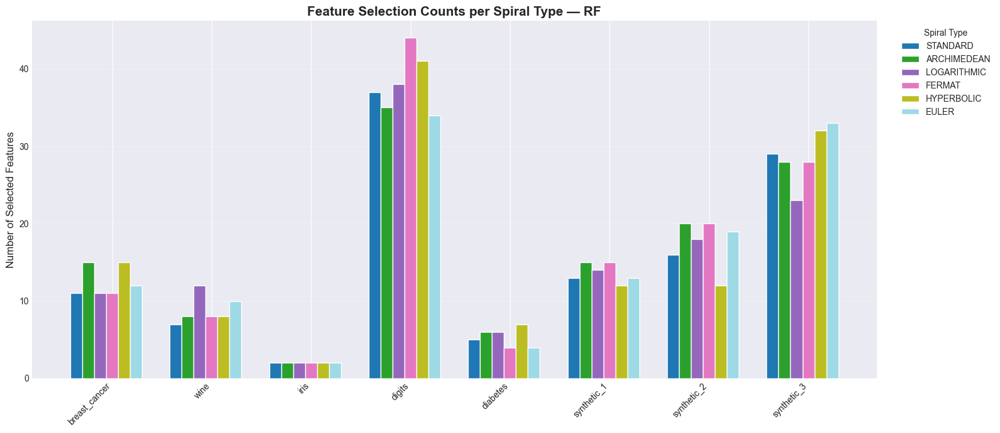

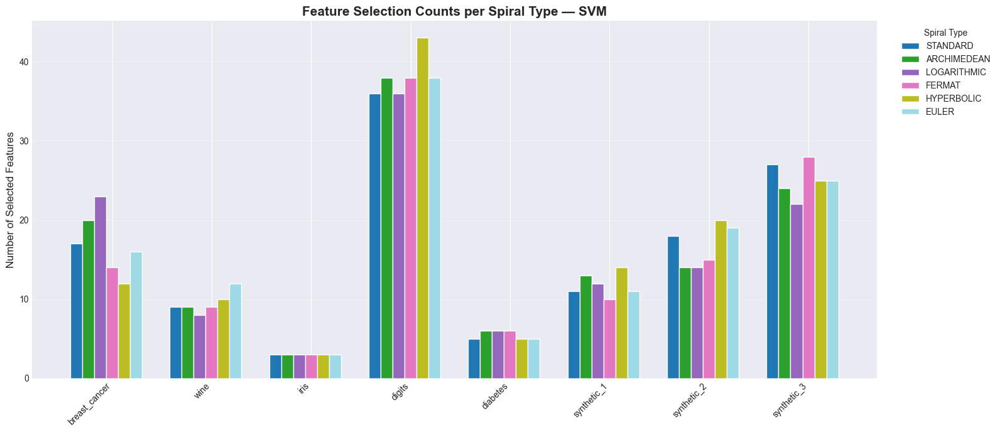

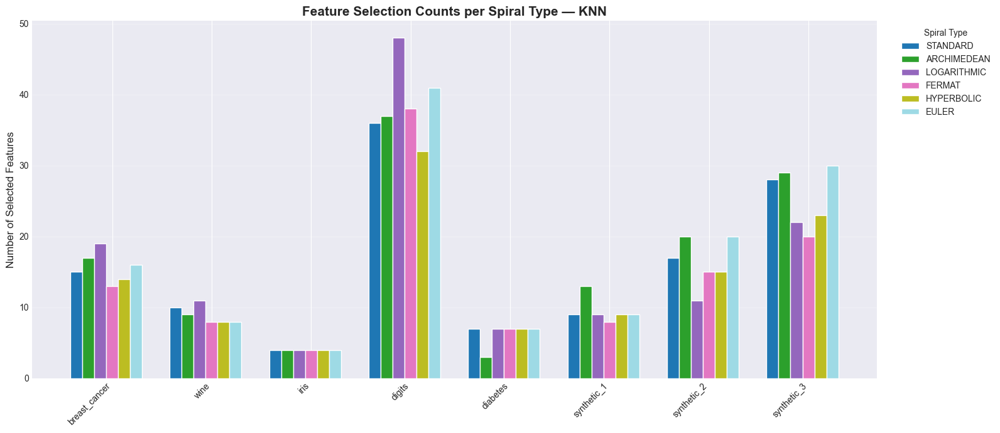

In [33]:
import numpy as np
import matplotlib.pyplot as plt

def plot_grouped_feature_counts(summary):
    """
    summary[classifier][dataset][spiral_type] = count
    Produces grouped bars for each classifier.
    """

    for clf, datasets in summary.items():
        plt.figure(figsize=(16, 7))

        dataset_names = list(datasets.keys())
        spiral_types = list(next(iter(datasets.values())).keys())

        n_datasets = len(dataset_names)
        n_spirals = len(spiral_types)

        # Width of each bar
        bar_width = 0.12
        x = np.arange(n_datasets)

        # Colors
        colors = plt.cm.tab20(np.linspace(0, 1, n_spirals))

        # Plot each spiral type
        for i, sp in enumerate(spiral_types):
            values = [datasets[ds][sp] for ds in dataset_names]
            plt.bar(x + i * bar_width,
                    values,
                    width=bar_width,
                    label=sp.upper(),
                    color=colors[i])

        # Formatting
        plt.title(f"Feature Selection Counts per Spiral Type — {clf.upper()}",
                  fontsize=15, fontweight="bold")

        plt.ylabel("Number of Selected Features", fontsize=12)
        plt.xticks(x + bar_width * (n_spirals / 2),
                   dataset_names,
                   rotation=45, ha="right")

        plt.grid(axis="y", alpha=0.3)
        plt.legend(title="Spiral Type", bbox_to_anchor=(1.02, 1), loc="upper left")

        plt.tight_layout()
        plt.show()
plot_grouped_feature_counts(summary)


In [35]:


for results in list(all_results.keys()):
    print(results)

breast_cancer
wine
iris
digits
diabetes
synthetic_1
synthetic_2
synthetic_3


### 5.3 Convergence Analysis


In [40]:
# def plot_convergence_analysis(all_results, classifiers=['rf', 'svm', 'knn']):
#     if len(all_results) == 0:
#         print("No results to plot!")
#         return
#
#     clf_colors = {'rf': 'steelblue', 'svm': 'coral', 'knn': 'lightgreen'}
#     clf_styles = {'rf': '-', 'svm': '--', 'knn': ':'}
#     clf_markers = {'rf': 'o', 'svm': 's', 'knn': '^'}
#
#     datasets = sorted(all_results.keys())
#
#     for dataset_name in datasets:
#         dataset_results = all_results[dataset_name]
#
#         fig, ax = plt.subplots(figsize=(10, 6))
#
#         for clf_name in classifiers:
#             if clf_name not in dataset_results:
#                 continue
#
#             for spiral_type, result in dataset_results[clf_name].items():
#
#                 if 'ga' not in result:
#                     continue
#
#                 ga_history = result['ga'].history
#                 generations = np.arange(len(ga_history["best_fitness"]))
#
#                 label = f"{clf_name.upper()}-{spiral_type}"
#                 color = clf_colors.get(clf_name, 'gray')
#                 style = clf_styles.get(clf_name, '-')
#
#                 ax.plot(
#                     generations,
#                     ga_history["best_fitness"],
#                     linestyle=style,
#                     linewidth=2,
#                     alpha=0.8,
#                     label=label
#                 )
#
#         ax.set_title(f"Best Fitness Convergence – {dataset_name}",
#                      fontsize=13, fontweight='bold')
#         ax.set_xlabel("Generation")
#         ax.set_ylabel("Best Fitness")
#         ax.legend(fontsize=8, ncol=2)
#         ax.grid(True, alpha=0.3)
#         plt.tight_layout()
#         plt.show()
#
#
#         fig2, ax2 = plt.subplots(figsize=(10, 6))
#
#         for clf_name in classifiers:
#             if clf_name not in dataset_results:
#                 continue
#
#             for spiral_type, result in dataset_results[clf_name].items():
#
#                 if 'ga' not in result:
#                     continue
#
#                 ga_history = result['ga'].history
#                 generations = np.arange(len(ga_history["best_fitness"]))
#                 color = clf_colors.get(clf_name, 'gray')
#                 style = clf_styles.get(clf_name, '-')
#
#                 window = 5
#                 fitness_std = [
#                     np.std(ga_history["best_fitness"][max(0, i-window):min(len(generations), i+window+1)])
#                     for i in generations
#                 ]
#
#                 ax2.plot(
#                     generations, fitness_std,
#                     linestyle=style, linewidth=2, alpha=0.8,
#                     label=f"{clf_name.upper()}-{spiral_type}"
#                 )
#
#         ax2.set_xlabel('Generation')
#         ax2.set_ylabel('Std Dev of Best Fitness (window=5)')
#         ax2.set_title(f'Convergence Indicator – {dataset_name}',
#                       fontsize=12, fontweight='bold')
#         ax2.legend(fontsize=8, ncol=2)
#         ax2.grid(True, alpha=0.3)
#         plt.tight_layout()
#         plt.show()
#
#         fig3, ax3 = plt.subplots(figsize=(10, 6))
#
#         for clf_name in classifiers:
#             if clf_name not in dataset_results:
#                 continue
#
#             for spiral_type, result in dataset_results[clf_name].items():
#
#                 if 'ga' not in result:
#                     continue
#
#                 ga_history = result['ga'].history
#                 generations = np.arange(len(ga_history["best_fitness"]))
#                 color = clf_colors.get(clf_name, 'gray')
#                 style = clf_styles.get(clf_name, '-')
#
#                 gap = np.array(ga_history["best_fitness"]) - np.array(ga_history["avg_fitness"])
#
#                 ax3.plot(
#                     generations, gap,
#                     linestyle=style, linewidth=2, alpha=0.8,
#                     label=f"{clf_name.upper()}-{spiral_type}"
#                 )
#
#         ax3.set_xlabel('Generation')
#         ax3.set_ylabel('Best – Average Fitness')
#         ax3.set_title(f'Exploitation vs Exploration – {dataset_name}',
#                       fontsize=12, fontweight='bold')
#         ax3.legend(fontsize=8, ncol=2)
#         ax3.grid(True, alpha=0.3)
#         plt.tight_layout()
#         plt.show()
#
#
#         fig4, ax4 = plt.subplots(figsize=(10, 6))
#
#         for clf_name in classifiers:
#             if clf_name not in dataset_results:
#                 continue
#
#             for spiral_type, result in dataset_results[clf_name].items():
#
#                 if 'ga' not in result:
#                     continue
#
#                 ga_history = result['ga'].history
#                 generations = np.arange(len(ga_history["best_fitness"]))
#                 color = clf_colors.get(clf_name, 'gray')
#                 style = clf_styles.get(clf_name, '-')
#                 marker = clf_markers.get(clf_name, 'o')
#
#                 ax4.plot(
#                     generations,
#                     ga_history["best_fitness"],
#                     linestyle=style,
#                     marker=marker,
#                     markersize=4,
#                     linewidth=2,
#                     alpha=0.8,
#                     label=f"{clf_name.upper()}-{spiral_type}"
#                 )
#
#         ax4.set_xlabel('Generation')
#         ax4.set_ylabel('Best Fitness')
#         ax4.set_title(f'Fitness Evolution – {dataset_name}',
#                       fontsize=12, fontweight='bold')
#         ax4.legend(fontsize=8, ncol=2)
#         ax4.grid(True, alpha=0.3)
#         plt.tight_layout()
#         plt.show()
#
#
# # Plot convergence analysis for all datasets and classifiers
# if len(all_results) > 0:
#     plot_convergence_analysis(all_results, CLASSIFIERS)
# else:
#     print("No results available yet. Please run the main execution cell first (Section 4).")


In [44]:
def build_convergence_table(all_results):
    rows = []

    for dataset, clf_dict in all_results.items():
        for clf_name, spirals in clf_dict.items():
            for spiral_type, result in spirals.items():

                if "ga" not in result:
                    continue

                hist = result["ga"].history
                best = np.array(hist["best_fitness"])
                avg = np.array(hist["avg_fitness"])
                gens = len(best)

                # Metrics
                final_best = best[-1]
                final_avg = avg[-1]
                gap = final_best - final_avg

                # variance window
                w = 5
                end = len(best)
                start = max(0, end - w)
                std_w = np.std(best[start:end])

                # convergence gen = first gen where improvement < 1e-6
                diffs = np.abs(np.diff(best))
                small = np.where(diffs < 1e-6)[0]
                conv_gen = int(small[0]) if len(small) > 0 else gens

                rows.append([
                    dataset,
                    clf_name.upper(),
                    spiral_type,
                    round(final_best, 6),
                    round(final_avg, 6),
                    round(std_w, 6),
                    conv_gen,
                    round(gap, 6)
                ])

    cols = [
        "Dataset", "Classifier", "Spiral",
        "Final Best Fitness", "Final Avg Fitness",
        "Std (Last Window)", "Convergence Gen",
        "Best-Avg Gap"
    ]

    return pd.DataFrame(rows, columns=cols)
df = build_convergence_table(all_results)
df.head()

,Dataset,Classifier,Spiral,Final Best Fitness,Final Avg Fitness,Std (Last Window),Convergence Gen,Best-Avg Gap
0,breast_cancer,RF,standard,0.975408,0.965393,0.001727,3,0.010015
1,breast_cancer,RF,archimedean,0.977162,0.967414,0.000000,1,0.009748
2,breast_cancer,RF,logarithmic,0.973669,0.966456,0.000863,1,0.007212
3,breast_cancer,RF,fermat,0.973669,0.967337,0.000000,2,0.006332
4,breast_cancer,RF,hyperbolic,0.966636,0.960128,0.000000,0,0.006508


v### 5.4 Performance Comparison



=== breast_cancer | rf | standard ===


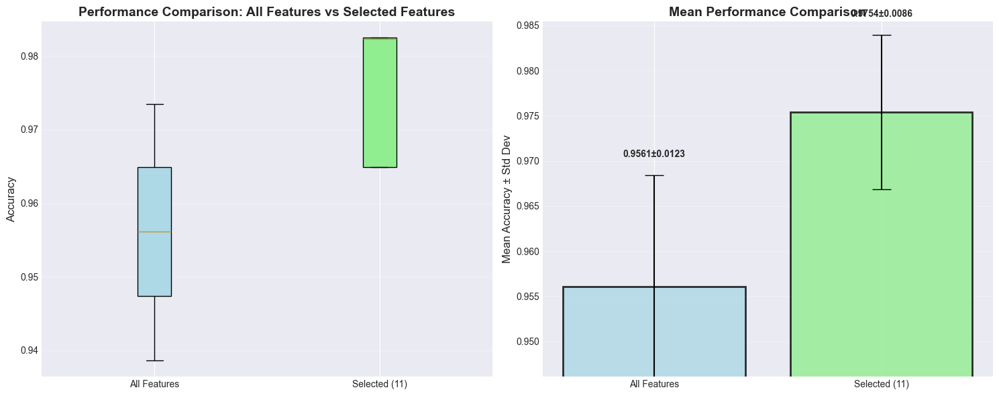


Performance Comparison:
  All Features: 0.956094 ± 0.012340
  Selected Features (11): 0.975408 ± 0.008570
  Feature Reduction: 11/30 = 36.7%
  Performance Change: +1.93%

=== breast_cancer | rf | archimedean ===


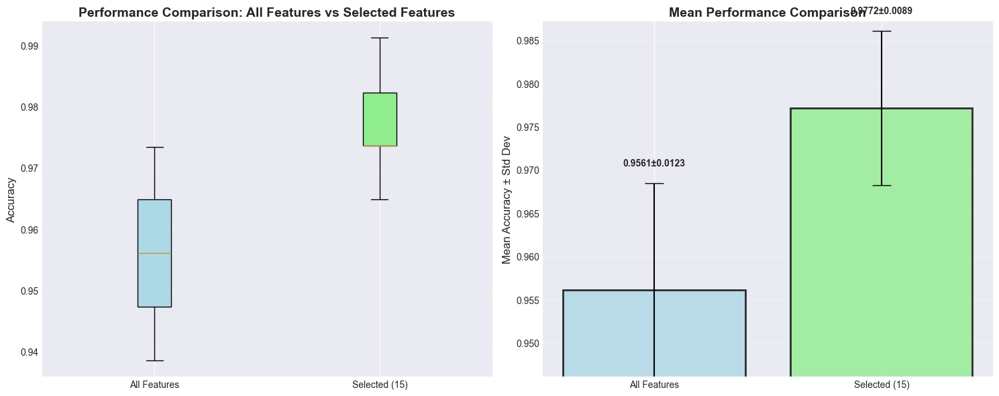


Performance Comparison:
  All Features: 0.956094 ± 0.012340
  Selected Features (15): 0.977162 ± 0.008928
  Feature Reduction: 15/30 = 50.0%
  Performance Change: +2.11%

=== breast_cancer | rf | logarithmic ===


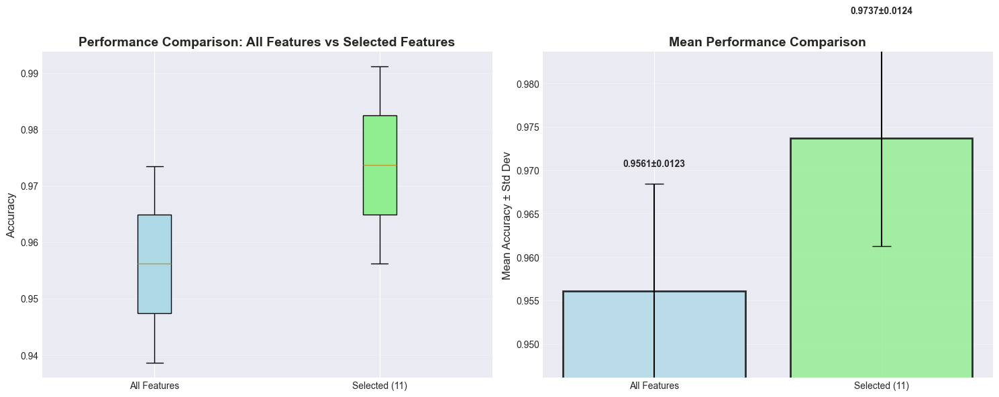


Performance Comparison:
  All Features: 0.956094 ± 0.012340
  Selected Features (11): 0.973669 ± 0.012383
  Feature Reduction: 11/30 = 36.7%
  Performance Change: +1.76%

=== breast_cancer | rf | fermat ===


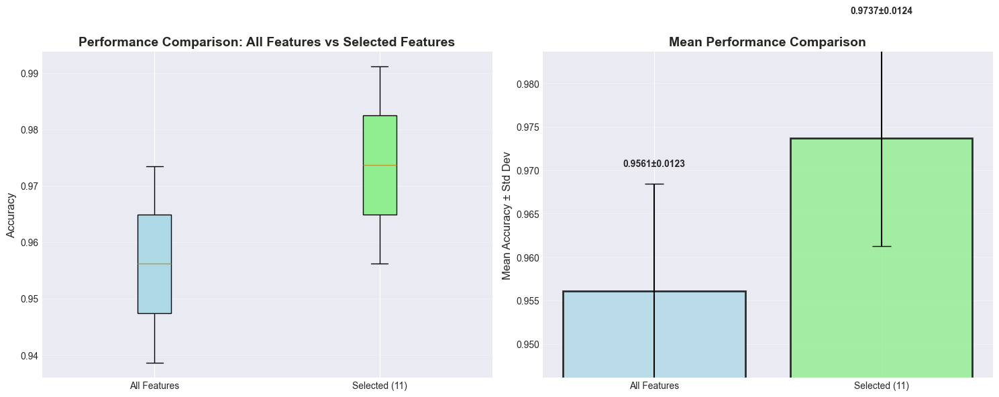


Performance Comparison:
  All Features: 0.956094 ± 0.012340
  Selected Features (11): 0.973669 ± 0.012383
  Feature Reduction: 11/30 = 36.7%
  Performance Change: +1.76%

=== breast_cancer | rf | hyperbolic ===


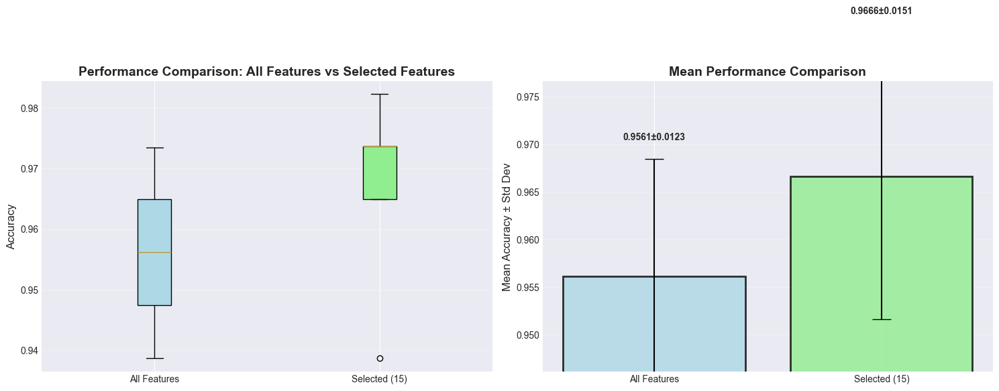


Performance Comparison:
  All Features: 0.956094 ± 0.012340
  Selected Features (15): 0.966636 ± 0.015059
  Feature Reduction: 15/30 = 50.0%
  Performance Change: +1.05%

=== breast_cancer | rf | euler ===


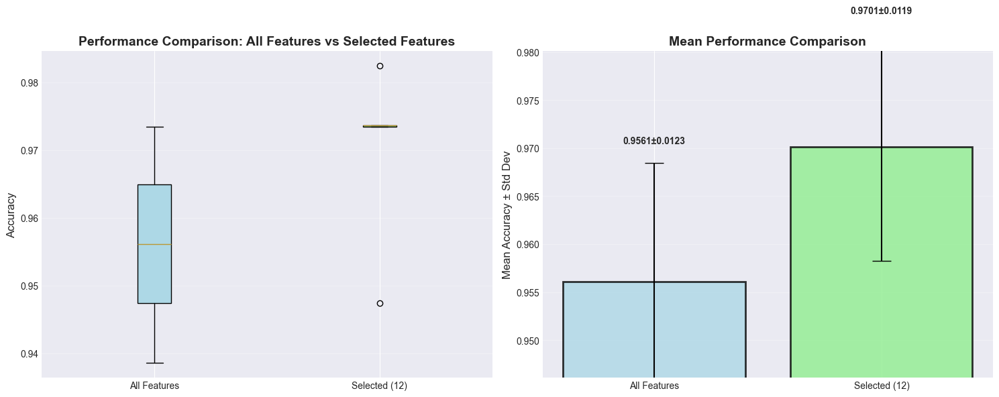


Performance Comparison:
  All Features: 0.956094 ± 0.012340
  Selected Features (12): 0.970129 ± 0.011885
  Feature Reduction: 12/30 = 40.0%
  Performance Change: +1.40%

=== breast_cancer | svm | standard ===


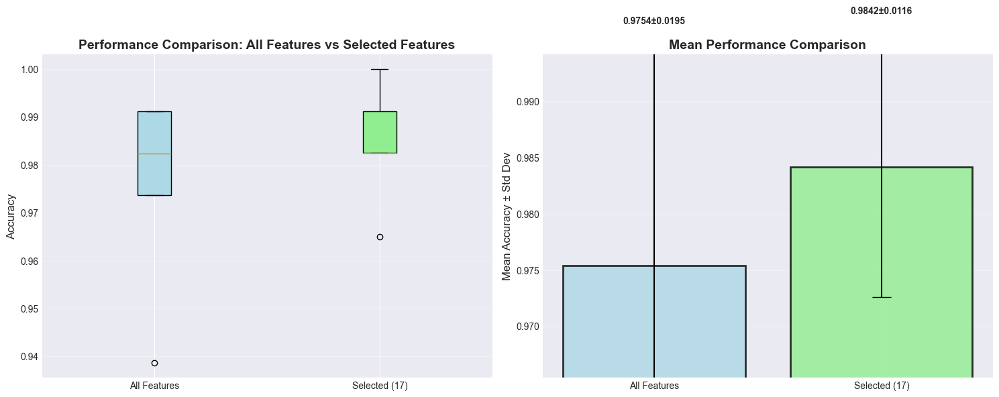


Performance Comparison:
  All Features: 0.975408 ± 0.019525
  Selected Features (17): 0.984195 ± 0.011628
  Feature Reduction: 17/30 = 56.7%
  Performance Change: +0.88%

=== breast_cancer | svm | archimedean ===


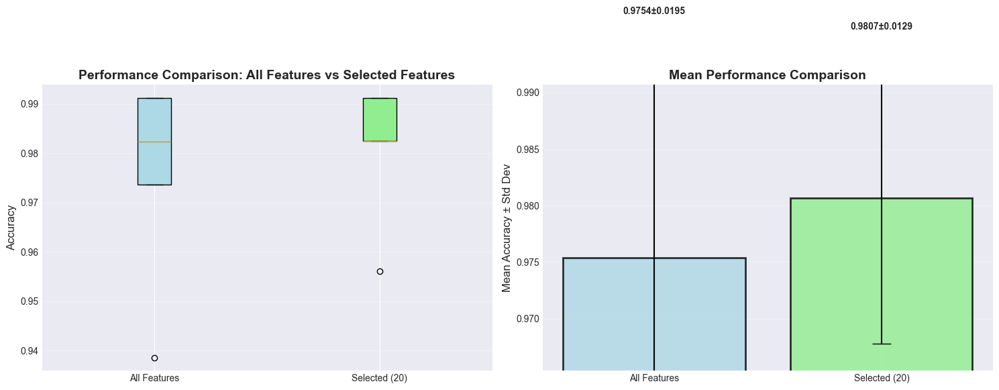


Performance Comparison:
  All Features: 0.975408 ± 0.019525
  Selected Features (20): 0.980686 ± 0.012879
  Feature Reduction: 20/30 = 66.7%
  Performance Change: +0.53%

=== breast_cancer | svm | logarithmic ===


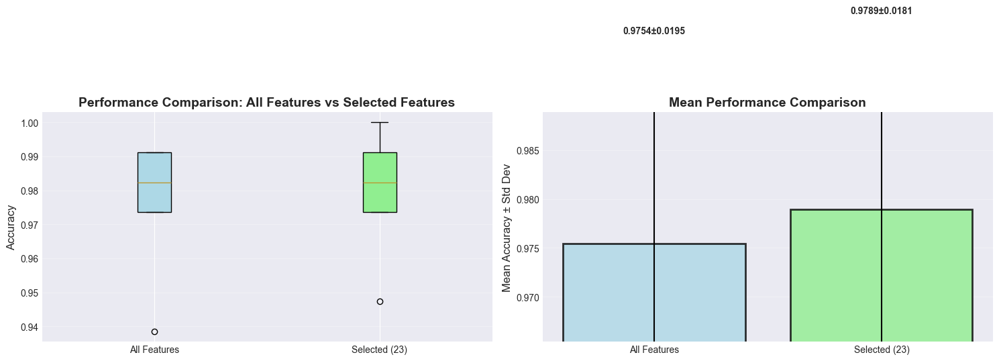


Performance Comparison:
  All Features: 0.975408 ± 0.019525
  Selected Features (23): 0.978916 ± 0.018057
  Feature Reduction: 23/30 = 76.7%
  Performance Change: +0.35%

=== breast_cancer | svm | fermat ===


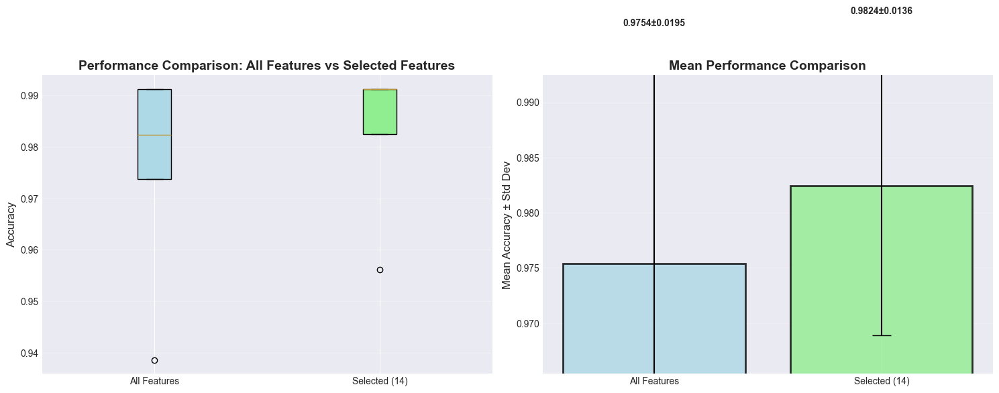


Performance Comparison:
  All Features: 0.975408 ± 0.019525
  Selected Features (14): 0.982441 ± 0.013579
  Feature Reduction: 14/30 = 46.7%
  Performance Change: +0.70%

=== breast_cancer | svm | hyperbolic ===


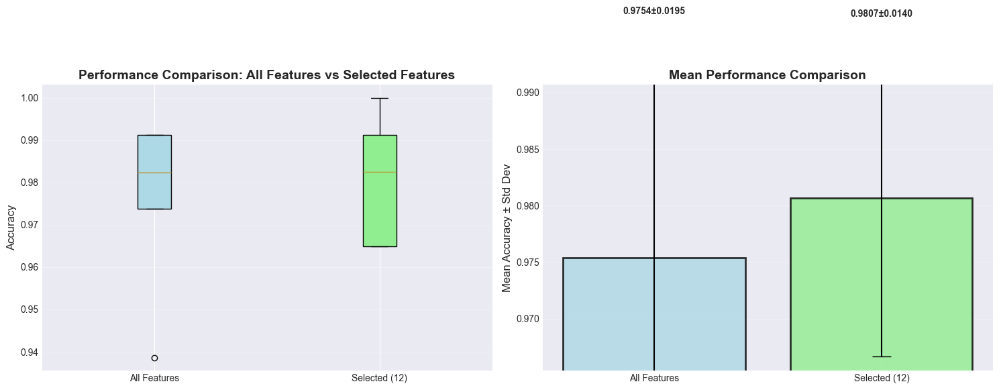


Performance Comparison:
  All Features: 0.975408 ± 0.019525
  Selected Features (12): 0.980686 ± 0.014023
  Feature Reduction: 12/30 = 40.0%
  Performance Change: +0.53%

=== breast_cancer | svm | euler ===


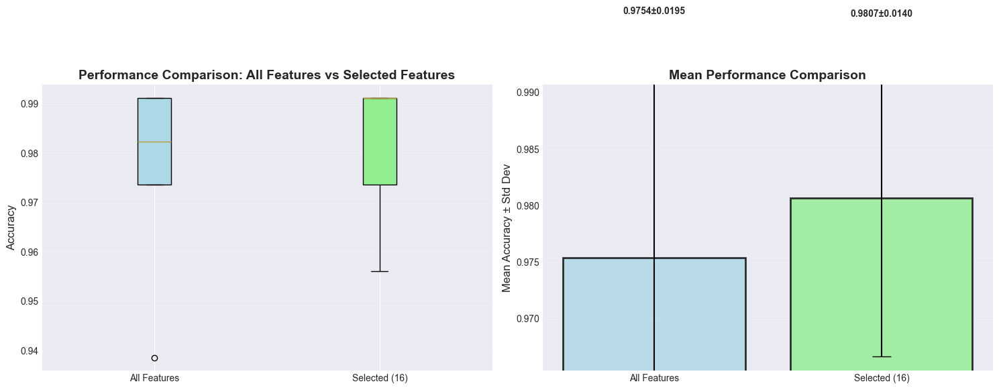


Performance Comparison:
  All Features: 0.975408 ± 0.019525
  Selected Features (16): 0.980686 ± 0.014023
  Feature Reduction: 16/30 = 53.3%
  Performance Change: +0.53%

=== breast_cancer | knn | standard ===


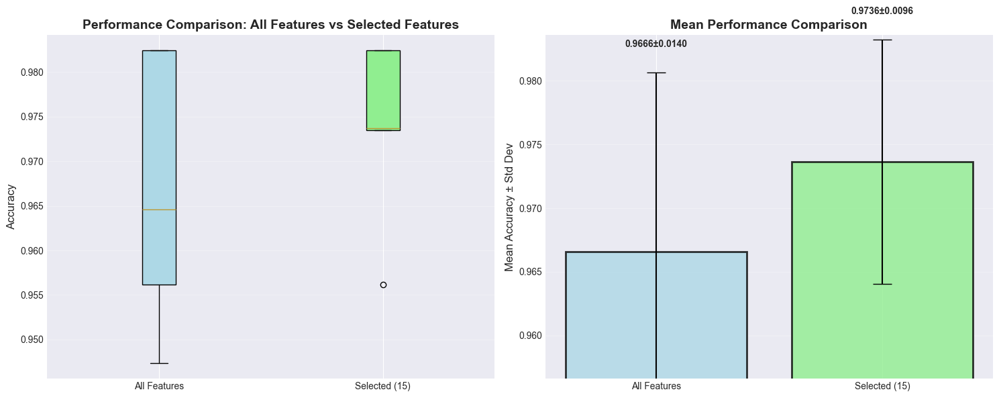


Performance Comparison:
  All Features: 0.966605 ± 0.014043
  Selected Features (15): 0.973638 ± 0.009610
  Feature Reduction: 15/30 = 50.0%
  Performance Change: +0.70%

=== breast_cancer | knn | archimedean ===


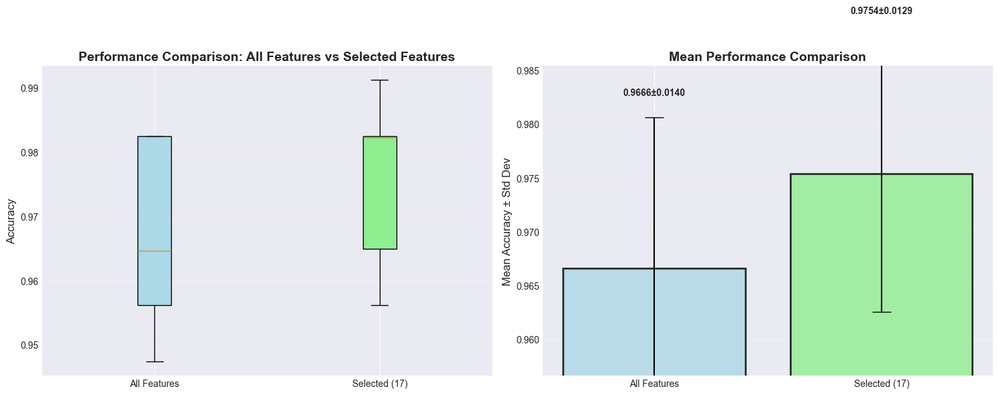


Performance Comparison:
  All Features: 0.966605 ± 0.014043
  Selected Features (17): 0.975408 ± 0.012875
  Feature Reduction: 17/30 = 56.7%
  Performance Change: +0.88%

=== breast_cancer | knn | logarithmic ===


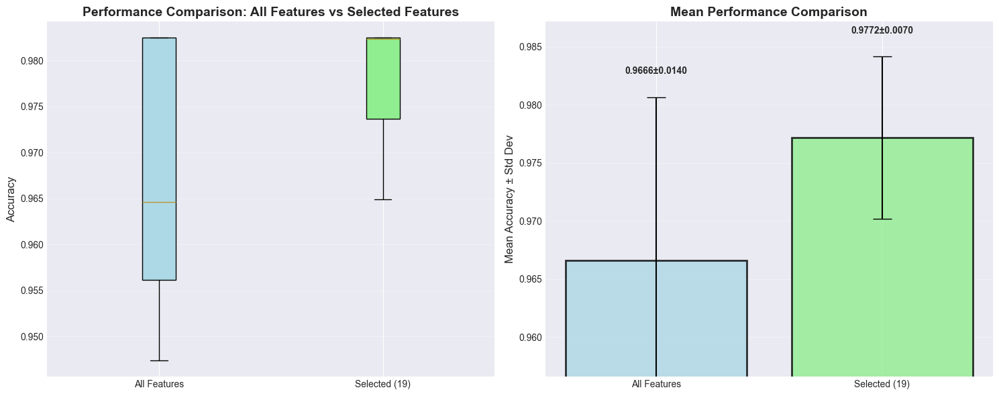


Performance Comparison:
  All Features: 0.966605 ± 0.014043
  Selected Features (19): 0.977162 ± 0.006994
  Feature Reduction: 19/30 = 63.3%
  Performance Change: +1.06%

=== breast_cancer | knn | fermat ===


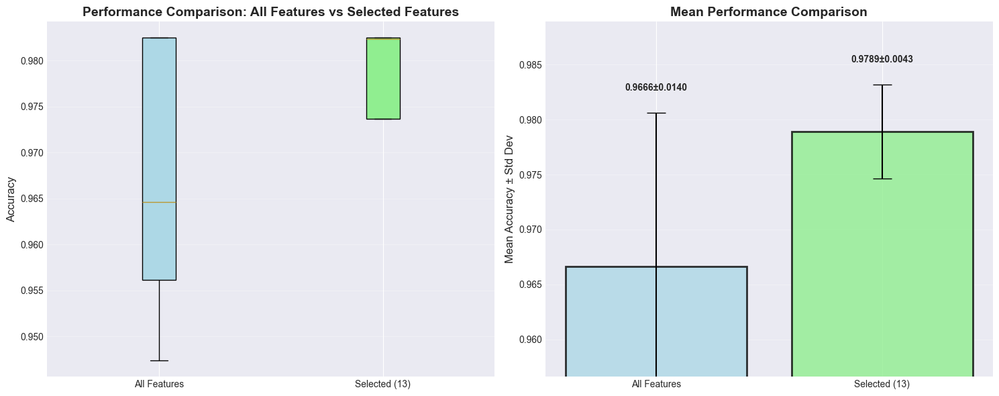


Performance Comparison:
  All Features: 0.966605 ± 0.014043
  Selected Features (13): 0.978916 ± 0.004272
  Feature Reduction: 13/30 = 43.3%
  Performance Change: +1.23%

=== breast_cancer | knn | hyperbolic ===


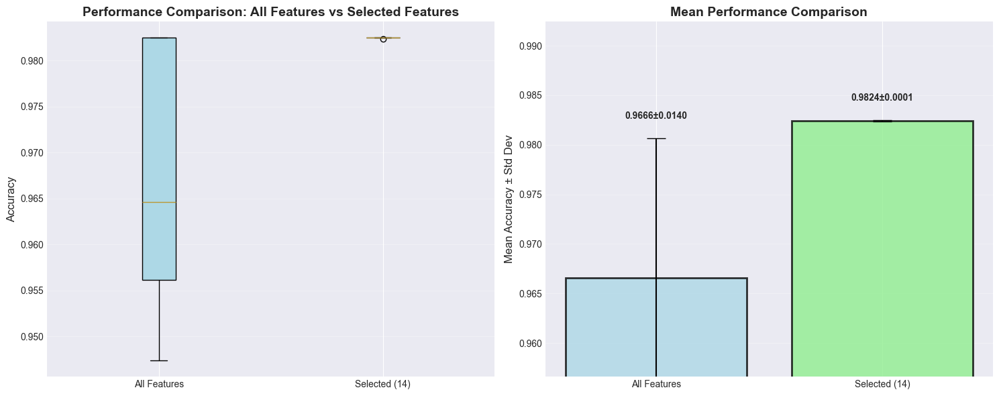


Performance Comparison:
  All Features: 0.966605 ± 0.014043
  Selected Features (14): 0.982425 ± 0.000062
  Feature Reduction: 14/30 = 46.7%
  Performance Change: +1.58%

=== breast_cancer | knn | euler ===


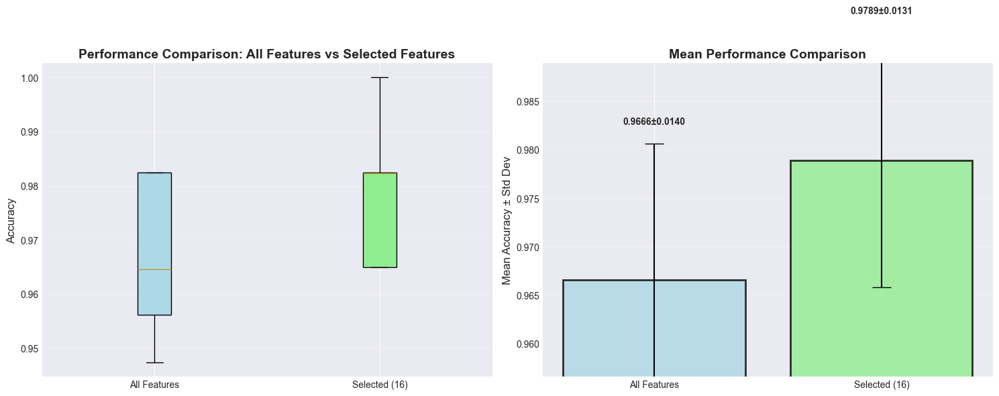


Performance Comparison:
  All Features: 0.966605 ± 0.014043
  Selected Features (16): 0.978916 ± 0.013120
  Feature Reduction: 16/30 = 53.3%
  Performance Change: +1.23%

=== wine | rf | standard ===


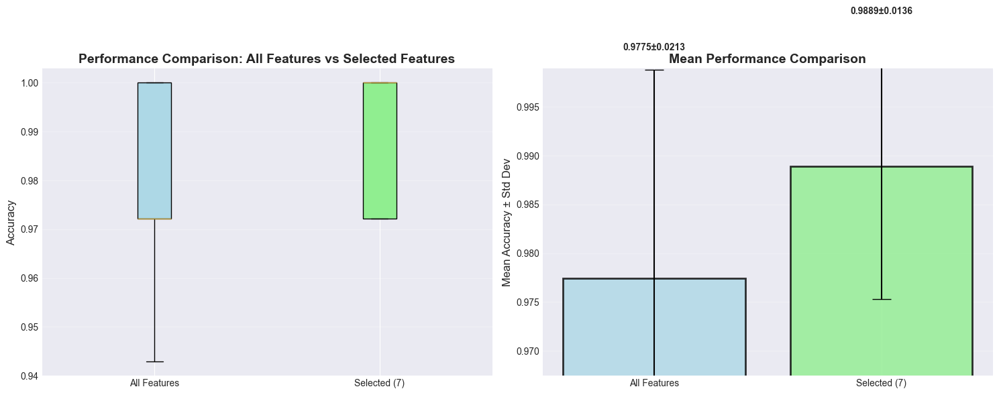


Performance Comparison:
  All Features: 0.977460 ± 0.021299
  Selected Features (7): 0.988889 ± 0.013608
  Feature Reduction: 7/13 = 53.8%
  Performance Change: +1.14%

=== wine | rf | archimedean ===


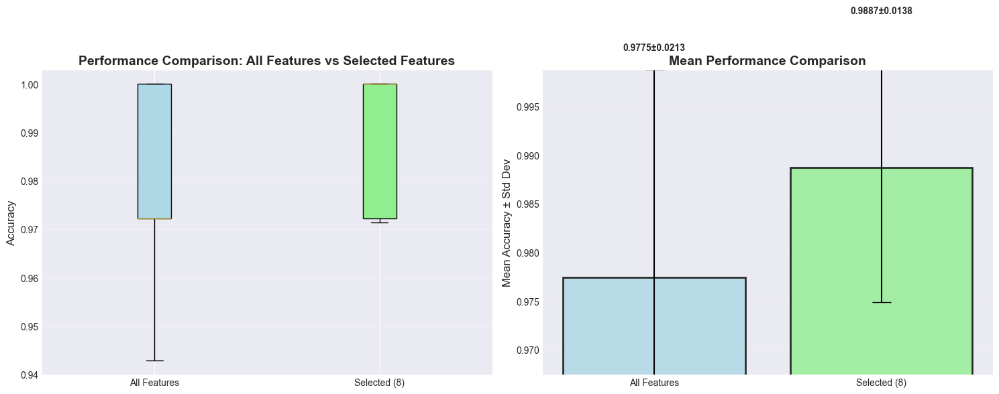


Performance Comparison:
  All Features: 0.977460 ± 0.021299
  Selected Features (8): 0.988730 ± 0.013805
  Feature Reduction: 8/13 = 61.5%
  Performance Change: +1.13%

=== wine | rf | logarithmic ===


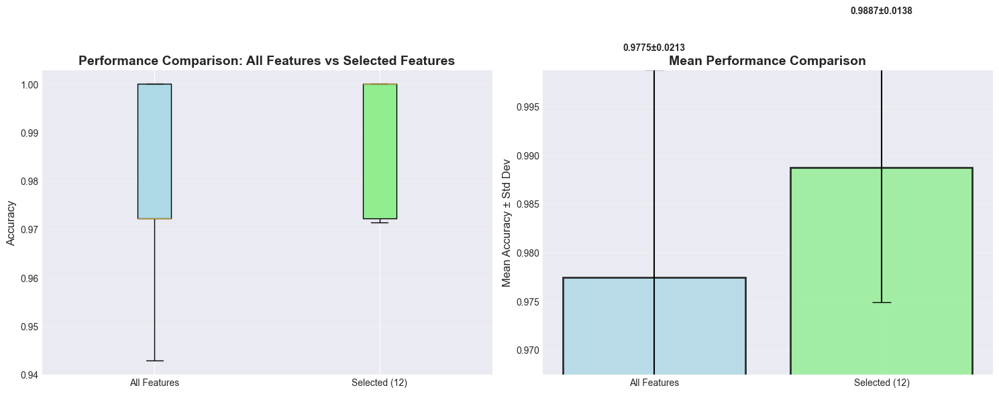


Performance Comparison:
  All Features: 0.977460 ± 0.021299
  Selected Features (12): 0.988730 ± 0.013805
  Feature Reduction: 12/13 = 92.3%
  Performance Change: +1.13%

=== wine | rf | fermat ===


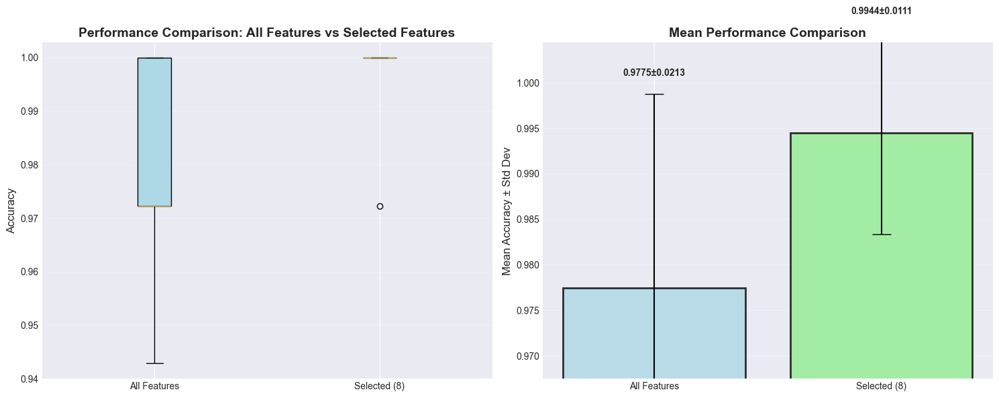


Performance Comparison:
  All Features: 0.977460 ± 0.021299
  Selected Features (8): 0.994444 ± 0.011111
  Feature Reduction: 8/13 = 61.5%
  Performance Change: +1.70%

=== wine | rf | hyperbolic ===


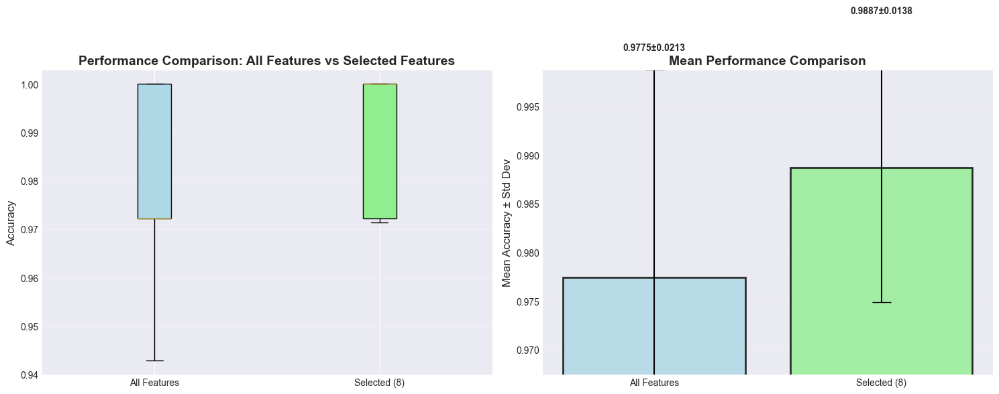


Performance Comparison:
  All Features: 0.977460 ± 0.021299
  Selected Features (8): 0.988730 ± 0.013805
  Feature Reduction: 8/13 = 61.5%
  Performance Change: +1.13%

=== wine | rf | euler ===


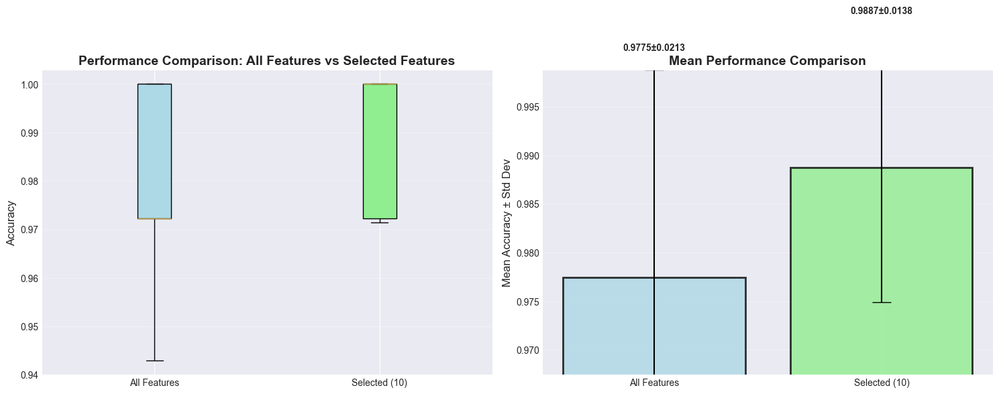


Performance Comparison:
  All Features: 0.977460 ± 0.021299
  Selected Features (10): 0.988730 ± 0.013805
  Feature Reduction: 10/13 = 76.9%
  Performance Change: +1.13%

=== wine | svm | standard ===


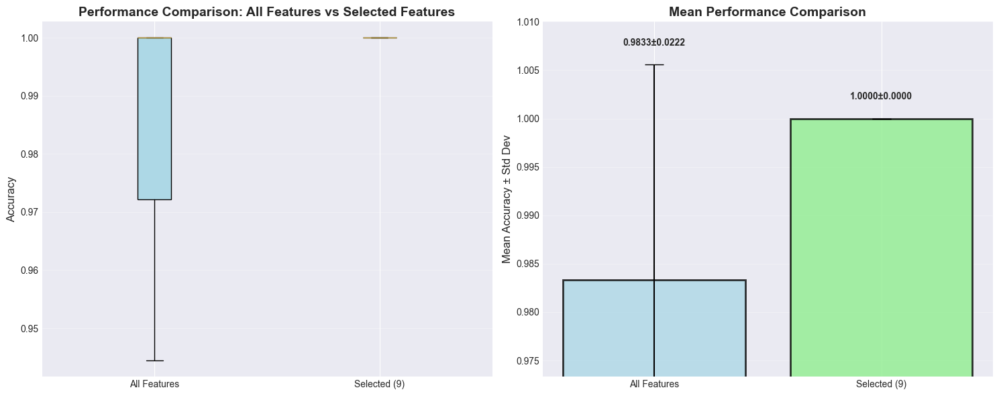


Performance Comparison:
  All Features: 0.983333 ± 0.022222
  Selected Features (9): 1.000000 ± 0.000000
  Feature Reduction: 9/13 = 69.2%
  Performance Change: +1.67%

=== wine | svm | archimedean ===


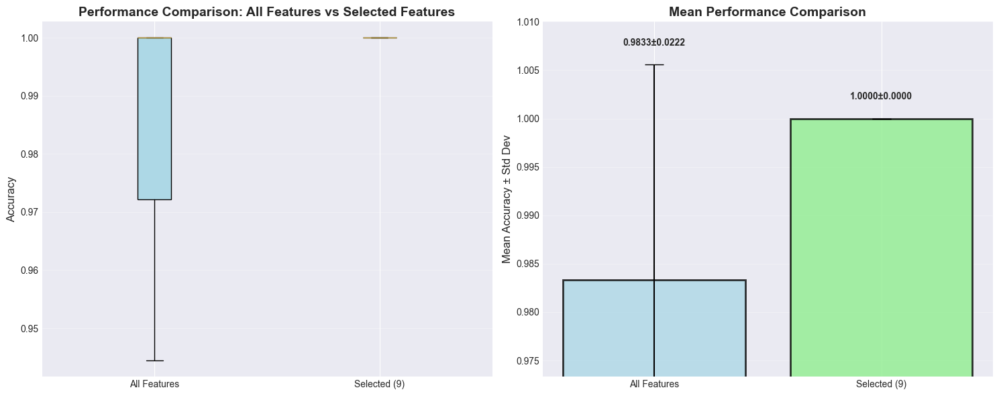


Performance Comparison:
  All Features: 0.983333 ± 0.022222
  Selected Features (9): 1.000000 ± 0.000000
  Feature Reduction: 9/13 = 69.2%
  Performance Change: +1.67%

=== wine | svm | logarithmic ===


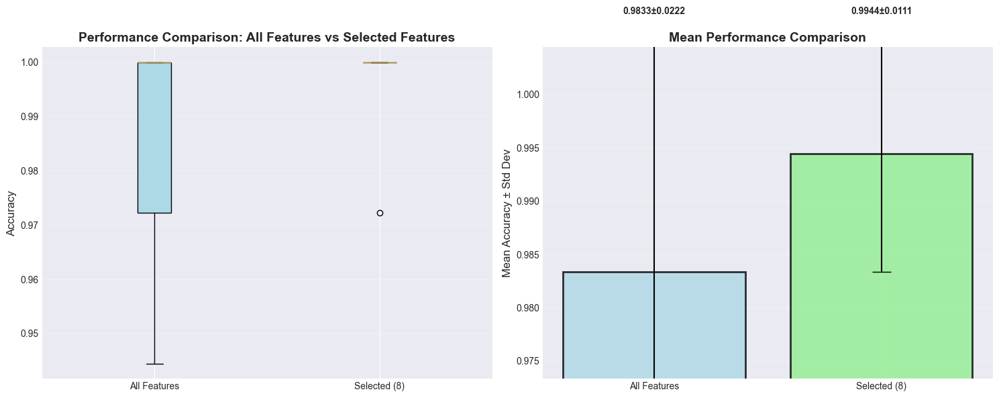


Performance Comparison:
  All Features: 0.983333 ± 0.022222
  Selected Features (8): 0.994444 ± 0.011111
  Feature Reduction: 8/13 = 61.5%
  Performance Change: +1.11%

=== wine | svm | fermat ===


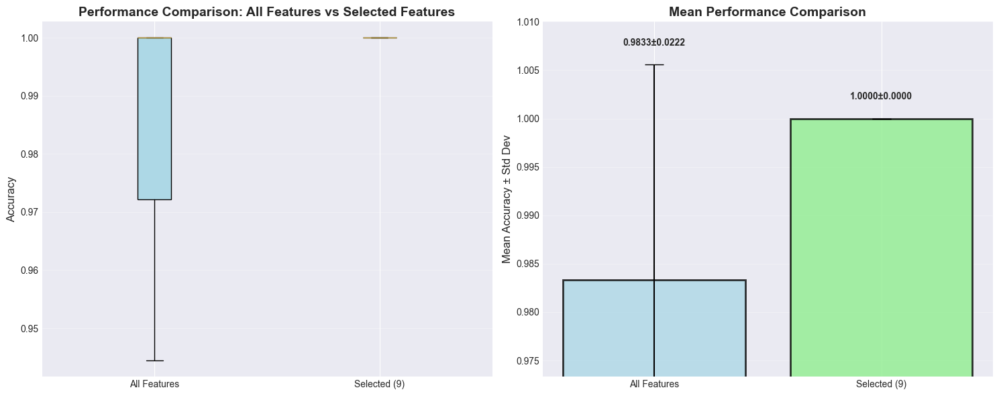


Performance Comparison:
  All Features: 0.983333 ± 0.022222
  Selected Features (9): 1.000000 ± 0.000000
  Feature Reduction: 9/13 = 69.2%
  Performance Change: +1.67%

=== wine | svm | hyperbolic ===


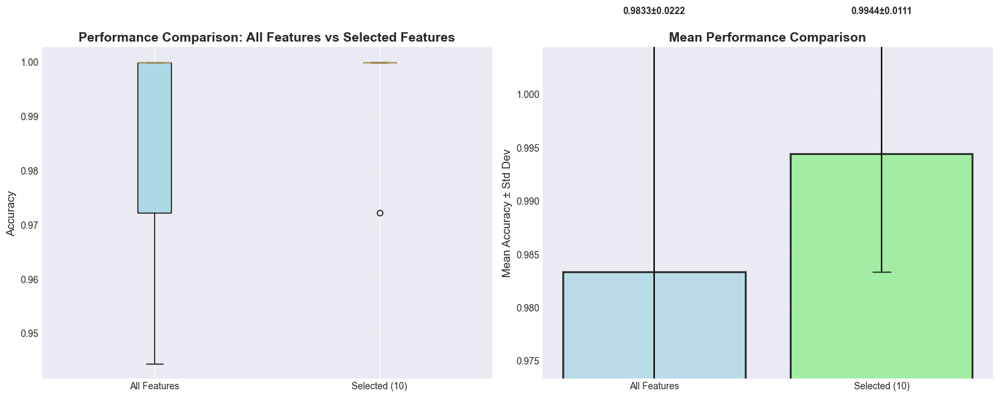


Performance Comparison:
  All Features: 0.983333 ± 0.022222
  Selected Features (10): 0.994444 ± 0.011111
  Feature Reduction: 10/13 = 76.9%
  Performance Change: +1.11%

=== wine | svm | euler ===


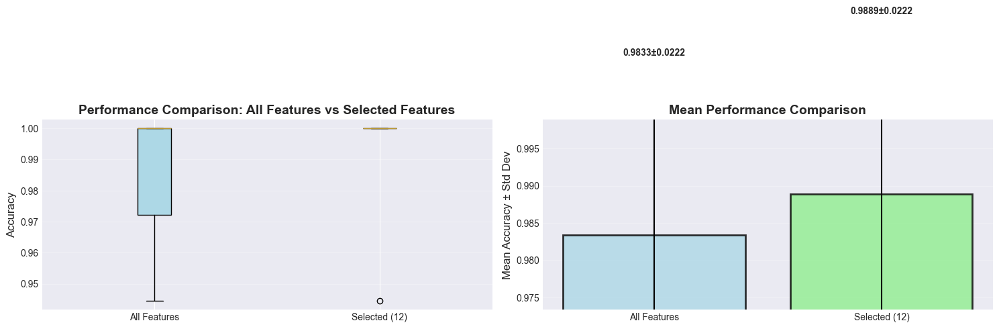


Performance Comparison:
  All Features: 0.983333 ± 0.022222
  Selected Features (12): 0.988889 ± 0.022222
  Feature Reduction: 12/13 = 92.3%
  Performance Change: +0.56%

=== wine | knn | standard ===


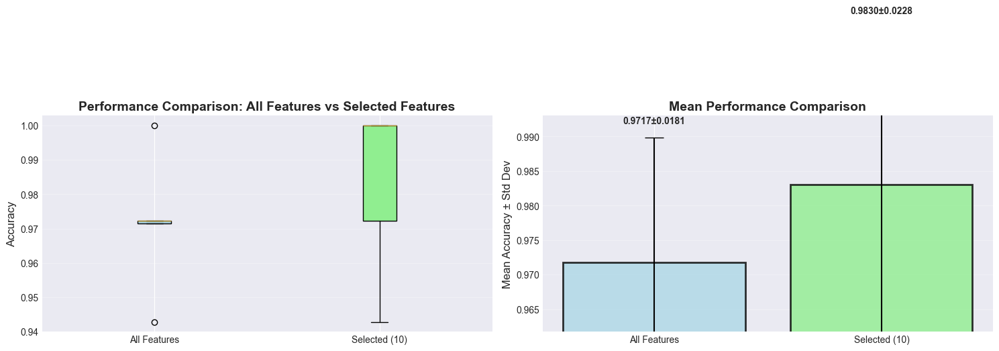


Performance Comparison:
  All Features: 0.971746 ± 0.018074
  Selected Features (10): 0.983016 ± 0.022780
  Feature Reduction: 10/13 = 76.9%
  Performance Change: +1.13%

=== wine | knn | archimedean ===


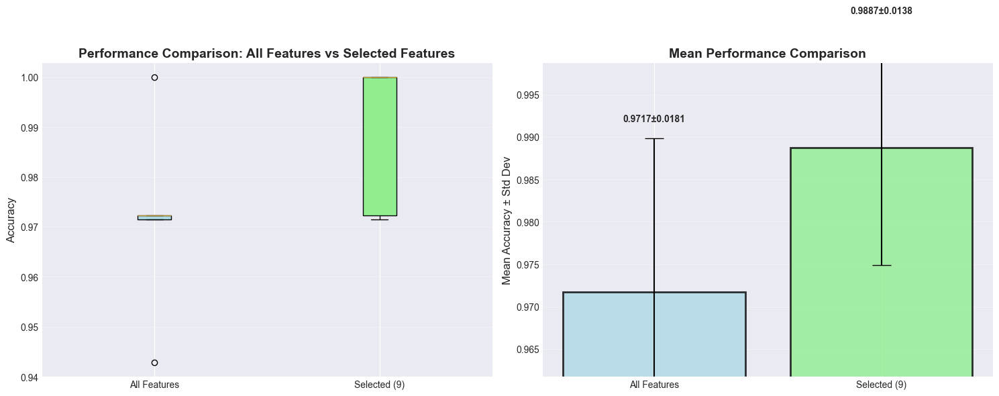


Performance Comparison:
  All Features: 0.971746 ± 0.018074
  Selected Features (9): 0.988730 ± 0.013805
  Feature Reduction: 9/13 = 69.2%
  Performance Change: +1.70%

=== wine | knn | logarithmic ===


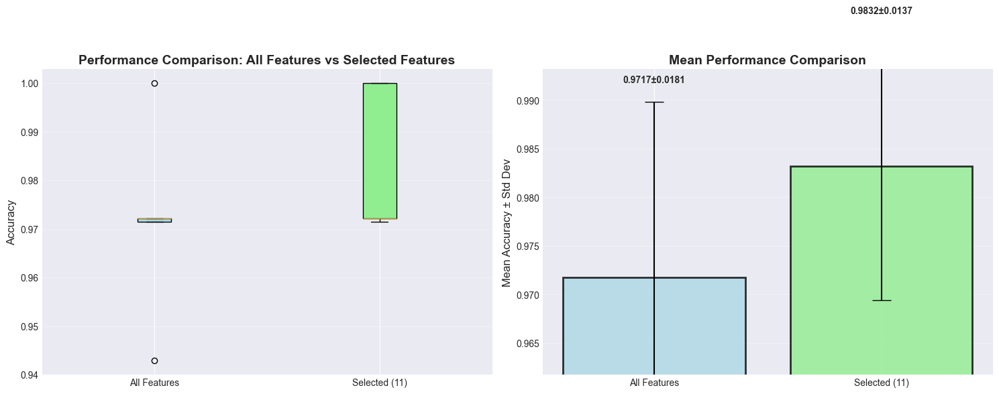


Performance Comparison:
  All Features: 0.971746 ± 0.018074
  Selected Features (11): 0.983175 ± 0.013741
  Feature Reduction: 11/13 = 84.6%
  Performance Change: +1.14%

=== wine | knn | fermat ===


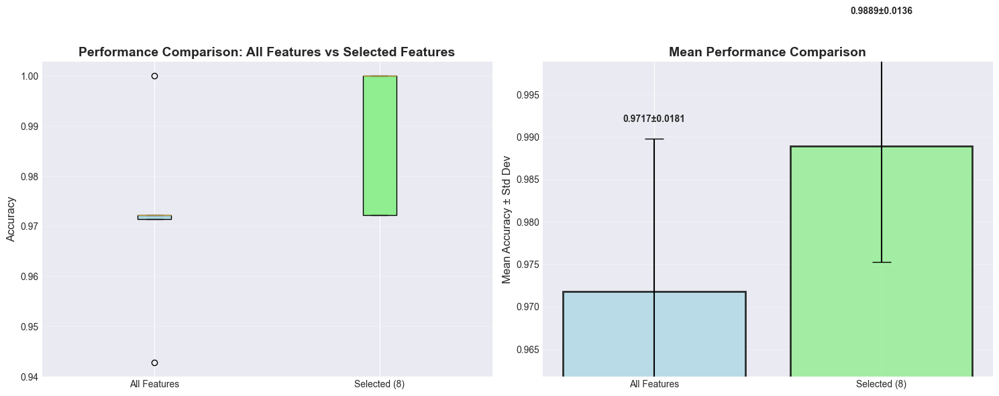


Performance Comparison:
  All Features: 0.971746 ± 0.018074
  Selected Features (8): 0.988889 ± 0.013608
  Feature Reduction: 8/13 = 61.5%
  Performance Change: +1.71%

=== wine | knn | hyperbolic ===


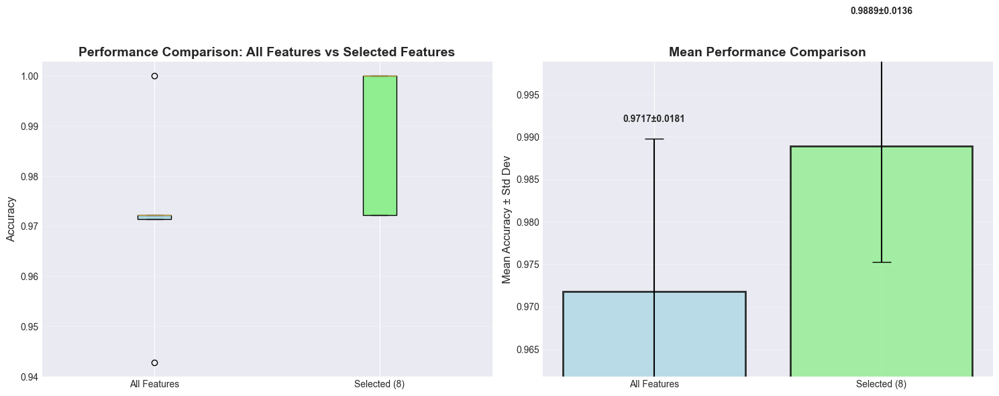


Performance Comparison:
  All Features: 0.971746 ± 0.018074
  Selected Features (8): 0.988889 ± 0.013608
  Feature Reduction: 8/13 = 61.5%
  Performance Change: +1.71%

=== wine | knn | euler ===


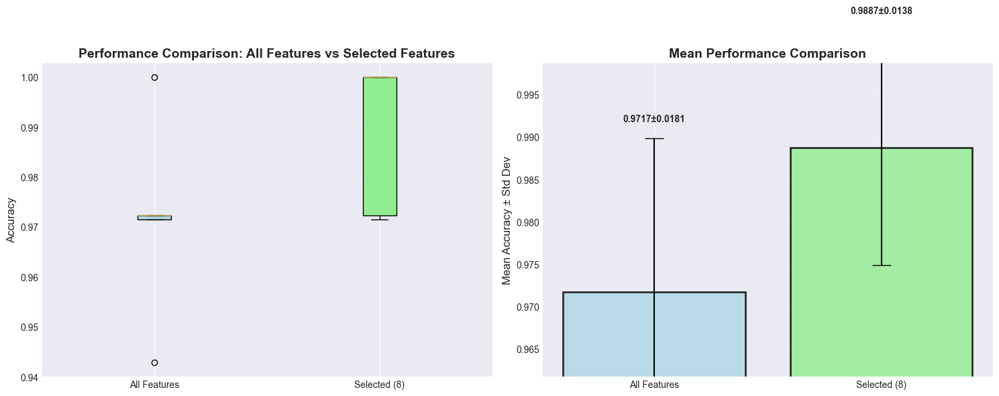


Performance Comparison:
  All Features: 0.971746 ± 0.018074
  Selected Features (8): 0.988730 ± 0.013805
  Feature Reduction: 8/13 = 61.5%
  Performance Change: +1.70%

=== iris | rf | standard ===


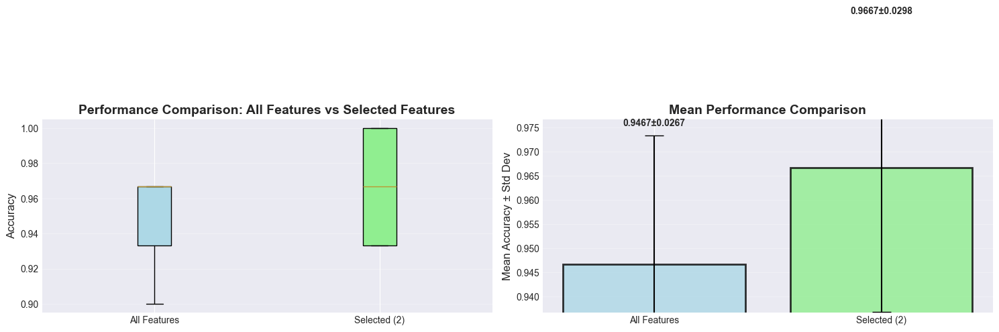


Performance Comparison:
  All Features: 0.946667 ± 0.026667
  Selected Features (2): 0.966667 ± 0.029814
  Feature Reduction: 2/4 = 50.0%
  Performance Change: +2.00%

=== iris | rf | archimedean ===


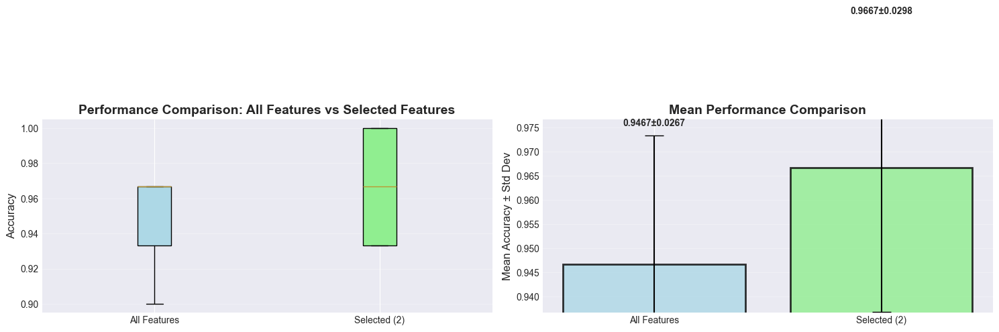


Performance Comparison:
  All Features: 0.946667 ± 0.026667
  Selected Features (2): 0.966667 ± 0.029814
  Feature Reduction: 2/4 = 50.0%
  Performance Change: +2.00%

=== iris | rf | logarithmic ===


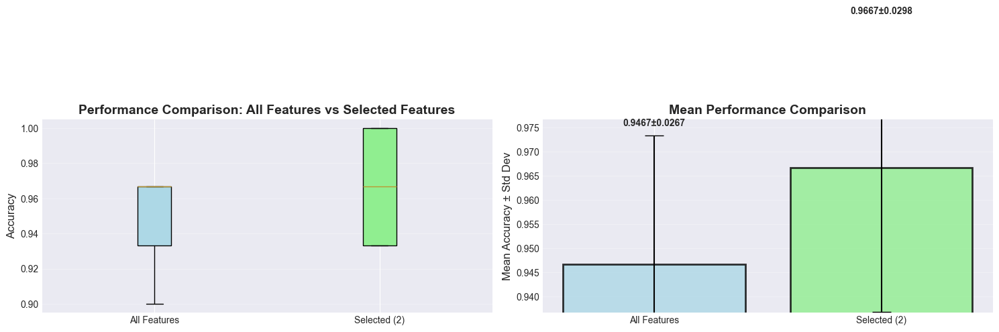


Performance Comparison:
  All Features: 0.946667 ± 0.026667
  Selected Features (2): 0.966667 ± 0.029814
  Feature Reduction: 2/4 = 50.0%
  Performance Change: +2.00%

=== iris | rf | fermat ===


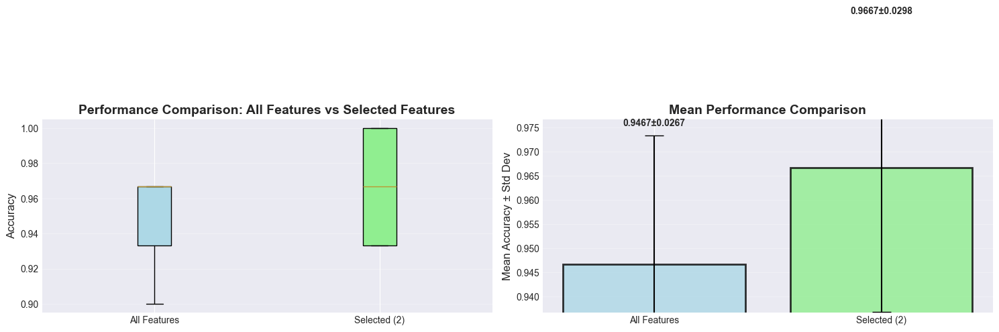


Performance Comparison:
  All Features: 0.946667 ± 0.026667
  Selected Features (2): 0.966667 ± 0.029814
  Feature Reduction: 2/4 = 50.0%
  Performance Change: +2.00%

=== iris | rf | hyperbolic ===


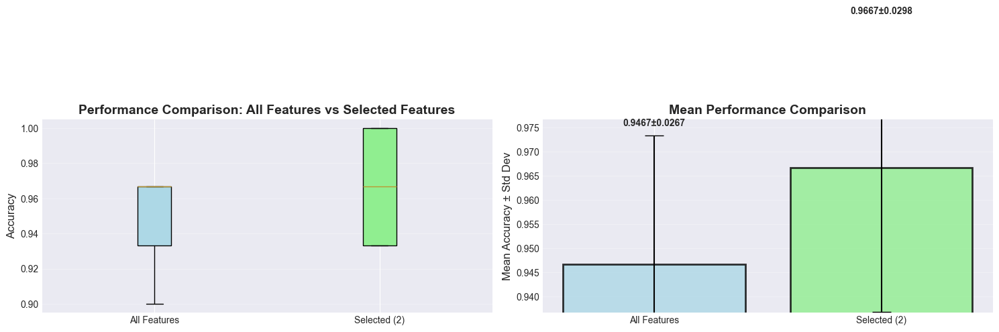


Performance Comparison:
  All Features: 0.946667 ± 0.026667
  Selected Features (2): 0.966667 ± 0.029814
  Feature Reduction: 2/4 = 50.0%
  Performance Change: +2.00%

=== iris | rf | euler ===


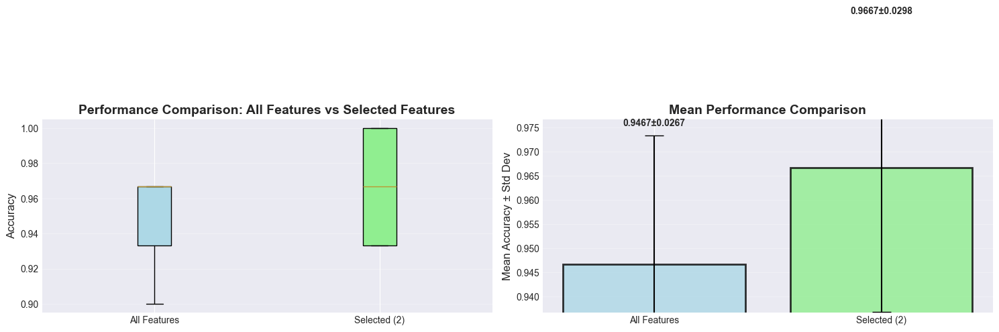


Performance Comparison:
  All Features: 0.946667 ± 0.026667
  Selected Features (2): 0.966667 ± 0.029814
  Feature Reduction: 2/4 = 50.0%
  Performance Change: +2.00%

=== iris | svm | standard ===


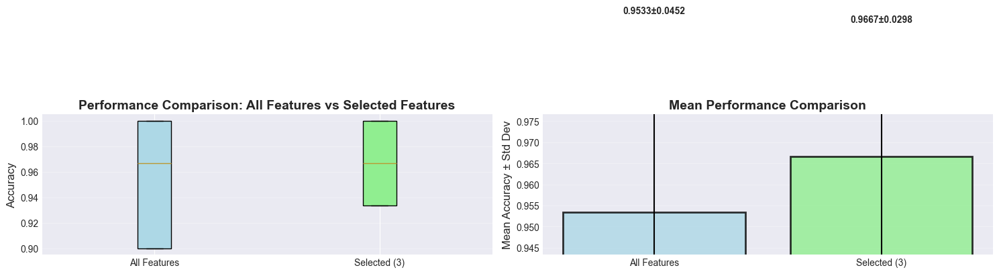


Performance Comparison:
  All Features: 0.953333 ± 0.045216
  Selected Features (3): 0.966667 ± 0.029814
  Feature Reduction: 3/4 = 75.0%
  Performance Change: +1.33%

=== iris | svm | archimedean ===


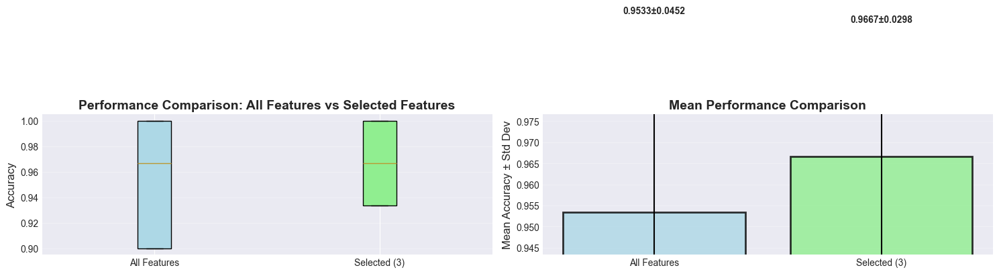


Performance Comparison:
  All Features: 0.953333 ± 0.045216
  Selected Features (3): 0.966667 ± 0.029814
  Feature Reduction: 3/4 = 75.0%
  Performance Change: +1.33%

=== iris | svm | logarithmic ===


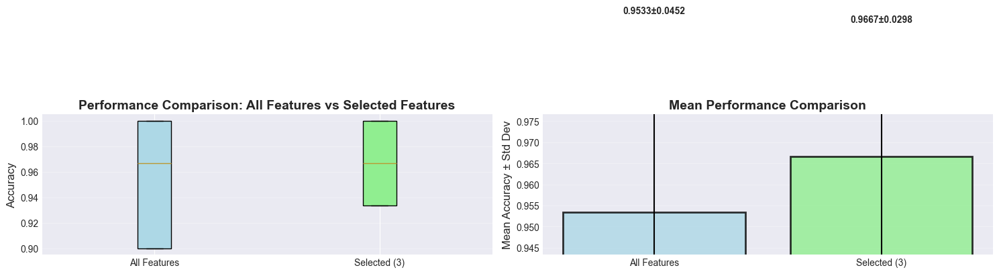


Performance Comparison:
  All Features: 0.953333 ± 0.045216
  Selected Features (3): 0.966667 ± 0.029814
  Feature Reduction: 3/4 = 75.0%
  Performance Change: +1.33%

=== iris | svm | fermat ===


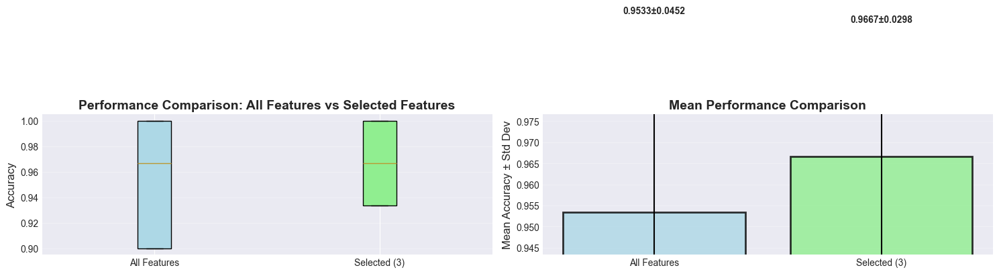


Performance Comparison:
  All Features: 0.953333 ± 0.045216
  Selected Features (3): 0.966667 ± 0.029814
  Feature Reduction: 3/4 = 75.0%
  Performance Change: +1.33%

=== iris | svm | hyperbolic ===


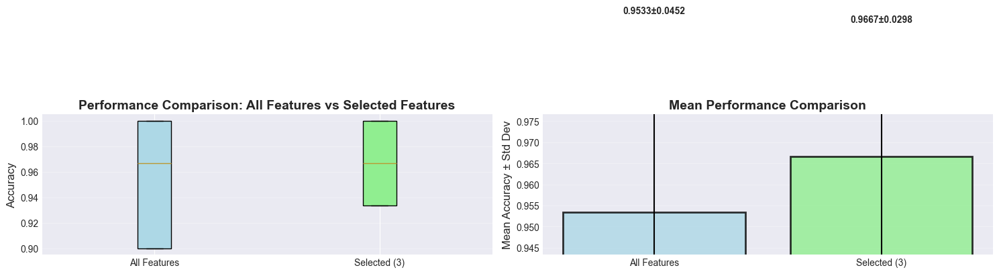


Performance Comparison:
  All Features: 0.953333 ± 0.045216
  Selected Features (3): 0.966667 ± 0.029814
  Feature Reduction: 3/4 = 75.0%
  Performance Change: +1.33%

=== iris | svm | euler ===


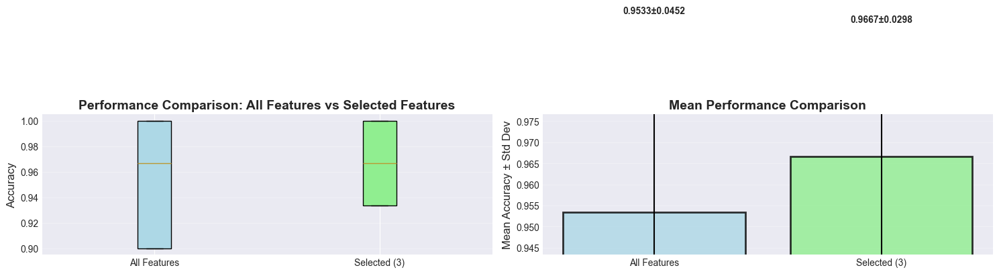


Performance Comparison:
  All Features: 0.953333 ± 0.045216
  Selected Features (3): 0.966667 ± 0.029814
  Feature Reduction: 3/4 = 75.0%
  Performance Change: +1.33%

=== iris | knn | standard ===


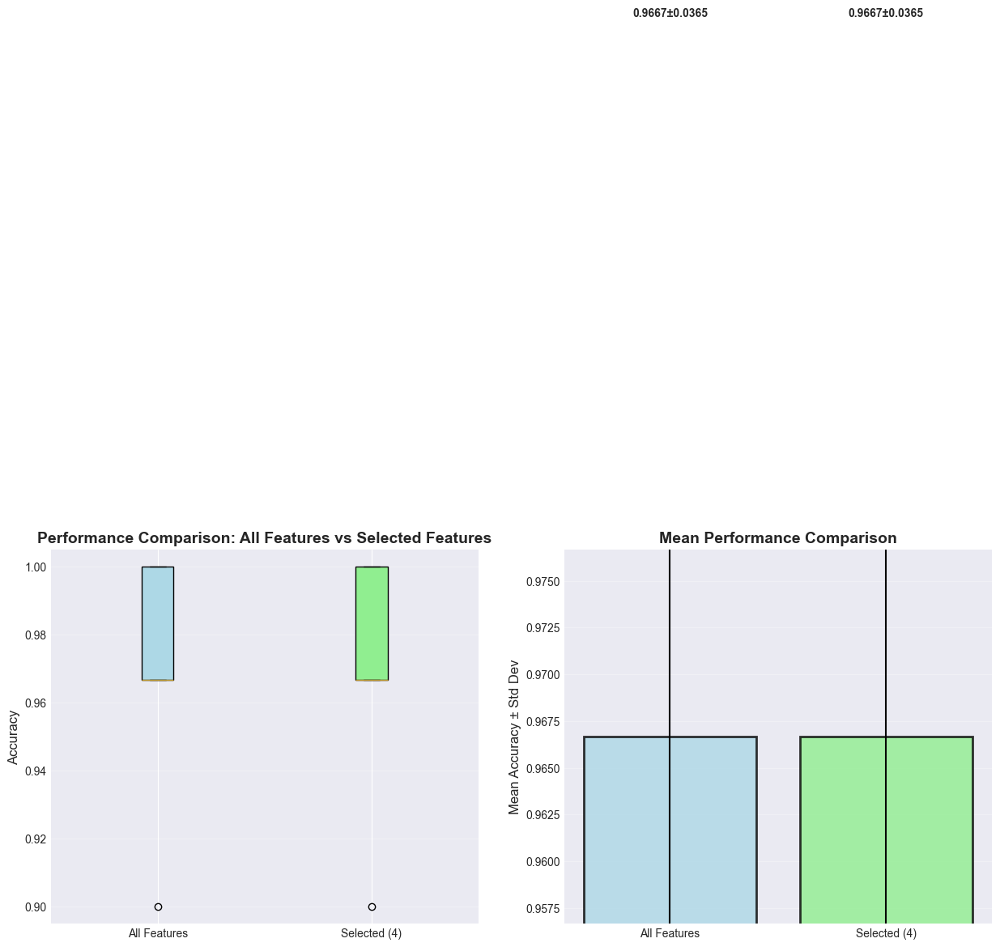


Performance Comparison:
  All Features: 0.966667 ± 0.036515
  Selected Features (4): 0.966667 ± 0.036515
  Feature Reduction: 4/4 = 100.0%
  Performance Change: +0.00%

=== iris | knn | archimedean ===


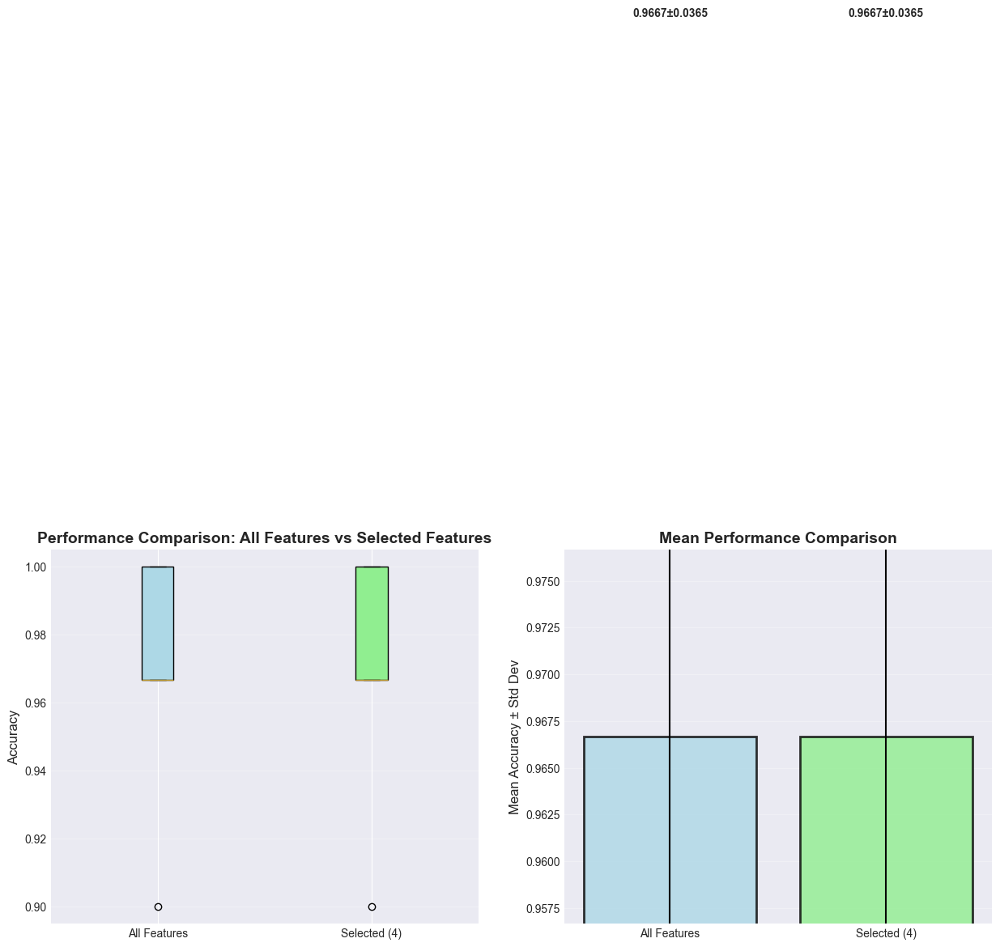


Performance Comparison:
  All Features: 0.966667 ± 0.036515
  Selected Features (4): 0.966667 ± 0.036515
  Feature Reduction: 4/4 = 100.0%
  Performance Change: +0.00%

=== iris | knn | logarithmic ===


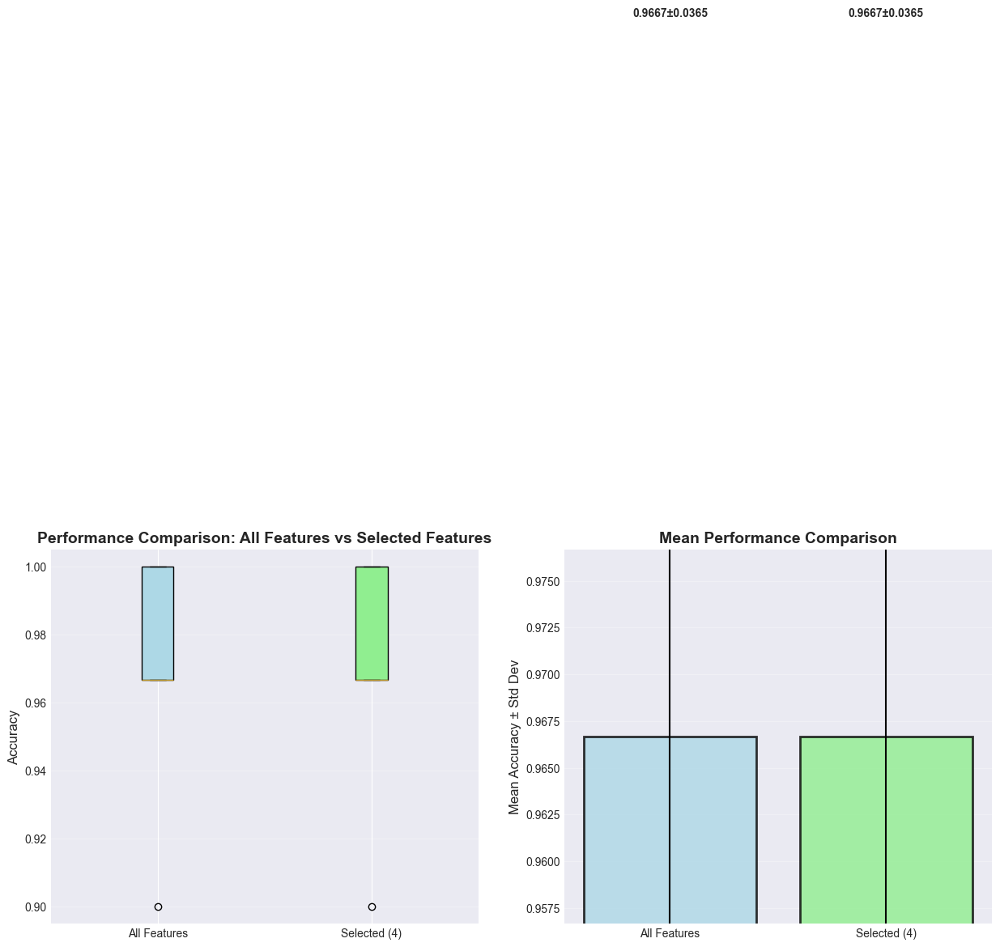


Performance Comparison:
  All Features: 0.966667 ± 0.036515
  Selected Features (4): 0.966667 ± 0.036515
  Feature Reduction: 4/4 = 100.0%
  Performance Change: +0.00%

=== iris | knn | fermat ===


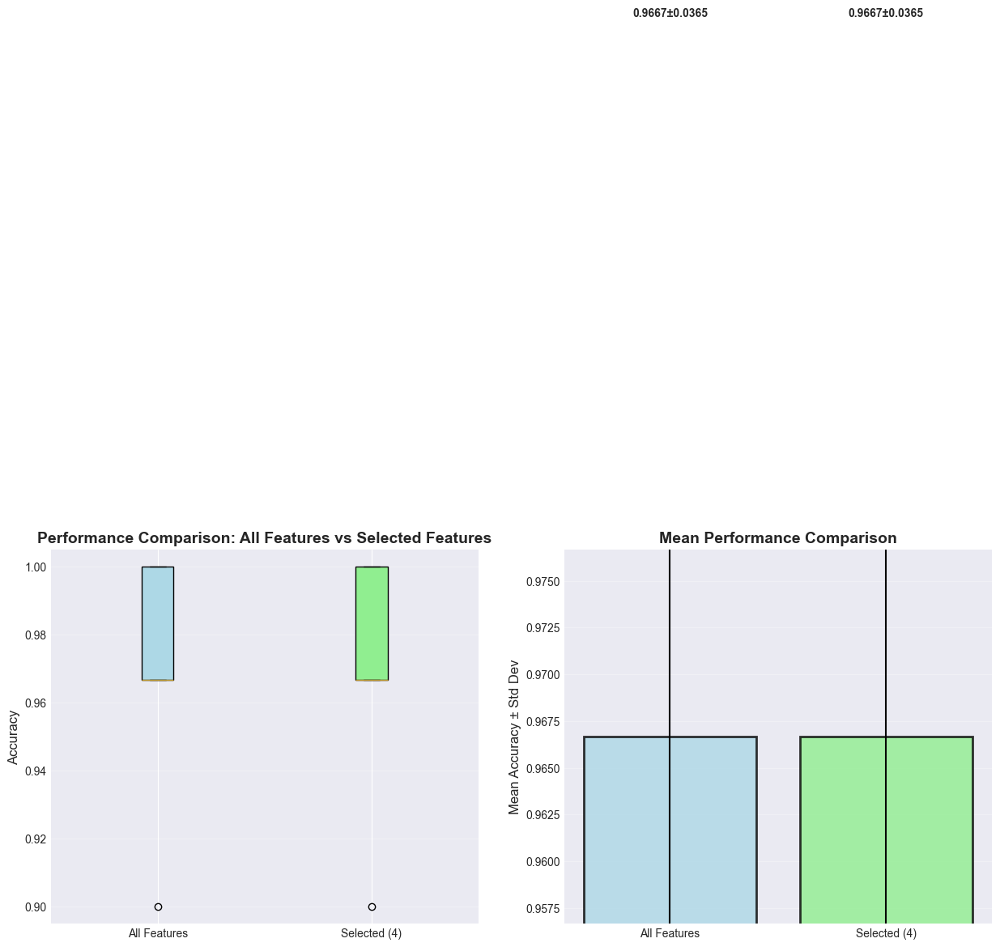


Performance Comparison:
  All Features: 0.966667 ± 0.036515
  Selected Features (4): 0.966667 ± 0.036515
  Feature Reduction: 4/4 = 100.0%
  Performance Change: +0.00%

=== iris | knn | hyperbolic ===


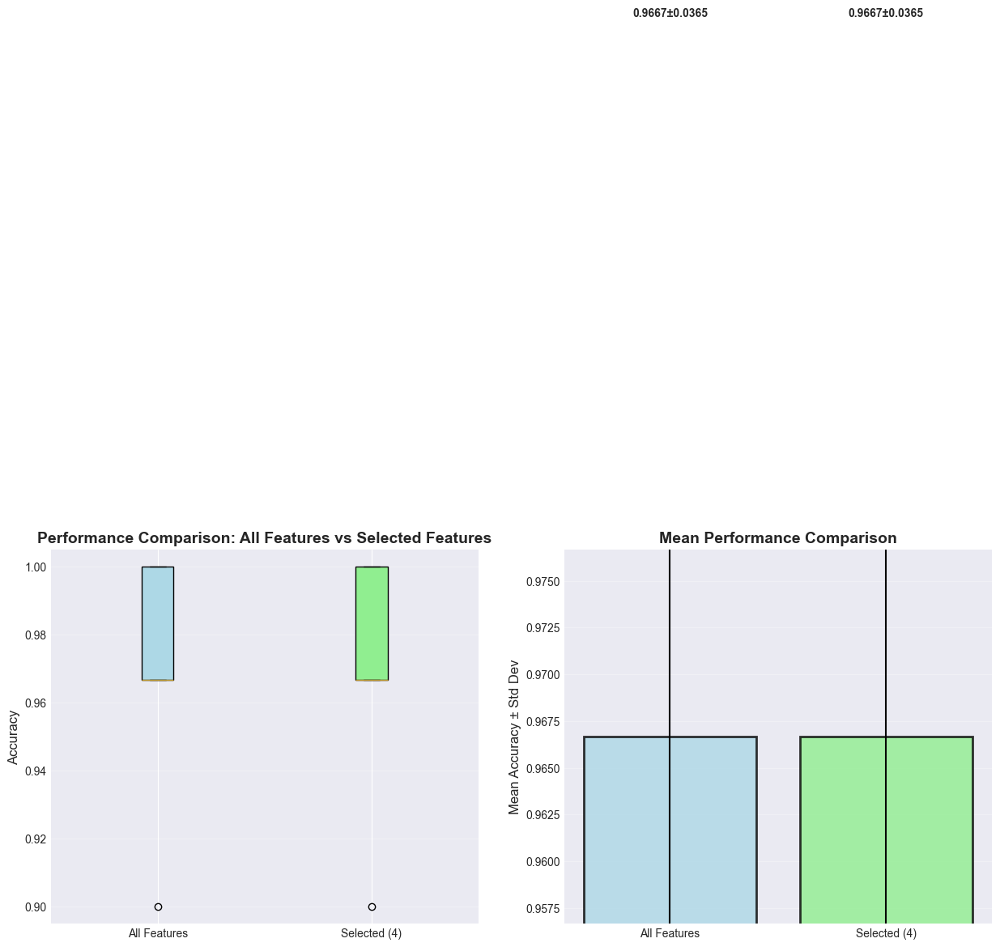


Performance Comparison:
  All Features: 0.966667 ± 0.036515
  Selected Features (4): 0.966667 ± 0.036515
  Feature Reduction: 4/4 = 100.0%
  Performance Change: +0.00%

=== iris | knn | euler ===


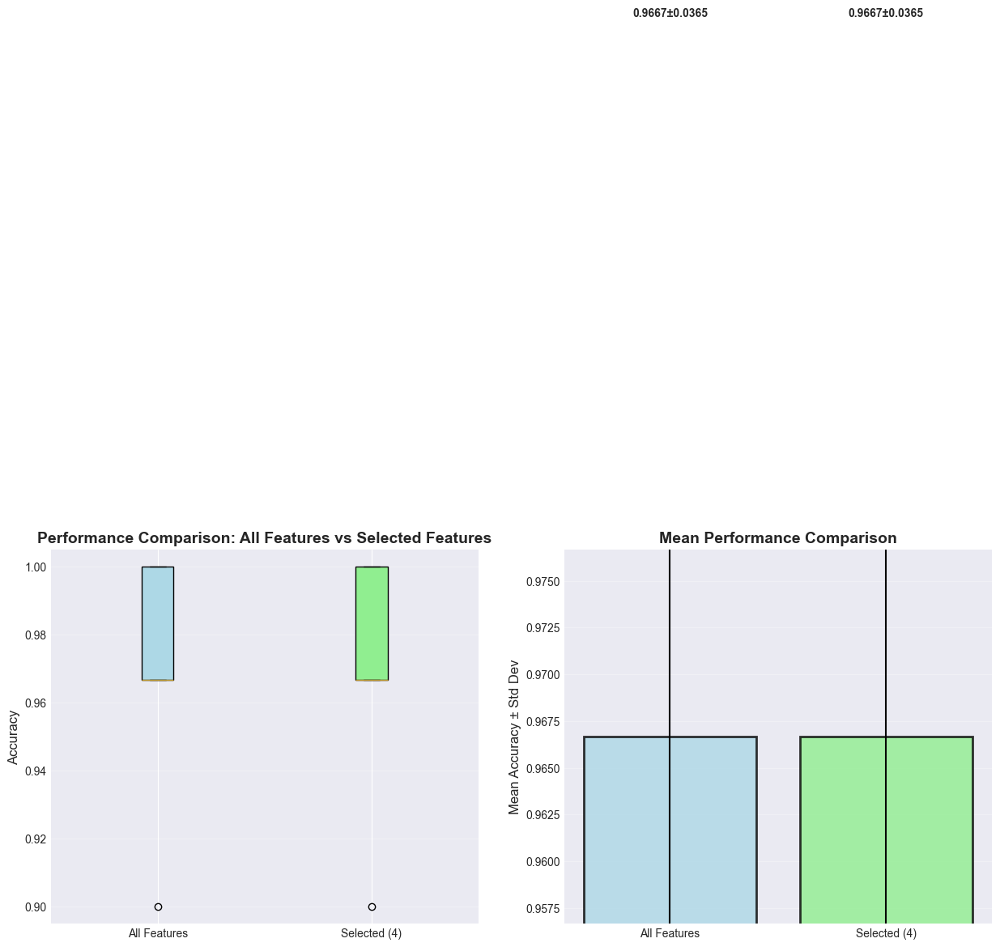


Performance Comparison:
  All Features: 0.966667 ± 0.036515
  Selected Features (4): 0.966667 ± 0.036515
  Feature Reduction: 4/4 = 100.0%
  Performance Change: +0.00%

=== digits | rf | standard ===


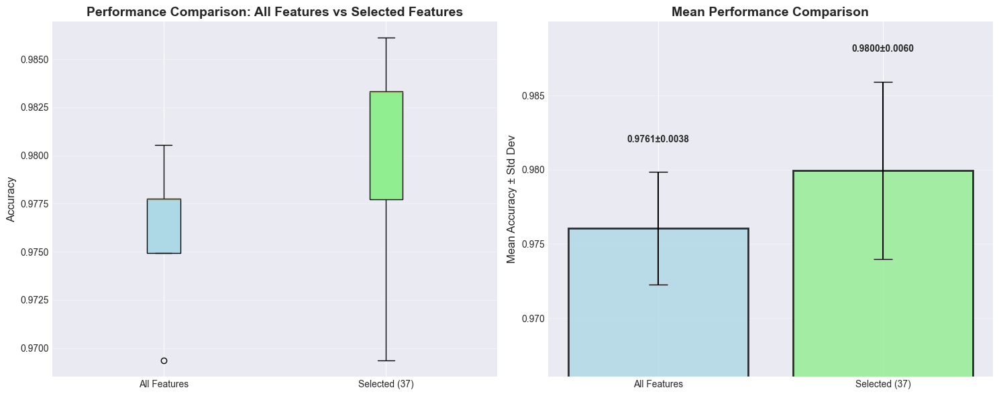


Performance Comparison:
  All Features: 0.976068 ± 0.003797
  Selected Features (37): 0.979961 ± 0.005961
  Feature Reduction: 37/64 = 57.8%
  Performance Change: +0.39%

=== digits | rf | archimedean ===


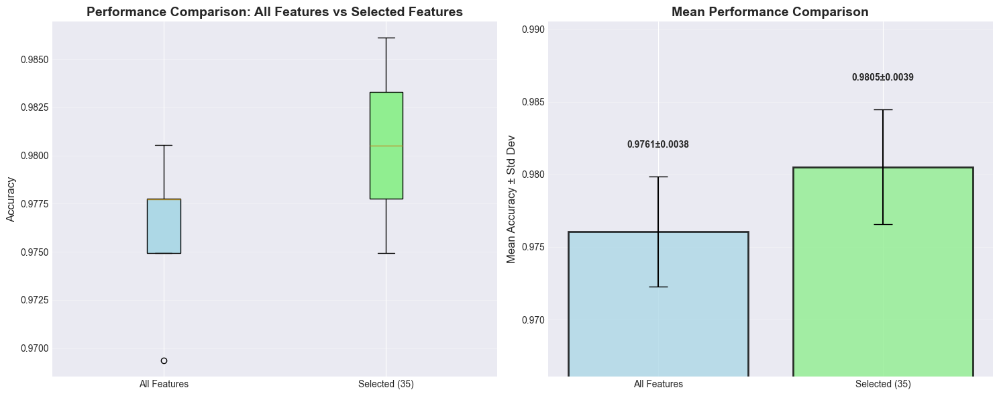


Performance Comparison:
  All Features: 0.976068 ± 0.003797
  Selected Features (35): 0.980522 ± 0.003942
  Feature Reduction: 35/64 = 54.7%
  Performance Change: +0.45%

=== digits | rf | logarithmic ===


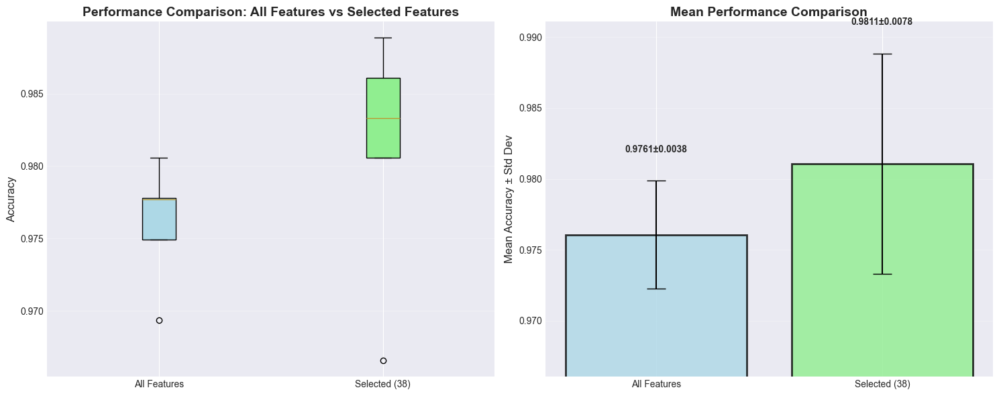


Performance Comparison:
  All Features: 0.976068 ± 0.003797
  Selected Features (38): 0.981079 ± 0.007761
  Feature Reduction: 38/64 = 59.4%
  Performance Change: +0.50%

=== digits | rf | fermat ===


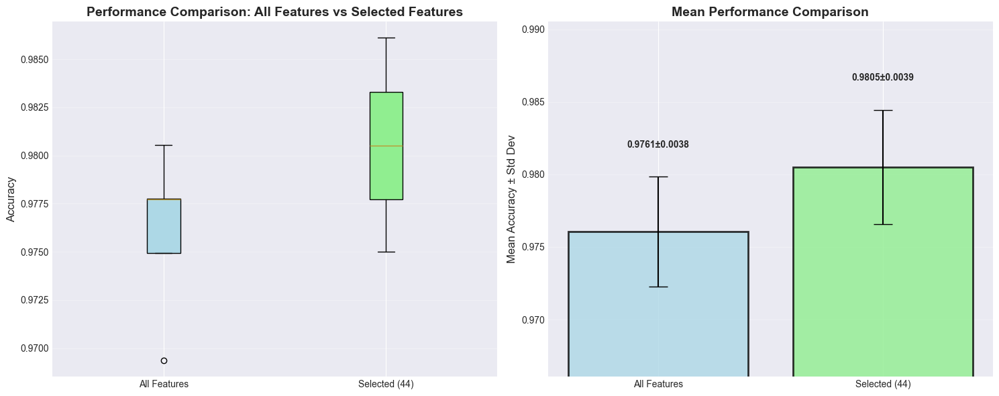


Performance Comparison:
  All Features: 0.976068 ± 0.003797
  Selected Features (44): 0.980523 ± 0.003931
  Feature Reduction: 44/64 = 68.8%
  Performance Change: +0.45%

=== digits | rf | hyperbolic ===


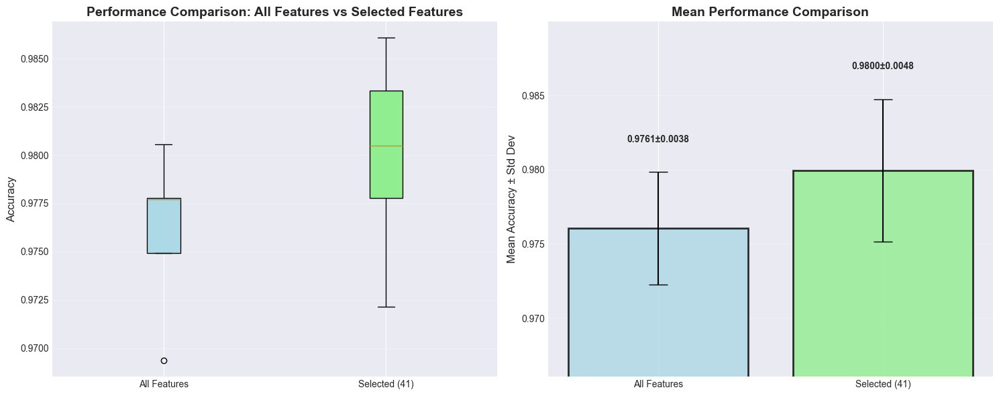


Performance Comparison:
  All Features: 0.976068 ± 0.003797
  Selected Features (41): 0.979966 ± 0.004793
  Feature Reduction: 41/64 = 64.1%
  Performance Change: +0.39%

=== digits | rf | euler ===


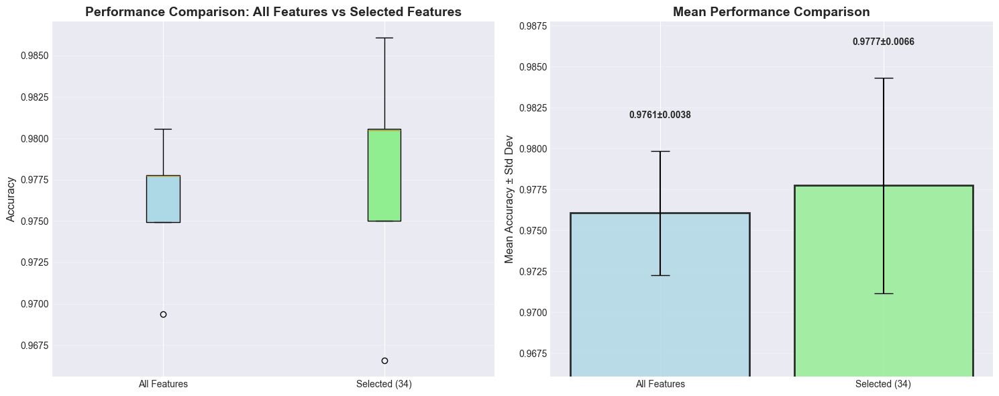


Performance Comparison:
  All Features: 0.976068 ± 0.003797
  Selected Features (34): 0.977741 ± 0.006590
  Feature Reduction: 34/64 = 53.1%
  Performance Change: +0.17%

=== digits | svm | standard ===


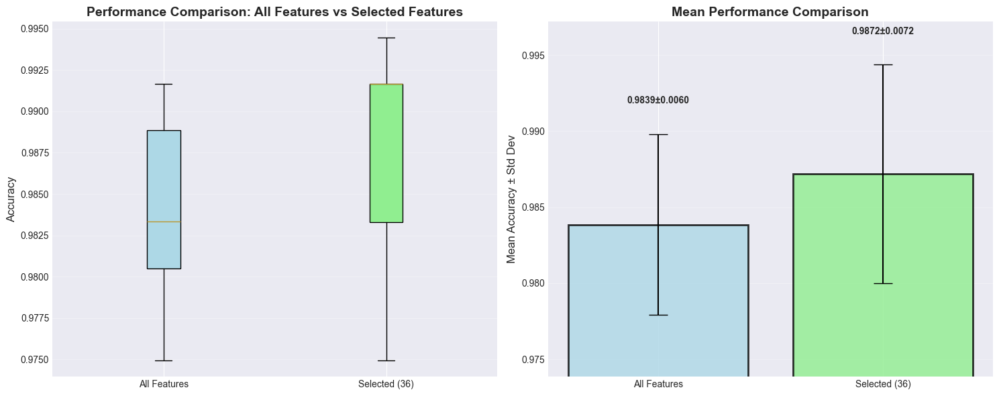


Performance Comparison:
  All Features: 0.983858 ± 0.005953
  Selected Features (36): 0.987194 ± 0.007184
  Feature Reduction: 36/64 = 56.2%
  Performance Change: +0.33%

=== digits | svm | archimedean ===


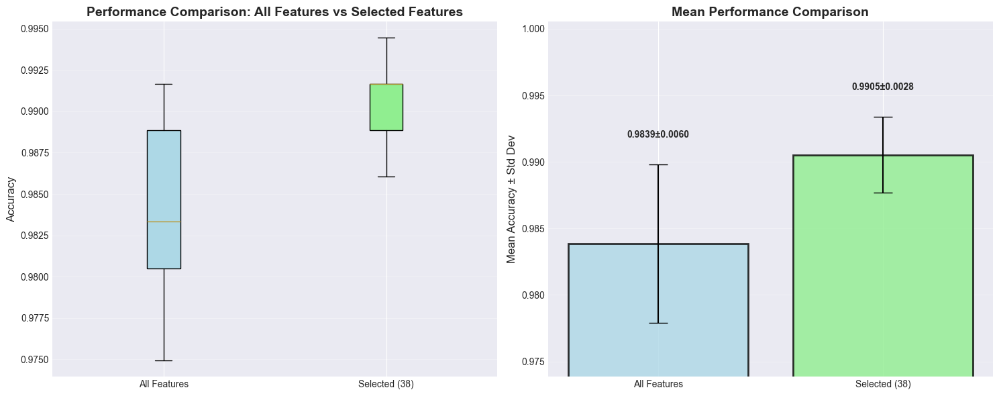


Performance Comparison:
  All Features: 0.983858 ± 0.005953
  Selected Features (38): 0.990537 ± 0.002847
  Feature Reduction: 38/64 = 59.4%
  Performance Change: +0.67%

=== digits | svm | logarithmic ===


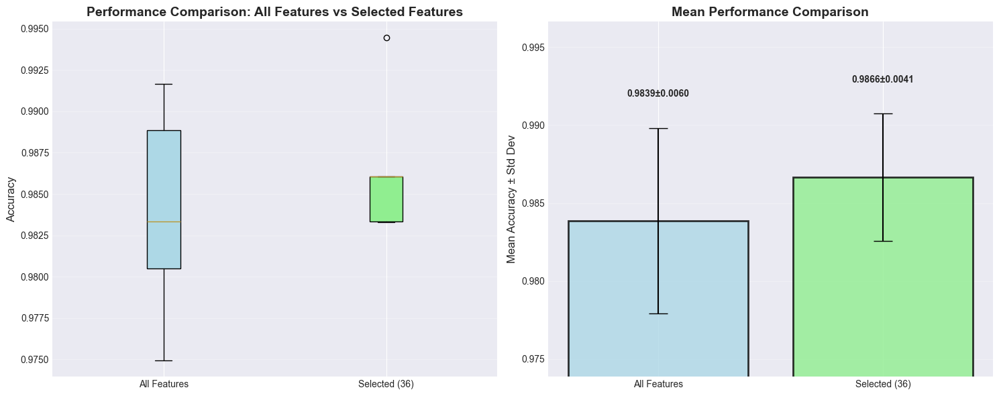


Performance Comparison:
  All Features: 0.983858 ± 0.005953
  Selected Features (36): 0.986642 ± 0.004092
  Feature Reduction: 36/64 = 56.2%
  Performance Change: +0.28%

=== digits | svm | fermat ===


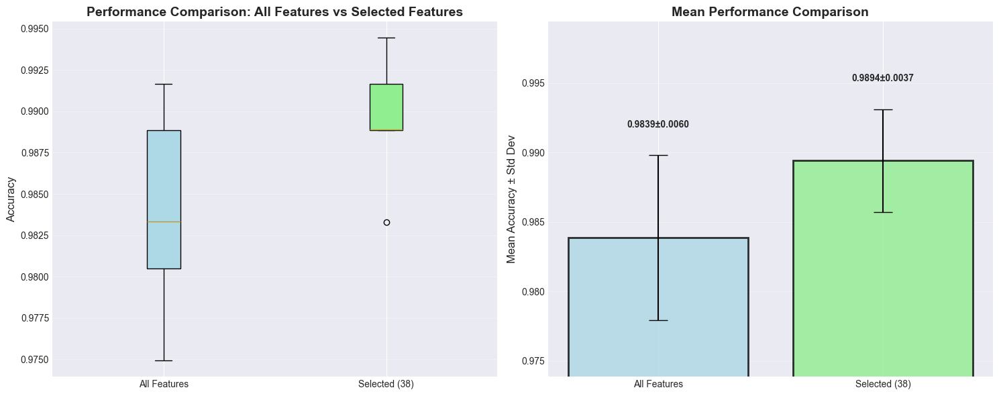


Performance Comparison:
  All Features: 0.983858 ± 0.005953
  Selected Features (38): 0.989424 ± 0.003699
  Feature Reduction: 38/64 = 59.4%
  Performance Change: +0.56%

=== digits | svm | hyperbolic ===


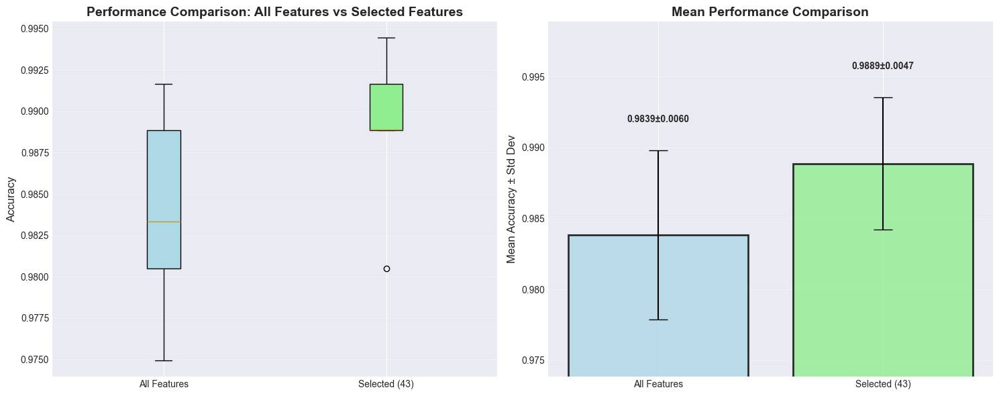


Performance Comparison:
  All Features: 0.983858 ± 0.005953
  Selected Features (43): 0.988867 ± 0.004665
  Feature Reduction: 43/64 = 67.2%
  Performance Change: +0.50%

=== digits | svm | euler ===


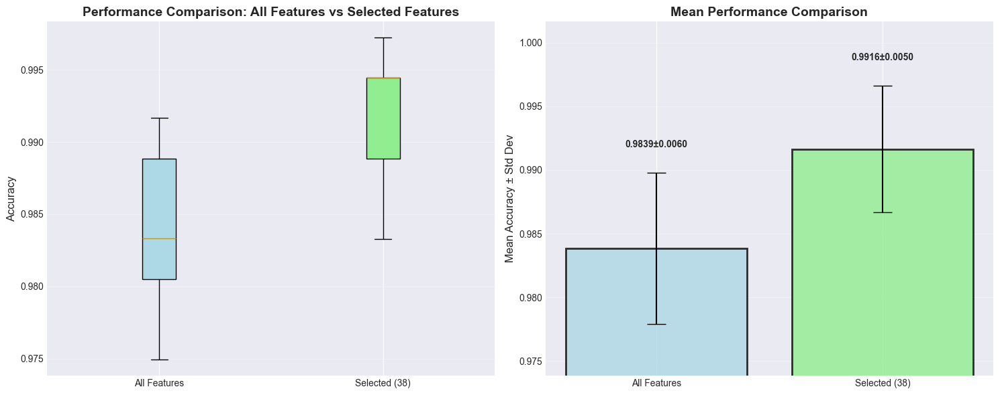


Performance Comparison:
  All Features: 0.983858 ± 0.005953
  Selected Features (38): 0.991650 ± 0.004986
  Feature Reduction: 38/64 = 59.4%
  Performance Change: +0.78%

=== digits | knn | standard ===


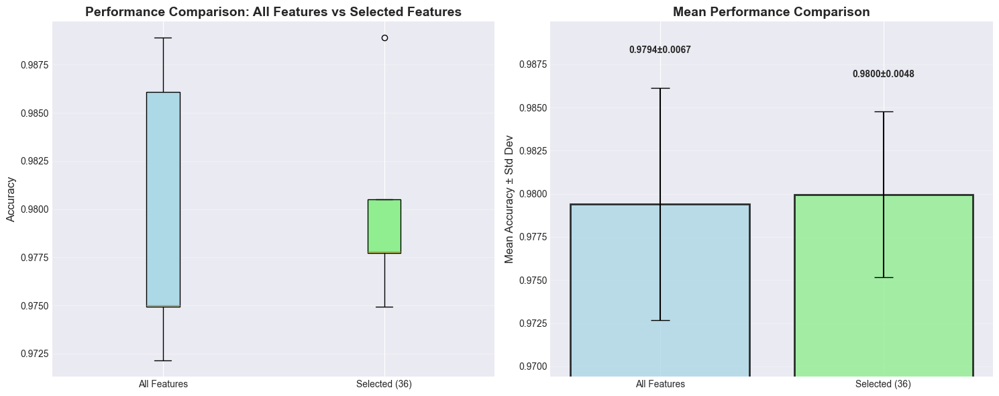


Performance Comparison:
  All Features: 0.979407 ± 0.006731
  Selected Features (36): 0.979963 ± 0.004798
  Feature Reduction: 36/64 = 56.2%
  Performance Change: +0.06%

=== digits | knn | archimedean ===


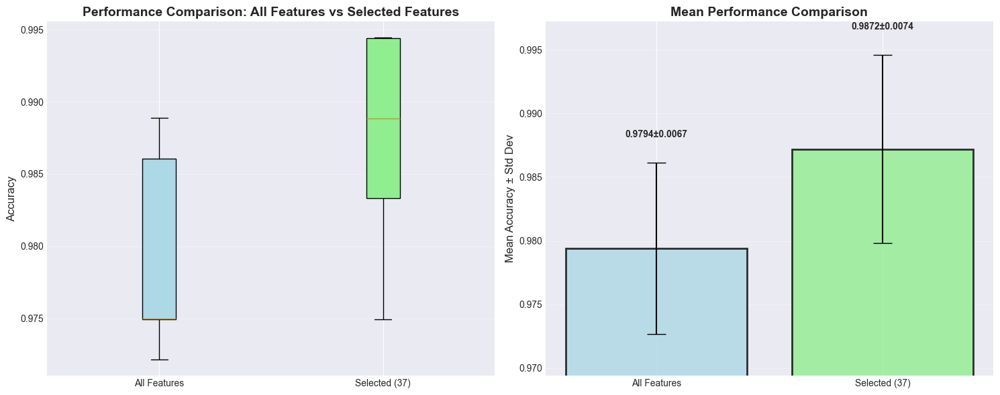


Performance Comparison:
  All Features: 0.979407 ± 0.006731
  Selected Features (37): 0.987199 ± 0.007389
  Feature Reduction: 37/64 = 57.8%
  Performance Change: +0.78%

=== digits | knn | logarithmic ===


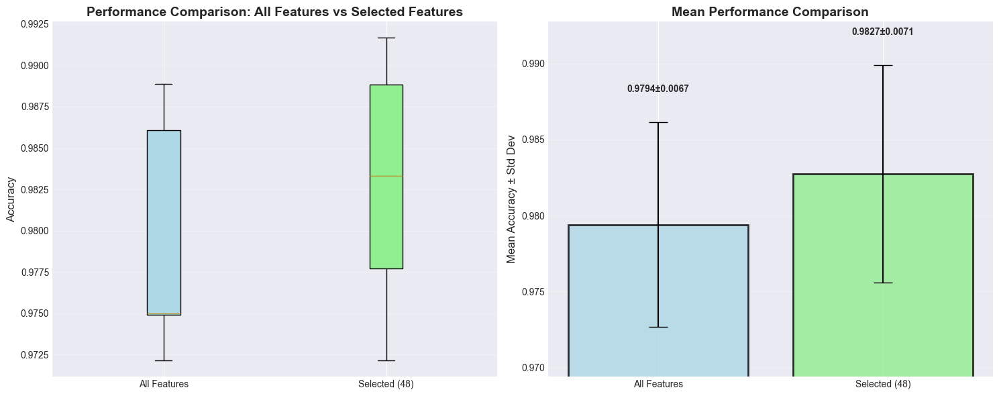


Performance Comparison:
  All Features: 0.979407 ± 0.006731
  Selected Features (48): 0.982744 ± 0.007141
  Feature Reduction: 48/64 = 75.0%
  Performance Change: +0.33%

=== digits | knn | fermat ===


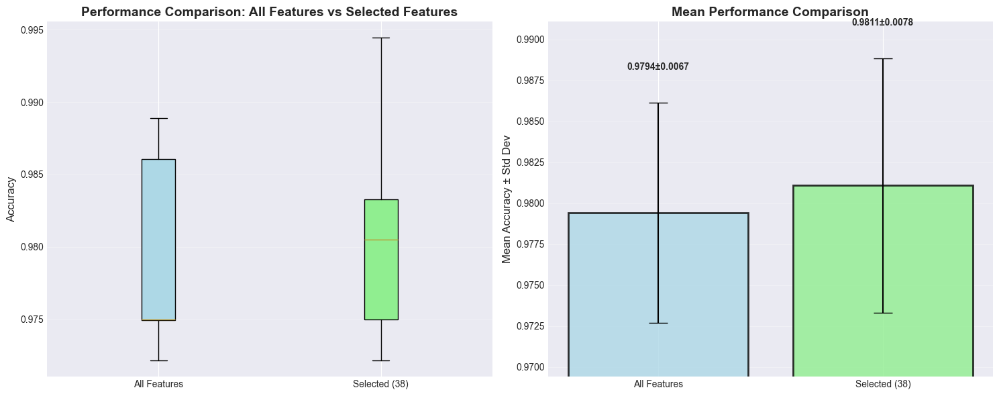


Performance Comparison:
  All Features: 0.979407 ± 0.006731
  Selected Features (38): 0.981076 ± 0.007754
  Feature Reduction: 38/64 = 59.4%
  Performance Change: +0.17%

=== digits | knn | hyperbolic ===


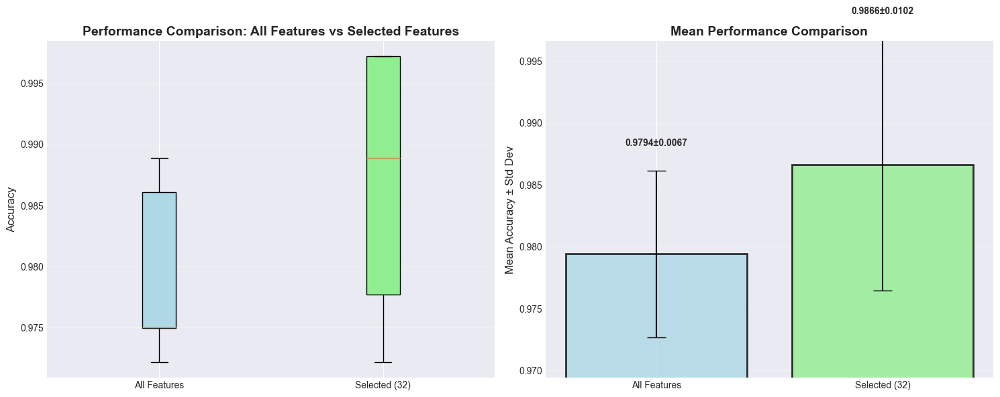


Performance Comparison:
  All Features: 0.979407 ± 0.006731
  Selected Features (32): 0.986633 ± 0.010185
  Feature Reduction: 32/64 = 50.0%
  Performance Change: +0.72%

=== digits | knn | euler ===


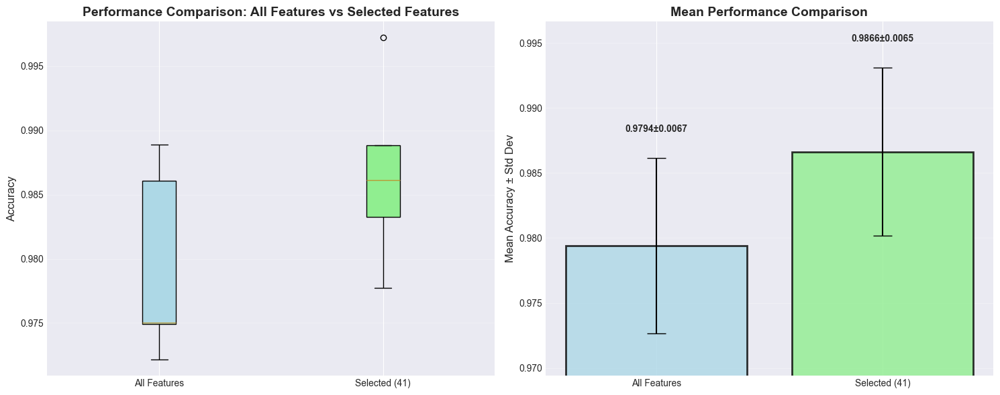


Performance Comparison:
  All Features: 0.979407 ± 0.006731
  Selected Features (41): 0.986639 ± 0.006451
  Feature Reduction: 41/64 = 64.1%
  Performance Change: +0.72%

=== diabetes | rf | standard ===


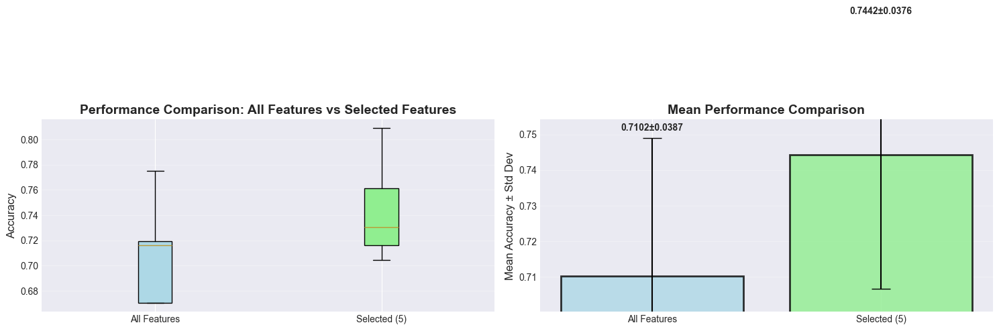


Performance Comparison:
  All Features: 0.710240 ± 0.038747
  Selected Features (5): 0.744229 ± 0.037569
  Feature Reduction: 5/10 = 50.0%
  Performance Change: +3.40%

=== diabetes | rf | archimedean ===


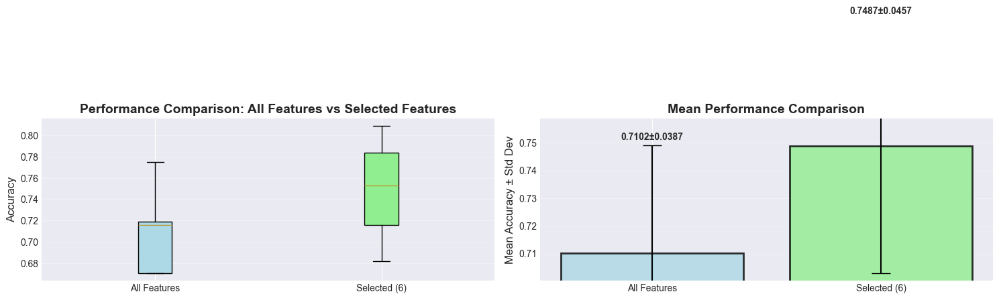


Performance Comparison:
  All Features: 0.710240 ± 0.038747
  Selected Features (6): 0.748723 ± 0.045722
  Feature Reduction: 6/10 = 60.0%
  Performance Change: +3.85%

=== diabetes | rf | logarithmic ===


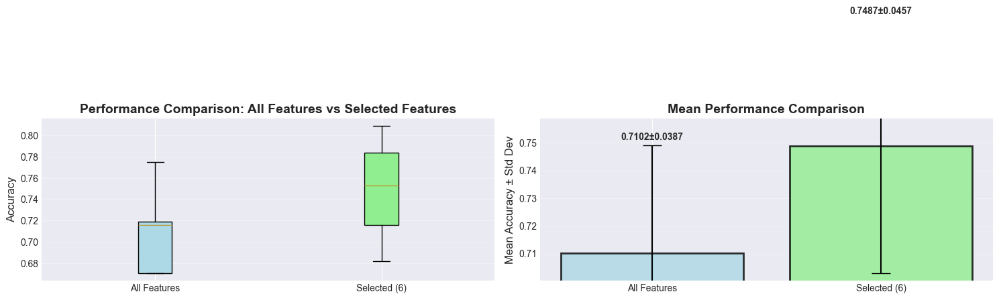


Performance Comparison:
  All Features: 0.710240 ± 0.038747
  Selected Features (6): 0.748723 ± 0.045722
  Feature Reduction: 6/10 = 60.0%
  Performance Change: +3.85%

=== diabetes | rf | fermat ===


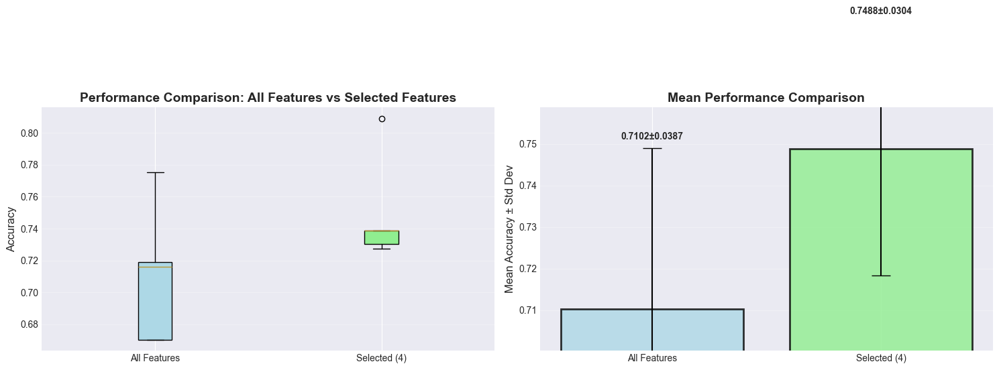


Performance Comparison:
  All Features: 0.710240 ± 0.038747
  Selected Features (4): 0.748774 ± 0.030442
  Feature Reduction: 4/10 = 40.0%
  Performance Change: +3.85%

=== diabetes | rf | hyperbolic ===


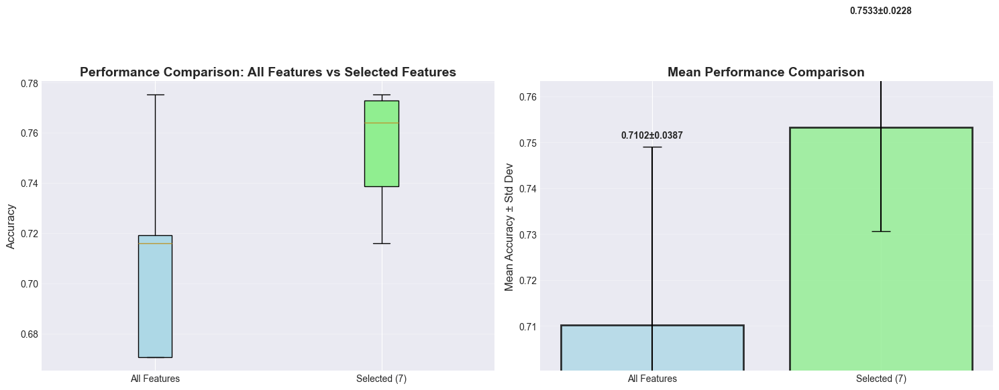


Performance Comparison:
  All Features: 0.710240 ± 0.038747
  Selected Features (7): 0.753320 ± 0.022756
  Feature Reduction: 7/10 = 70.0%
  Performance Change: +4.31%

=== diabetes | rf | euler ===


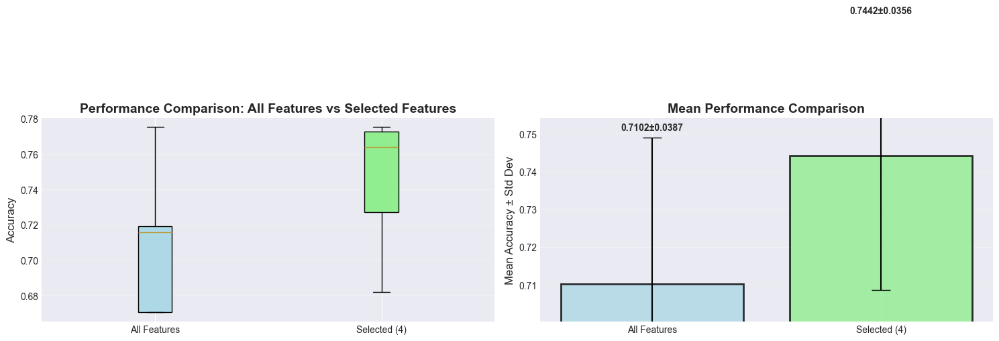


Performance Comparison:
  All Features: 0.710240 ± 0.038747
  Selected Features (4): 0.744229 ± 0.035642
  Feature Reduction: 4/10 = 40.0%
  Performance Change: +3.40%

=== diabetes | svm | standard ===


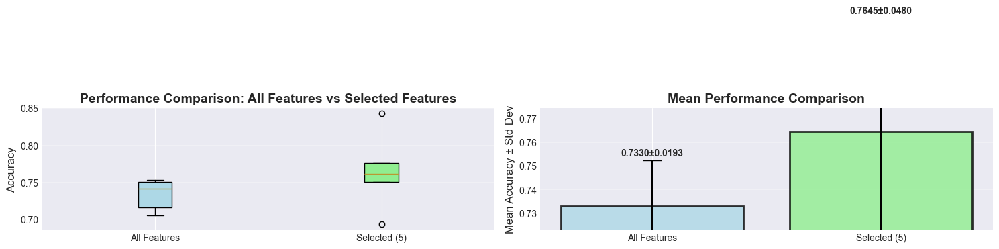


Performance Comparison:
  All Features: 0.732967 ± 0.019270
  Selected Features (5): 0.764505 ± 0.048036
  Feature Reduction: 5/10 = 50.0%
  Performance Change: +3.15%

=== diabetes | svm | archimedean ===


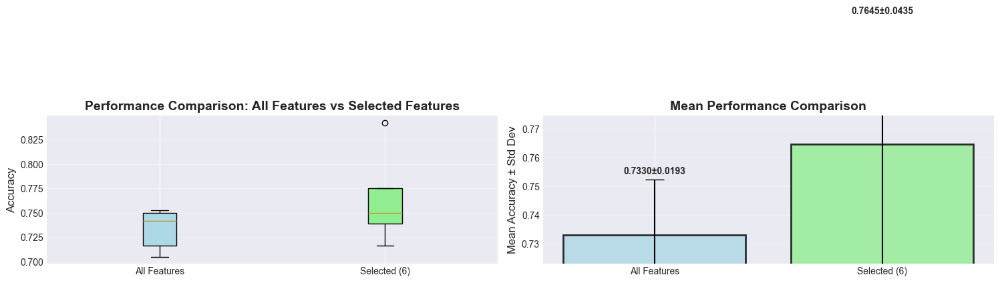


Performance Comparison:
  All Features: 0.732967 ± 0.019270
  Selected Features (6): 0.764505 ± 0.043523
  Feature Reduction: 6/10 = 60.0%
  Performance Change: +3.15%

=== diabetes | svm | logarithmic ===


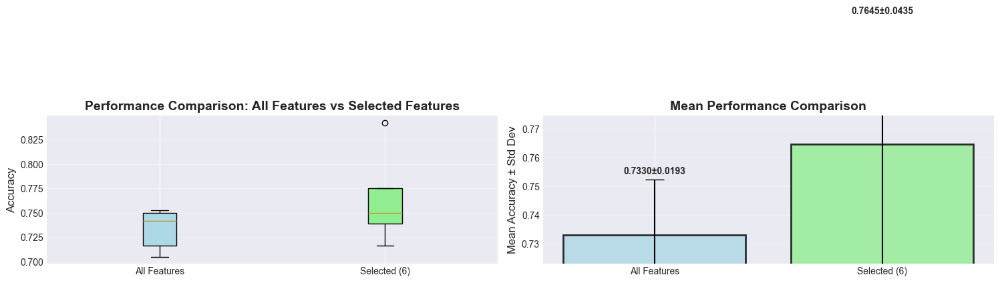


Performance Comparison:
  All Features: 0.732967 ± 0.019270
  Selected Features (6): 0.764505 ± 0.043523
  Feature Reduction: 6/10 = 60.0%
  Performance Change: +3.15%

=== diabetes | svm | fermat ===


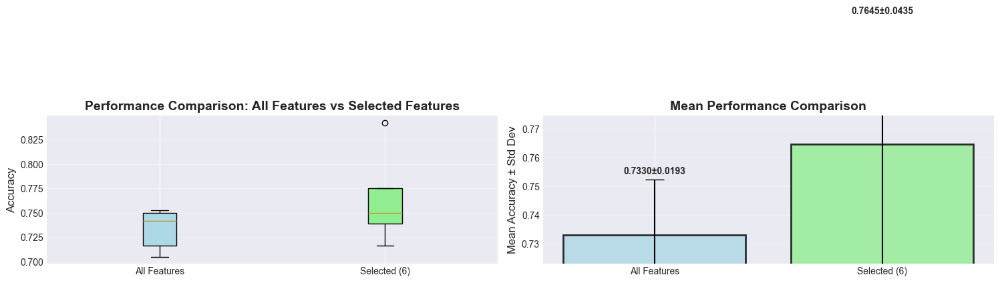


Performance Comparison:
  All Features: 0.732967 ± 0.019270
  Selected Features (6): 0.764505 ± 0.043523
  Feature Reduction: 6/10 = 60.0%
  Performance Change: +3.15%

=== diabetes | svm | hyperbolic ===


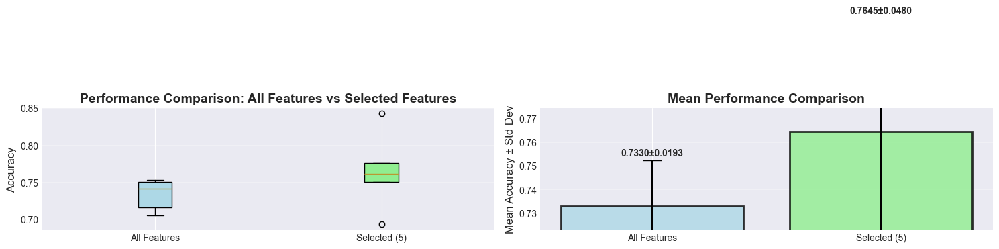


Performance Comparison:
  All Features: 0.732967 ± 0.019270
  Selected Features (5): 0.764505 ± 0.048036
  Feature Reduction: 5/10 = 50.0%
  Performance Change: +3.15%

=== diabetes | svm | euler ===


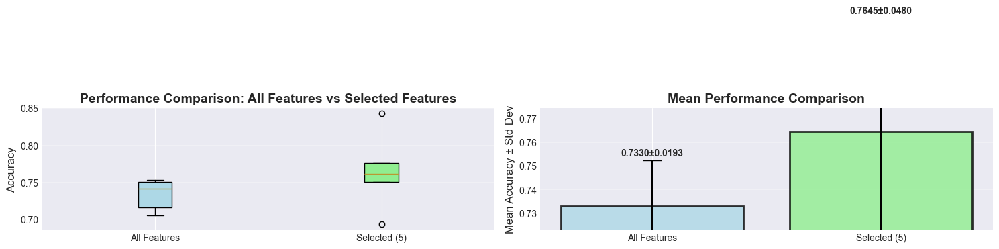


Performance Comparison:
  All Features: 0.732967 ± 0.019270
  Selected Features (5): 0.764505 ± 0.048036
  Feature Reduction: 5/10 = 50.0%
  Performance Change: +3.15%

=== diabetes | knn | standard ===


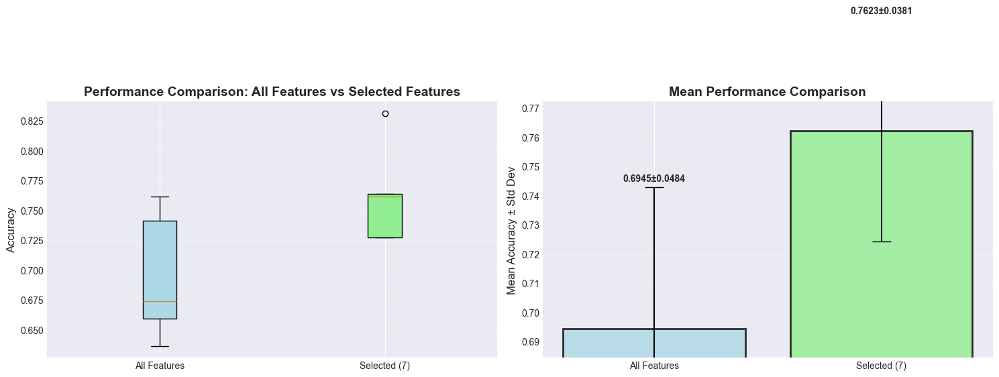


Performance Comparison:
  All Features: 0.694510 ± 0.048444
  Selected Features (7): 0.762283 ± 0.038055
  Feature Reduction: 7/10 = 70.0%
  Performance Change: +6.78%

=== diabetes | knn | archimedean ===


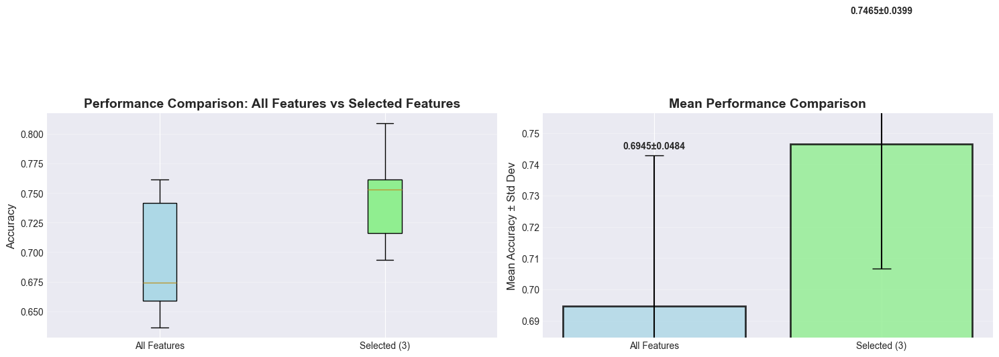


Performance Comparison:
  All Features: 0.694510 ± 0.048444
  Selected Features (3): 0.746450 ± 0.039860
  Feature Reduction: 3/10 = 30.0%
  Performance Change: +5.19%

=== diabetes | knn | logarithmic ===


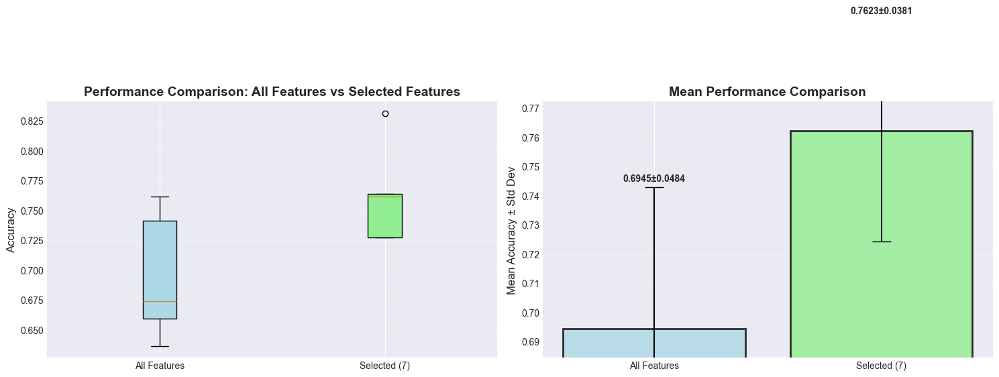


Performance Comparison:
  All Features: 0.694510 ± 0.048444
  Selected Features (7): 0.762283 ± 0.038055
  Feature Reduction: 7/10 = 70.0%
  Performance Change: +6.78%

=== diabetes | knn | fermat ===


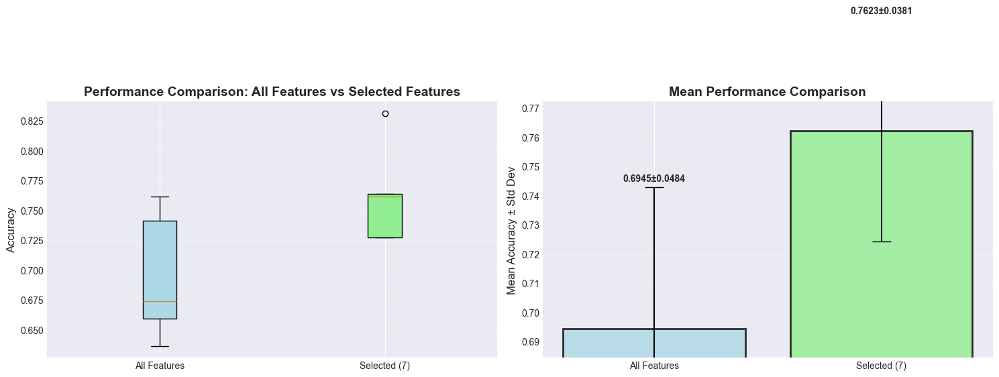


Performance Comparison:
  All Features: 0.694510 ± 0.048444
  Selected Features (7): 0.762283 ± 0.038055
  Feature Reduction: 7/10 = 70.0%
  Performance Change: +6.78%

=== diabetes | knn | hyperbolic ===


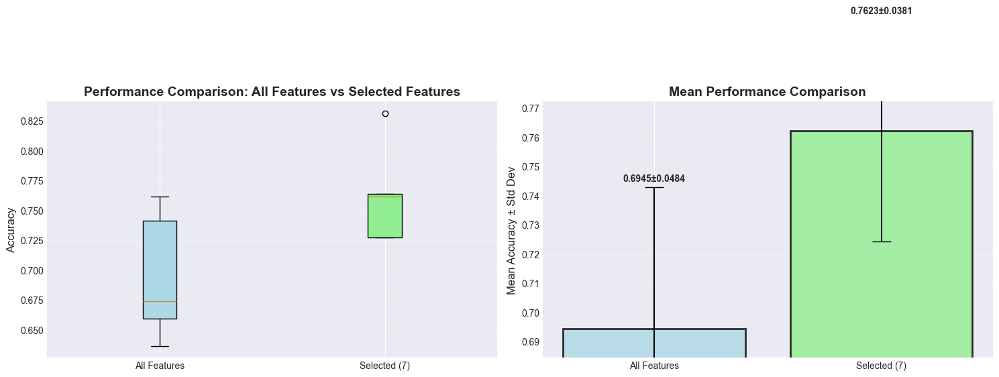


Performance Comparison:
  All Features: 0.694510 ± 0.048444
  Selected Features (7): 0.762283 ± 0.038055
  Feature Reduction: 7/10 = 70.0%
  Performance Change: +6.78%

=== diabetes | knn | euler ===


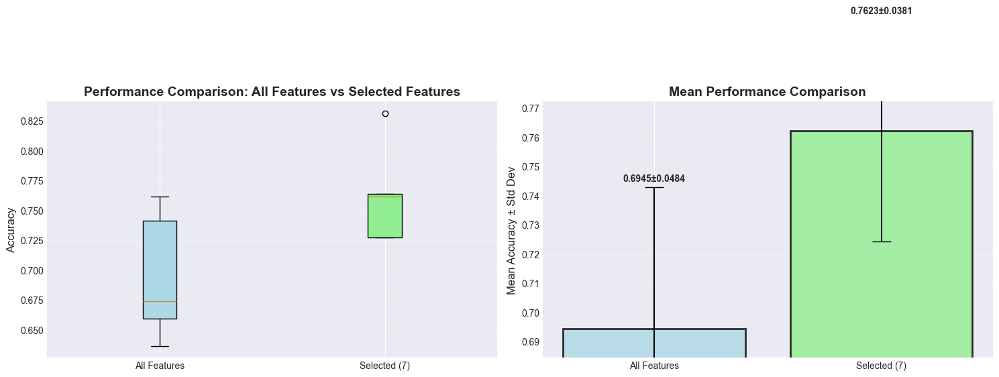


Performance Comparison:
  All Features: 0.694510 ± 0.048444
  Selected Features (7): 0.762283 ± 0.038055
  Feature Reduction: 7/10 = 70.0%
  Performance Change: +6.78%

=== synthetic_1 | rf | standard ===


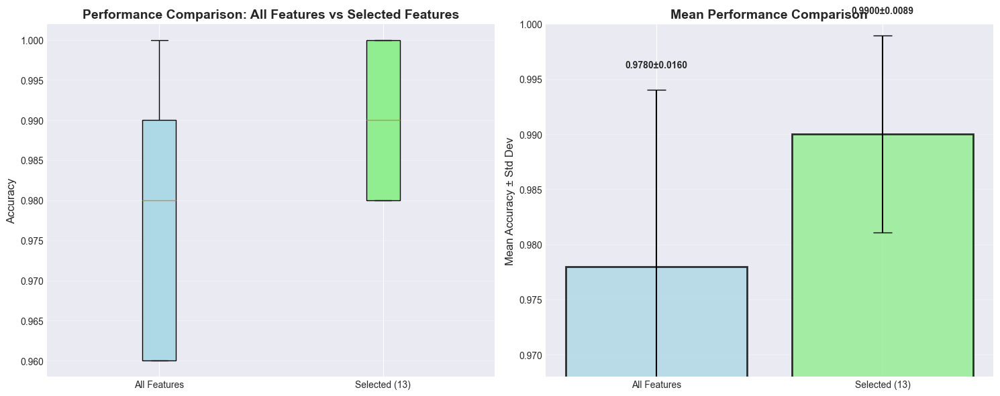


Performance Comparison:
  All Features: 0.978000 ± 0.016000
  Selected Features (13): 0.990000 ± 0.008944
  Feature Reduction: 13/20 = 65.0%
  Performance Change: +1.20%

=== synthetic_1 | rf | archimedean ===


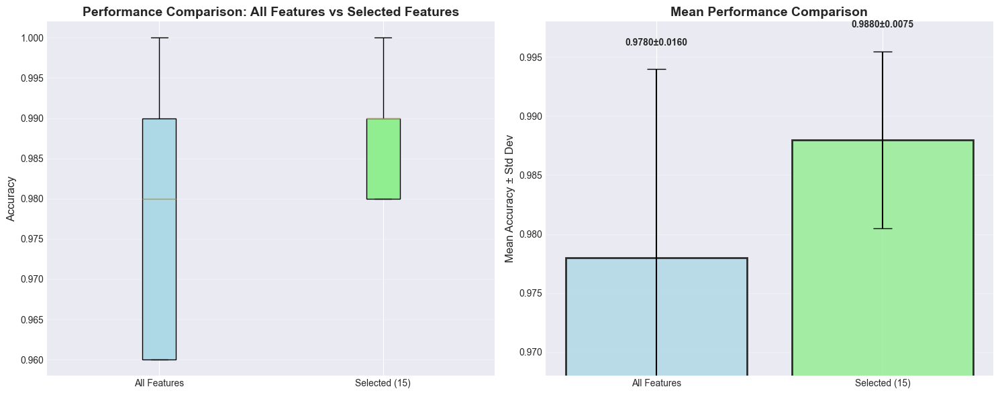


Performance Comparison:
  All Features: 0.978000 ± 0.016000
  Selected Features (15): 0.988000 ± 0.007483
  Feature Reduction: 15/20 = 75.0%
  Performance Change: +1.00%

=== synthetic_1 | rf | logarithmic ===


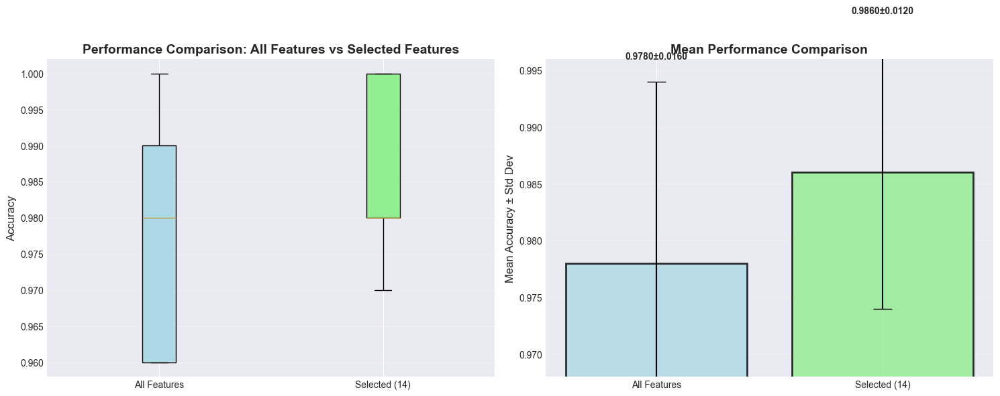


Performance Comparison:
  All Features: 0.978000 ± 0.016000
  Selected Features (14): 0.986000 ± 0.012000
  Feature Reduction: 14/20 = 70.0%
  Performance Change: +0.80%

=== synthetic_1 | rf | fermat ===


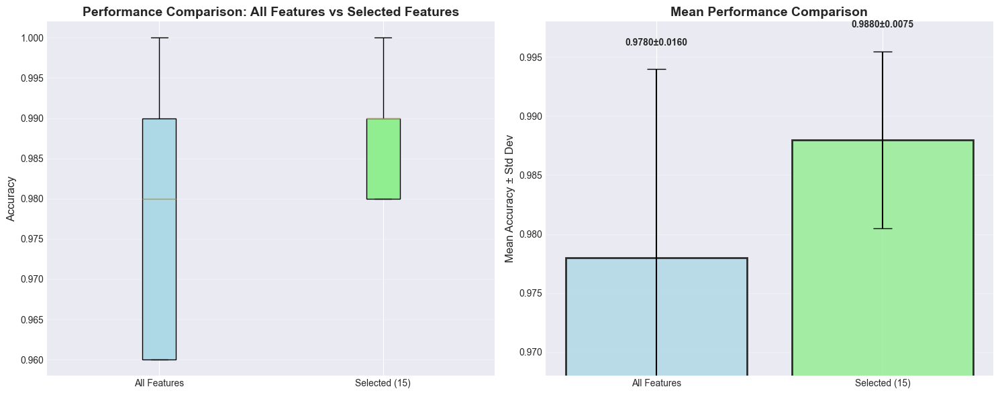


Performance Comparison:
  All Features: 0.978000 ± 0.016000
  Selected Features (15): 0.988000 ± 0.007483
  Feature Reduction: 15/20 = 75.0%
  Performance Change: +1.00%

=== synthetic_1 | rf | hyperbolic ===


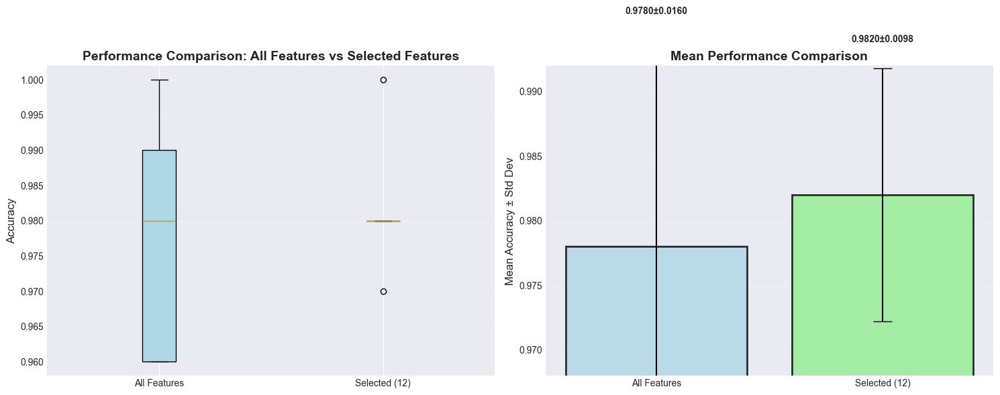


Performance Comparison:
  All Features: 0.978000 ± 0.016000
  Selected Features (12): 0.982000 ± 0.009798
  Feature Reduction: 12/20 = 60.0%
  Performance Change: +0.40%

=== synthetic_1 | rf | euler ===


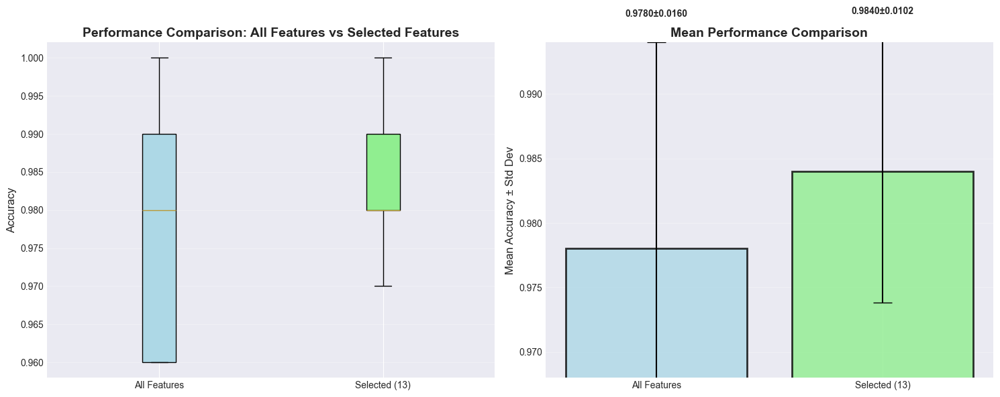


Performance Comparison:
  All Features: 0.978000 ± 0.016000
  Selected Features (13): 0.984000 ± 0.010198
  Feature Reduction: 13/20 = 65.0%
  Performance Change: +0.60%

=== synthetic_1 | svm | standard ===


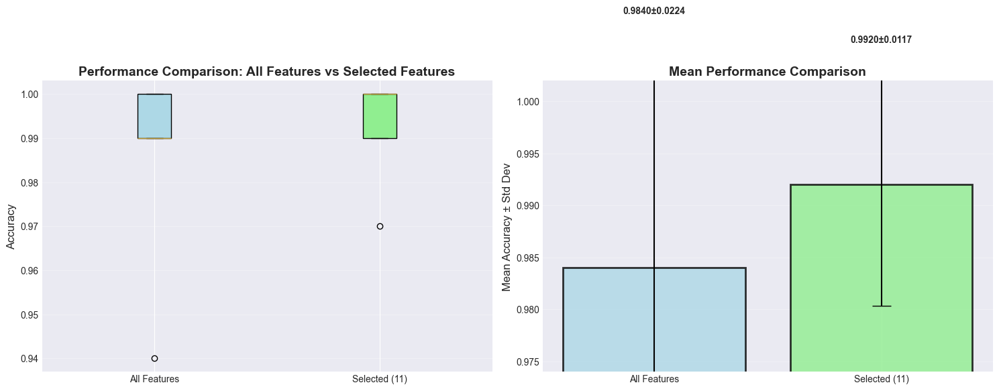


Performance Comparison:
  All Features: 0.984000 ± 0.022450
  Selected Features (11): 0.992000 ± 0.011662
  Feature Reduction: 11/20 = 55.0%
  Performance Change: +0.80%

=== synthetic_1 | svm | archimedean ===


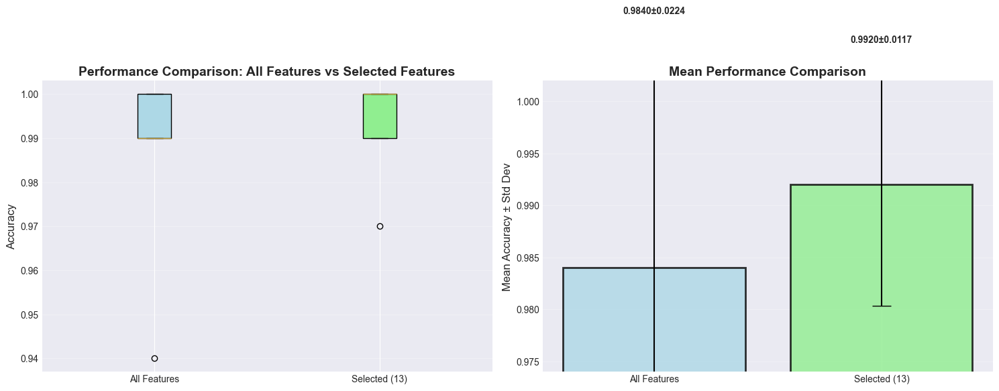


Performance Comparison:
  All Features: 0.984000 ± 0.022450
  Selected Features (13): 0.992000 ± 0.011662
  Feature Reduction: 13/20 = 65.0%
  Performance Change: +0.80%

=== synthetic_1 | svm | logarithmic ===


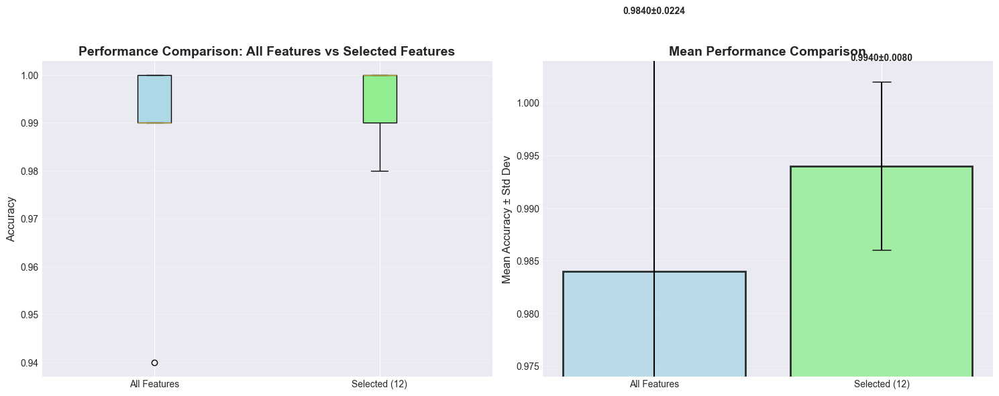


Performance Comparison:
  All Features: 0.984000 ± 0.022450
  Selected Features (12): 0.994000 ± 0.008000
  Feature Reduction: 12/20 = 60.0%
  Performance Change: +1.00%

=== synthetic_1 | svm | fermat ===


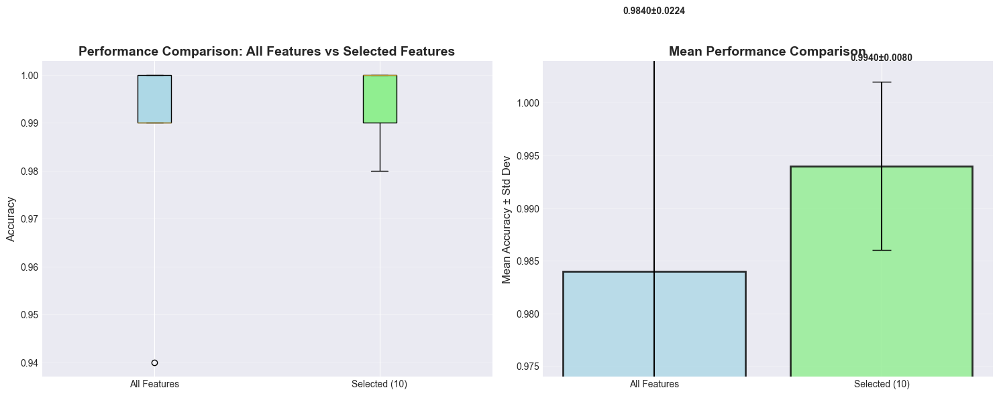


Performance Comparison:
  All Features: 0.984000 ± 0.022450
  Selected Features (10): 0.994000 ± 0.008000
  Feature Reduction: 10/20 = 50.0%
  Performance Change: +1.00%

=== synthetic_1 | svm | hyperbolic ===


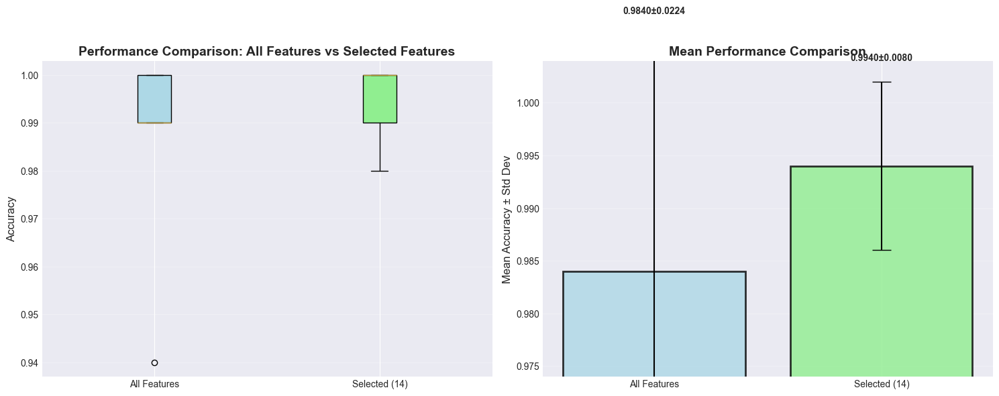


Performance Comparison:
  All Features: 0.984000 ± 0.022450
  Selected Features (14): 0.994000 ± 0.008000
  Feature Reduction: 14/20 = 70.0%
  Performance Change: +1.00%

=== synthetic_1 | svm | euler ===


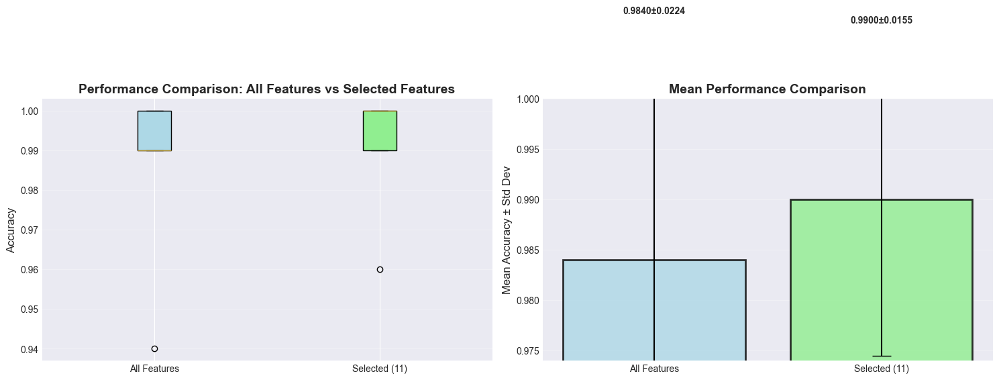


Performance Comparison:
  All Features: 0.984000 ± 0.022450
  Selected Features (11): 0.990000 ± 0.015492
  Feature Reduction: 11/20 = 55.0%
  Performance Change: +0.60%

=== synthetic_1 | knn | standard ===


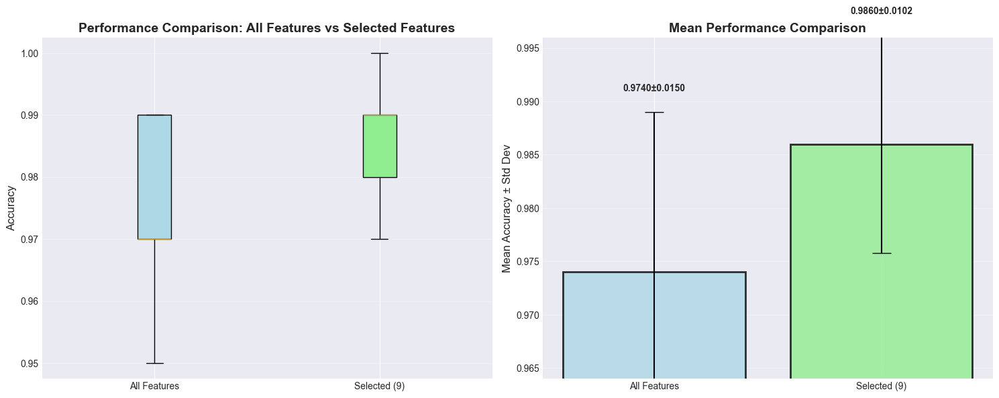


Performance Comparison:
  All Features: 0.974000 ± 0.014967
  Selected Features (9): 0.986000 ± 0.010198
  Feature Reduction: 9/20 = 45.0%
  Performance Change: +1.20%

=== synthetic_1 | knn | archimedean ===


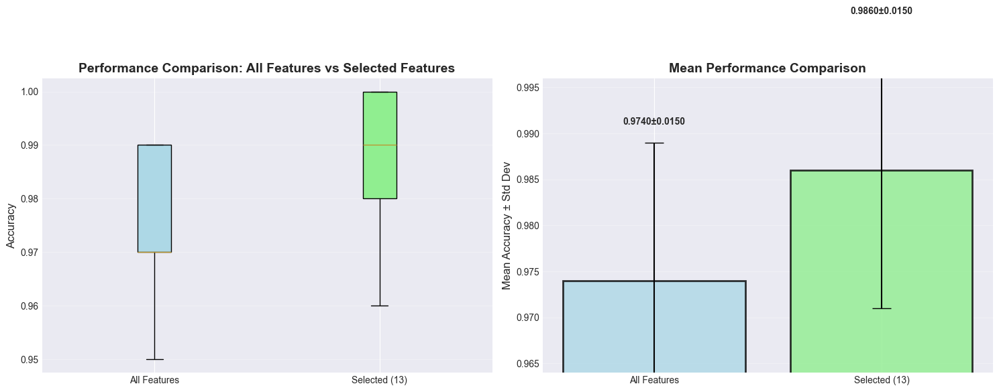


Performance Comparison:
  All Features: 0.974000 ± 0.014967
  Selected Features (13): 0.986000 ± 0.014967
  Feature Reduction: 13/20 = 65.0%
  Performance Change: +1.20%

=== synthetic_1 | knn | logarithmic ===


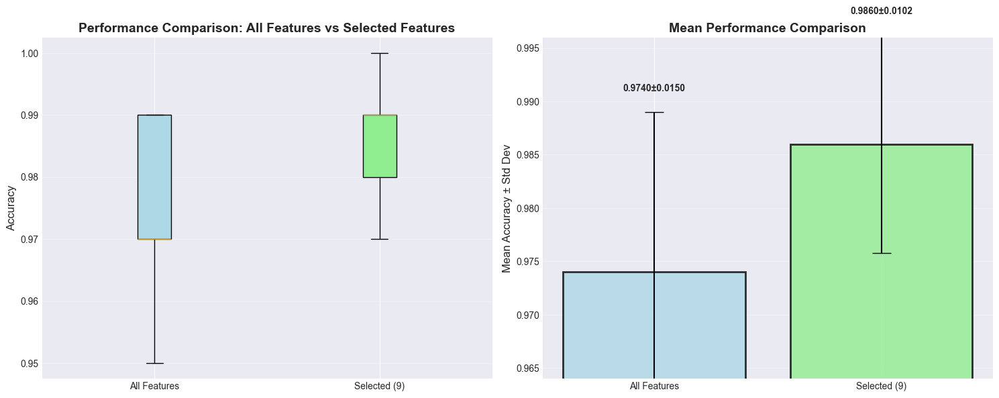


Performance Comparison:
  All Features: 0.974000 ± 0.014967
  Selected Features (9): 0.986000 ± 0.010198
  Feature Reduction: 9/20 = 45.0%
  Performance Change: +1.20%

=== synthetic_1 | knn | fermat ===


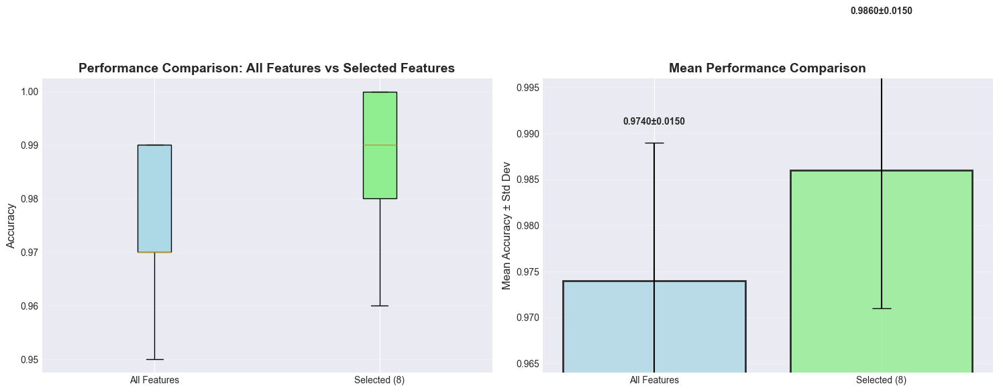


Performance Comparison:
  All Features: 0.974000 ± 0.014967
  Selected Features (8): 0.986000 ± 0.014967
  Feature Reduction: 8/20 = 40.0%
  Performance Change: +1.20%

=== synthetic_1 | knn | hyperbolic ===


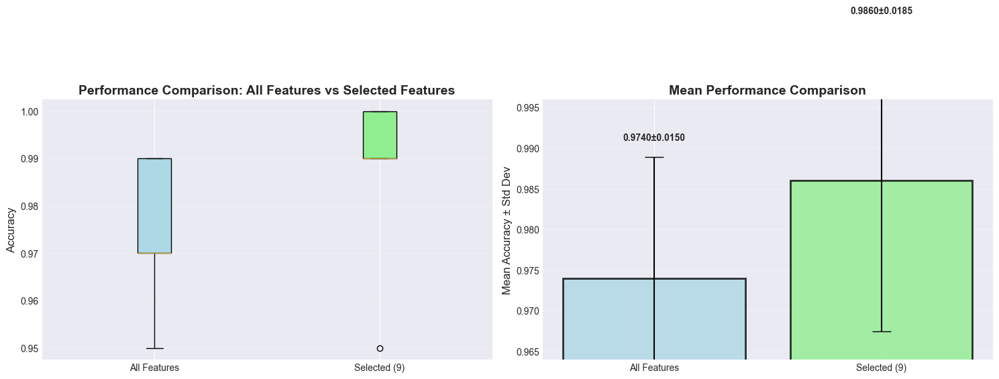


Performance Comparison:
  All Features: 0.974000 ± 0.014967
  Selected Features (9): 0.986000 ± 0.018547
  Feature Reduction: 9/20 = 45.0%
  Performance Change: +1.20%

=== synthetic_1 | knn | euler ===


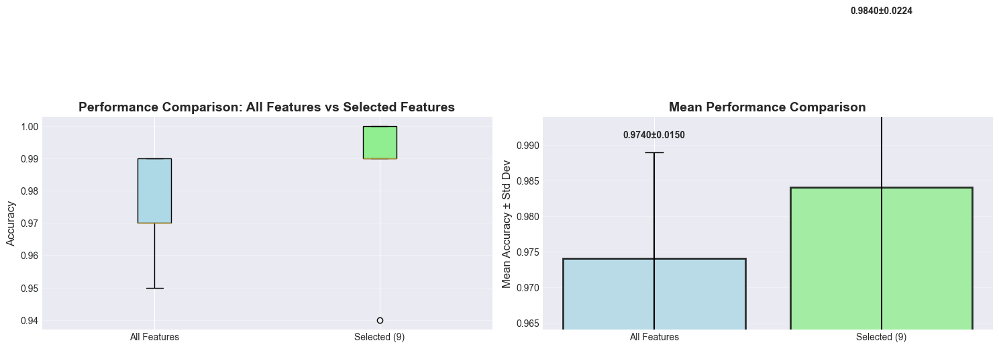


Performance Comparison:
  All Features: 0.974000 ± 0.014967
  Selected Features (9): 0.984000 ± 0.022450
  Feature Reduction: 9/20 = 45.0%
  Performance Change: +1.00%

=== synthetic_2 | rf | standard ===


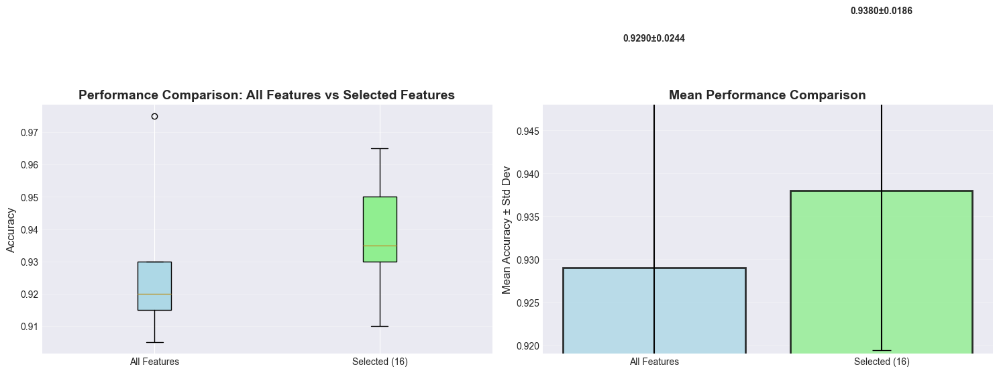


Performance Comparison:
  All Features: 0.929000 ± 0.024372
  Selected Features (16): 0.938000 ± 0.018601
  Feature Reduction: 16/30 = 53.3%
  Performance Change: +0.90%

=== synthetic_2 | rf | archimedean ===


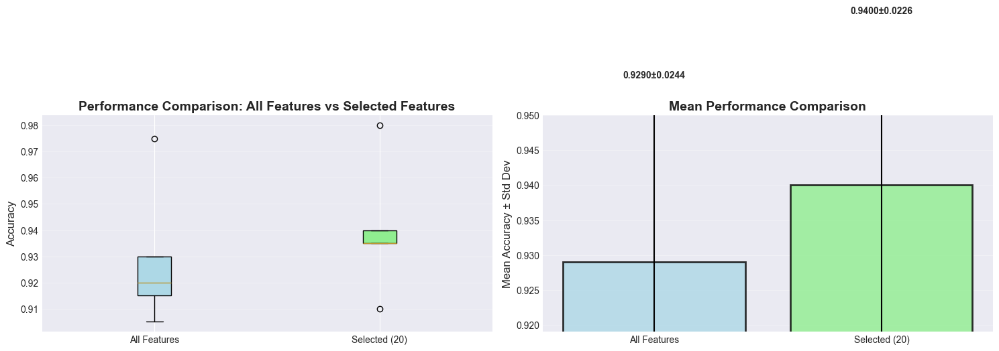


Performance Comparison:
  All Features: 0.929000 ± 0.024372
  Selected Features (20): 0.940000 ± 0.022583
  Feature Reduction: 20/30 = 66.7%
  Performance Change: +1.10%

=== synthetic_2 | rf | logarithmic ===


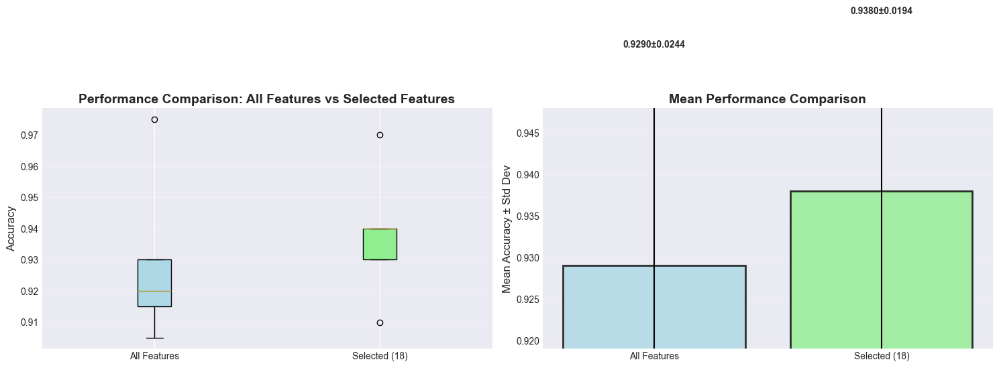


Performance Comparison:
  All Features: 0.929000 ± 0.024372
  Selected Features (18): 0.938000 ± 0.019391
  Feature Reduction: 18/30 = 60.0%
  Performance Change: +0.90%

=== synthetic_2 | rf | fermat ===


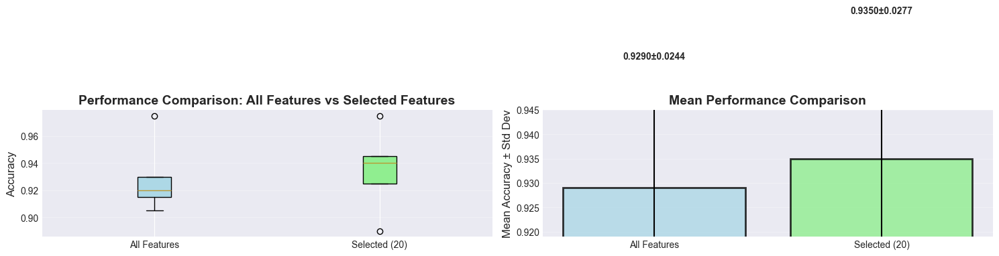


Performance Comparison:
  All Features: 0.929000 ± 0.024372
  Selected Features (20): 0.935000 ± 0.027749
  Feature Reduction: 20/30 = 66.7%
  Performance Change: +0.60%

=== synthetic_2 | rf | hyperbolic ===


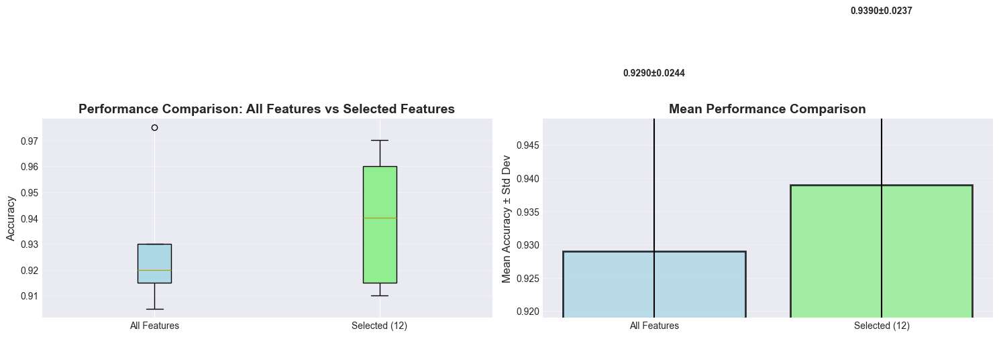


Performance Comparison:
  All Features: 0.929000 ± 0.024372
  Selected Features (12): 0.939000 ± 0.023749
  Feature Reduction: 12/30 = 40.0%
  Performance Change: +1.00%

=== synthetic_2 | rf | euler ===


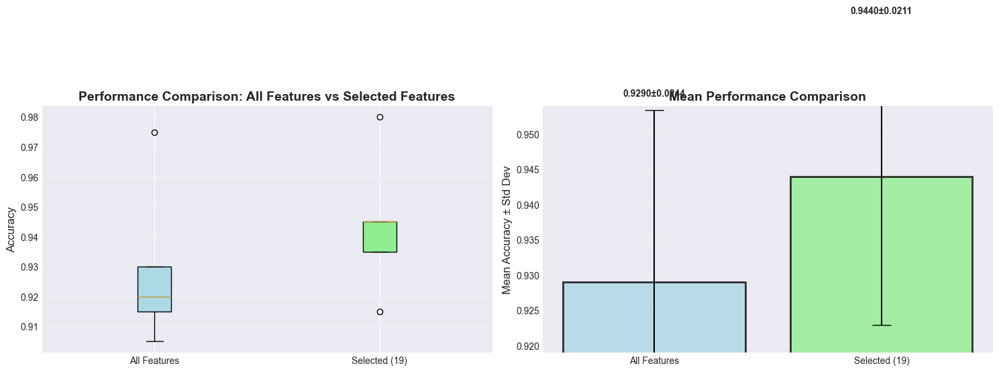


Performance Comparison:
  All Features: 0.929000 ± 0.024372
  Selected Features (19): 0.944000 ± 0.021071
  Feature Reduction: 19/30 = 63.3%
  Performance Change: +1.50%

=== synthetic_2 | svm | standard ===


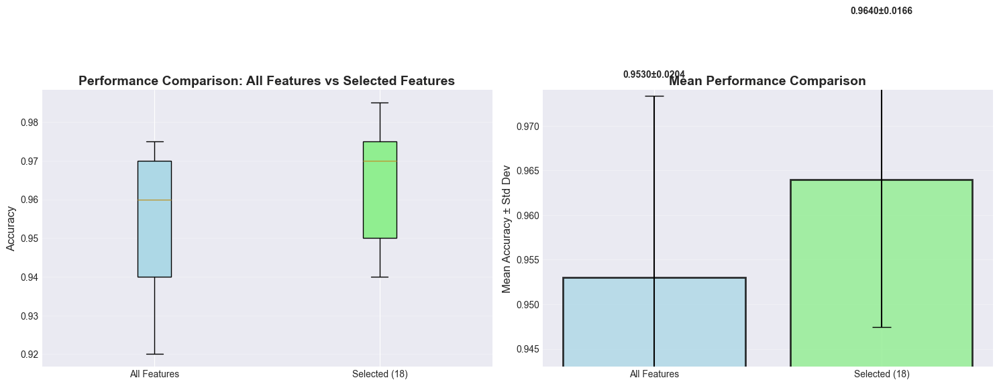


Performance Comparison:
  All Features: 0.953000 ± 0.020396
  Selected Features (18): 0.964000 ± 0.016553
  Feature Reduction: 18/30 = 60.0%
  Performance Change: +1.10%

=== synthetic_2 | svm | archimedean ===


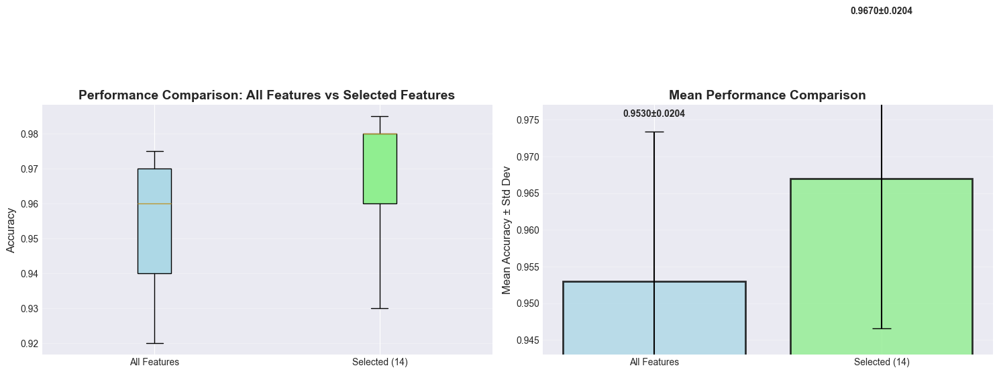


Performance Comparison:
  All Features: 0.953000 ± 0.020396
  Selected Features (14): 0.967000 ± 0.020396
  Feature Reduction: 14/30 = 46.7%
  Performance Change: +1.40%

=== synthetic_2 | svm | logarithmic ===


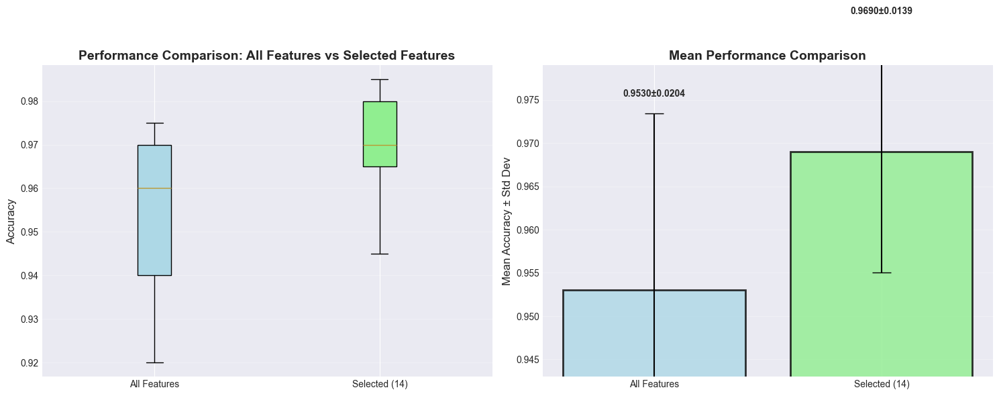


Performance Comparison:
  All Features: 0.953000 ± 0.020396
  Selected Features (14): 0.969000 ± 0.013928
  Feature Reduction: 14/30 = 46.7%
  Performance Change: +1.60%

=== synthetic_2 | svm | fermat ===


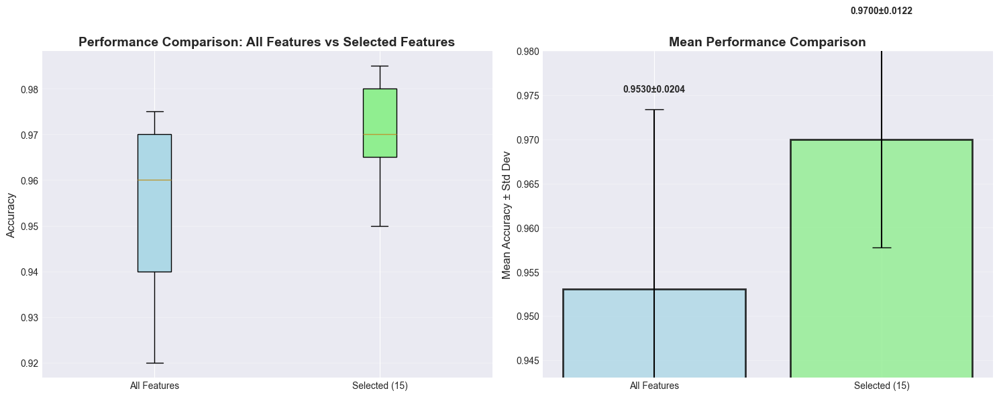


Performance Comparison:
  All Features: 0.953000 ± 0.020396
  Selected Features (15): 0.970000 ± 0.012247
  Feature Reduction: 15/30 = 50.0%
  Performance Change: +1.70%

=== synthetic_2 | svm | hyperbolic ===


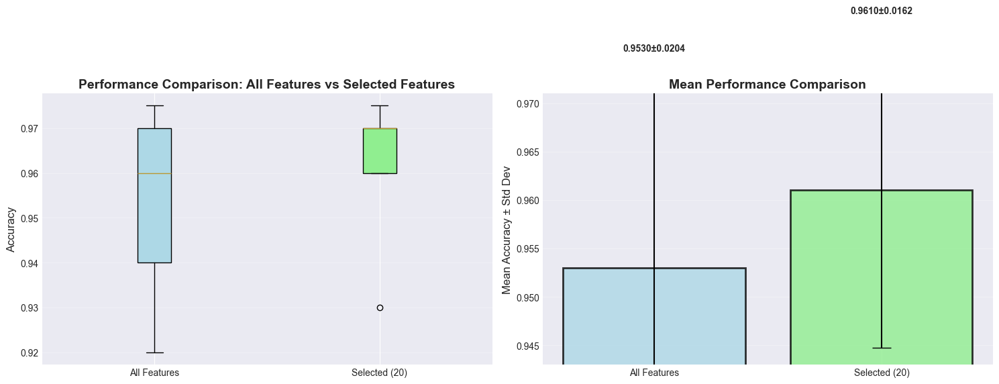


Performance Comparison:
  All Features: 0.953000 ± 0.020396
  Selected Features (20): 0.961000 ± 0.016248
  Feature Reduction: 20/30 = 66.7%
  Performance Change: +0.80%

=== synthetic_2 | svm | euler ===


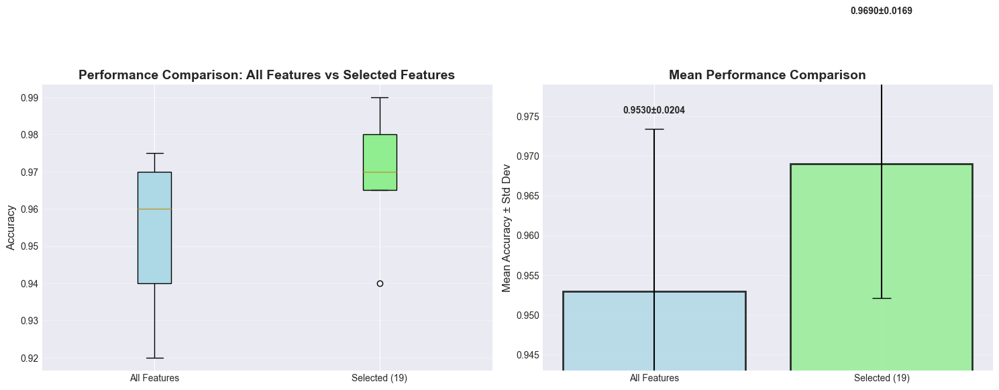


Performance Comparison:
  All Features: 0.953000 ± 0.020396
  Selected Features (19): 0.969000 ± 0.016852
  Feature Reduction: 19/30 = 63.3%
  Performance Change: +1.60%

=== synthetic_2 | knn | standard ===


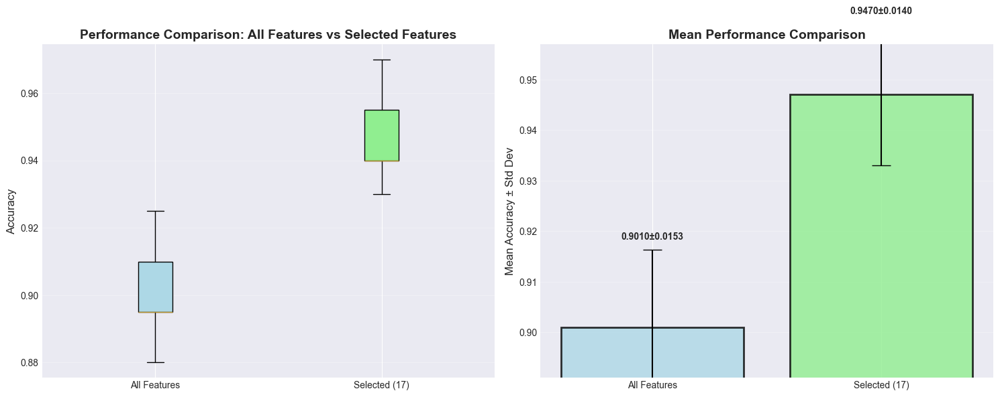


Performance Comparison:
  All Features: 0.901000 ± 0.015297
  Selected Features (17): 0.947000 ± 0.014000
  Feature Reduction: 17/30 = 56.7%
  Performance Change: +4.60%

=== synthetic_2 | knn | archimedean ===


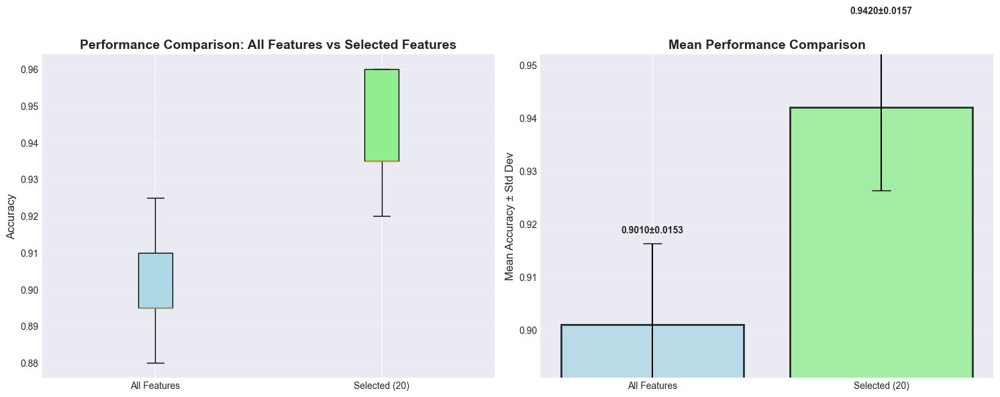


Performance Comparison:
  All Features: 0.901000 ± 0.015297
  Selected Features (20): 0.942000 ± 0.015684
  Feature Reduction: 20/30 = 66.7%
  Performance Change: +4.10%

=== synthetic_2 | knn | logarithmic ===


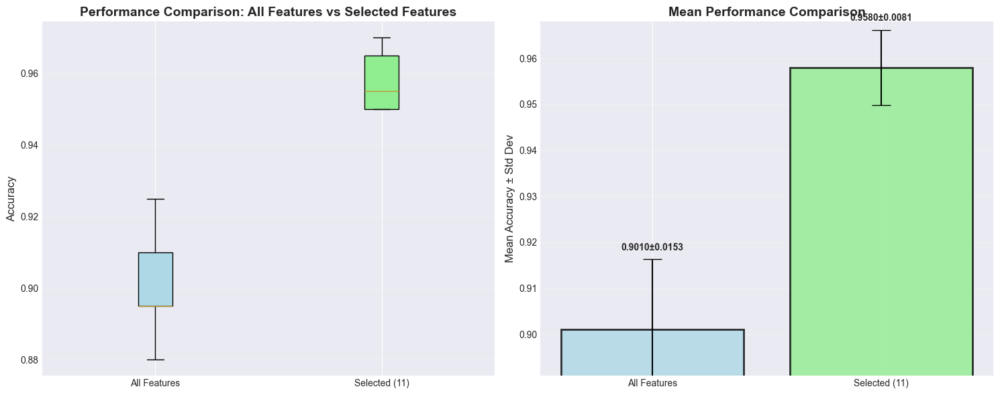


Performance Comparison:
  All Features: 0.901000 ± 0.015297
  Selected Features (11): 0.958000 ± 0.008124
  Feature Reduction: 11/30 = 36.7%
  Performance Change: +5.70%

=== synthetic_2 | knn | fermat ===


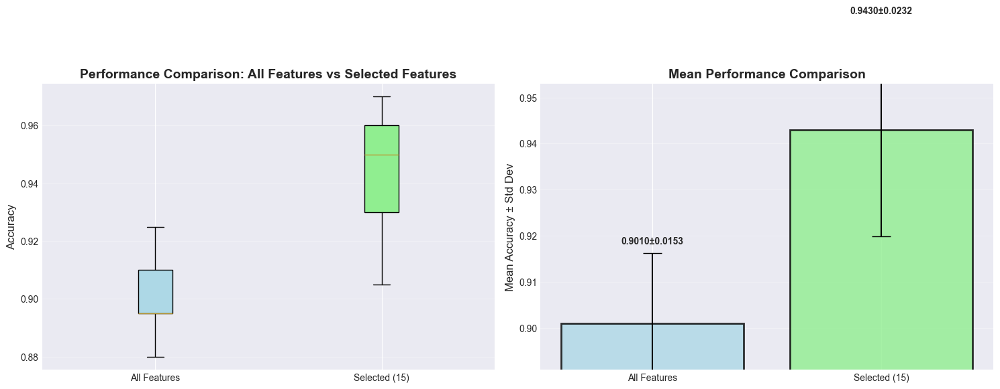


Performance Comparison:
  All Features: 0.901000 ± 0.015297
  Selected Features (15): 0.943000 ± 0.023152
  Feature Reduction: 15/30 = 50.0%
  Performance Change: +4.20%

=== synthetic_2 | knn | hyperbolic ===


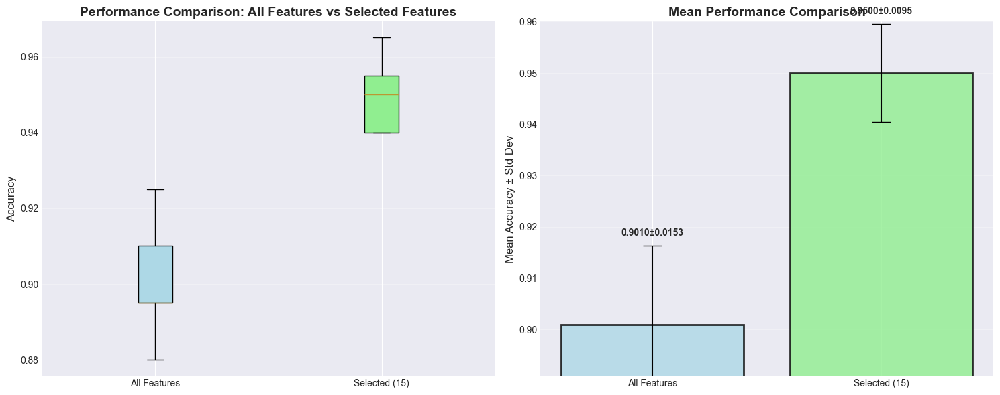


Performance Comparison:
  All Features: 0.901000 ± 0.015297
  Selected Features (15): 0.950000 ± 0.009487
  Feature Reduction: 15/30 = 50.0%
  Performance Change: +4.90%

=== synthetic_2 | knn | euler ===


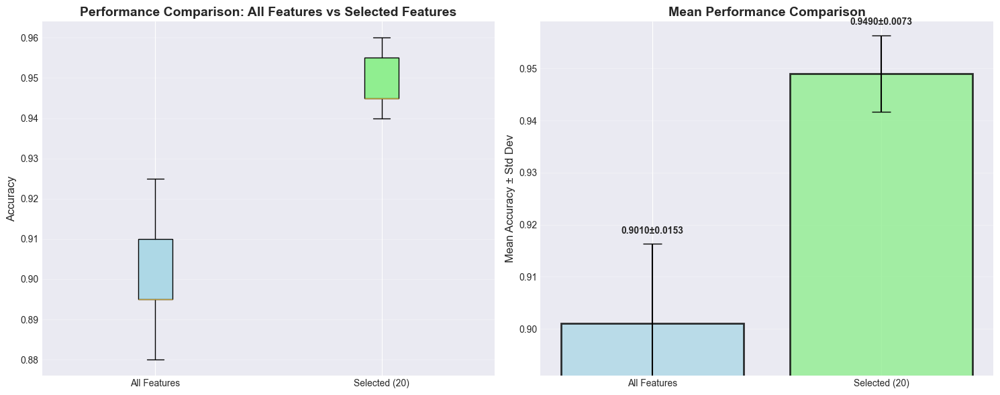


Performance Comparison:
  All Features: 0.901000 ± 0.015297
  Selected Features (20): 0.949000 ± 0.007348
  Feature Reduction: 20/30 = 66.7%
  Performance Change: +4.80%

=== synthetic_3 | rf | standard ===


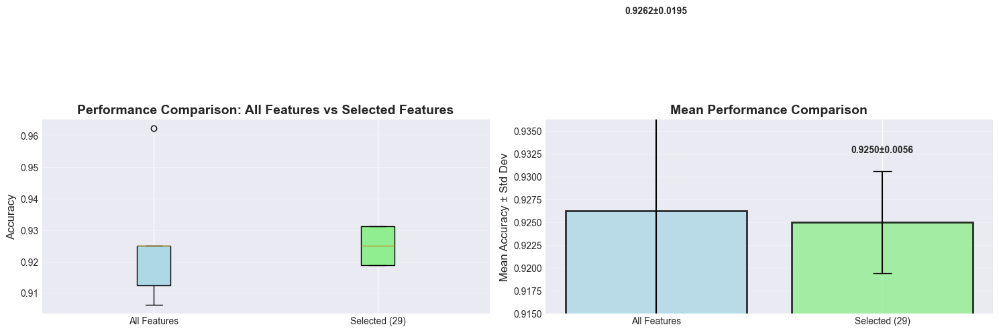


Performance Comparison:
  All Features: 0.926250 ± 0.019526
  Selected Features (29): 0.925000 ± 0.005590
  Feature Reduction: 29/50 = 58.0%
  Performance Change: -0.12%

=== synthetic_3 | rf | archimedean ===


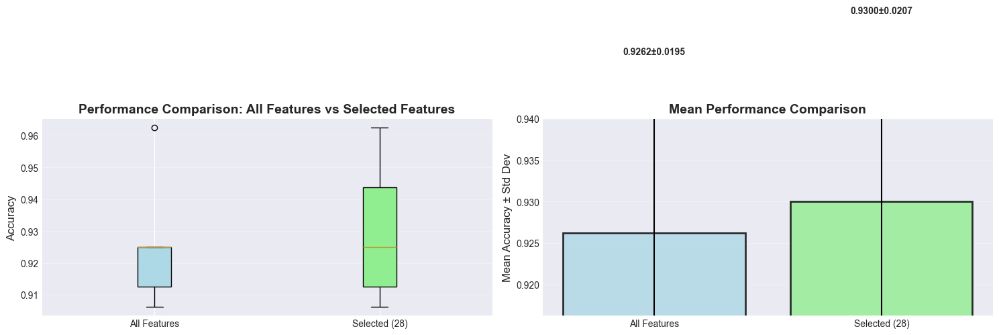


Performance Comparison:
  All Features: 0.926250 ± 0.019526
  Selected Features (28): 0.930000 ± 0.020691
  Feature Reduction: 28/50 = 56.0%
  Performance Change: +0.38%

=== synthetic_3 | rf | logarithmic ===


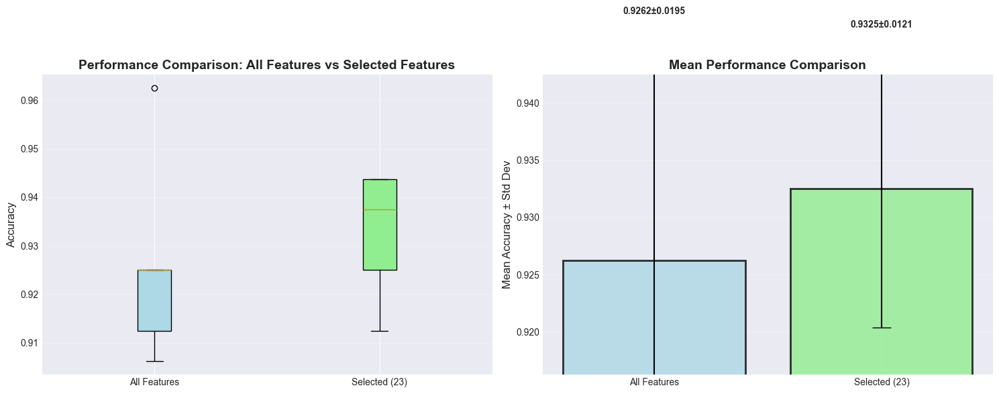


Performance Comparison:
  All Features: 0.926250 ± 0.019526
  Selected Features (23): 0.932500 ± 0.012119
  Feature Reduction: 23/50 = 46.0%
  Performance Change: +0.62%

=== synthetic_3 | rf | fermat ===


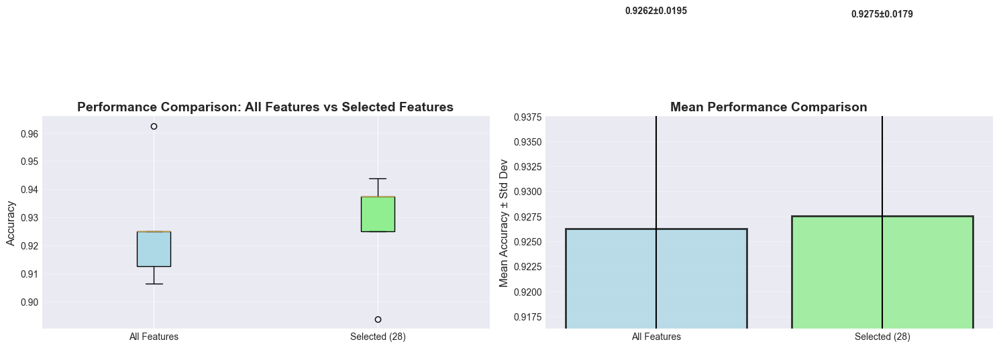


Performance Comparison:
  All Features: 0.926250 ± 0.019526
  Selected Features (28): 0.927500 ± 0.017941
  Feature Reduction: 28/50 = 56.0%
  Performance Change: +0.13%

=== synthetic_3 | rf | hyperbolic ===


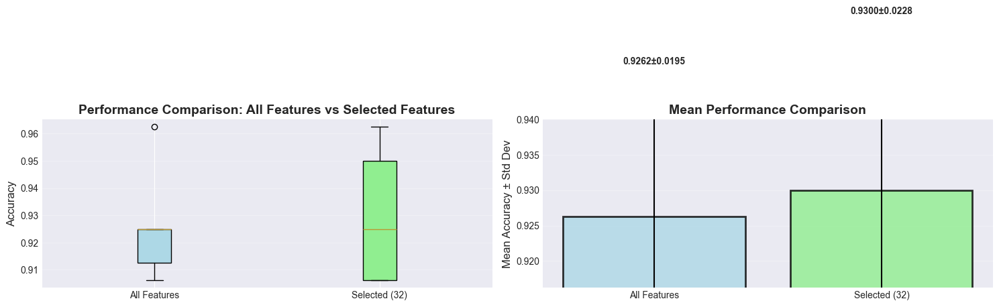


Performance Comparison:
  All Features: 0.926250 ± 0.019526
  Selected Features (32): 0.930000 ± 0.022845
  Feature Reduction: 32/50 = 64.0%
  Performance Change: +0.38%

=== synthetic_3 | rf | euler ===


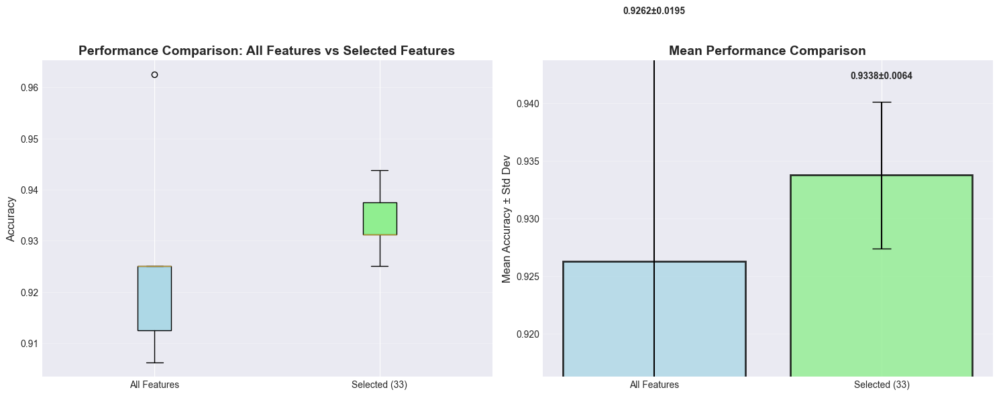


Performance Comparison:
  All Features: 0.926250 ± 0.019526
  Selected Features (33): 0.933750 ± 0.006374
  Feature Reduction: 33/50 = 66.0%
  Performance Change: +0.75%

=== synthetic_3 | svm | standard ===


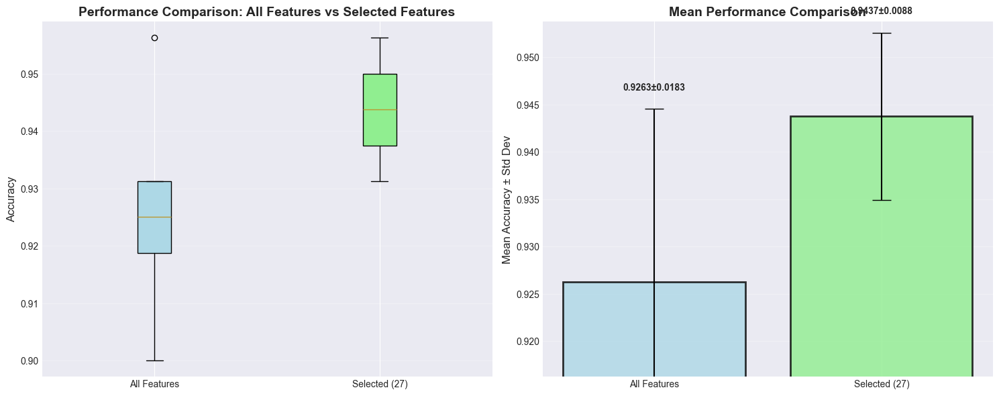


Performance Comparison:
  All Features: 0.926250 ± 0.018286
  Selected Features (27): 0.943750 ± 0.008839
  Feature Reduction: 27/50 = 54.0%
  Performance Change: +1.75%

=== synthetic_3 | svm | archimedean ===


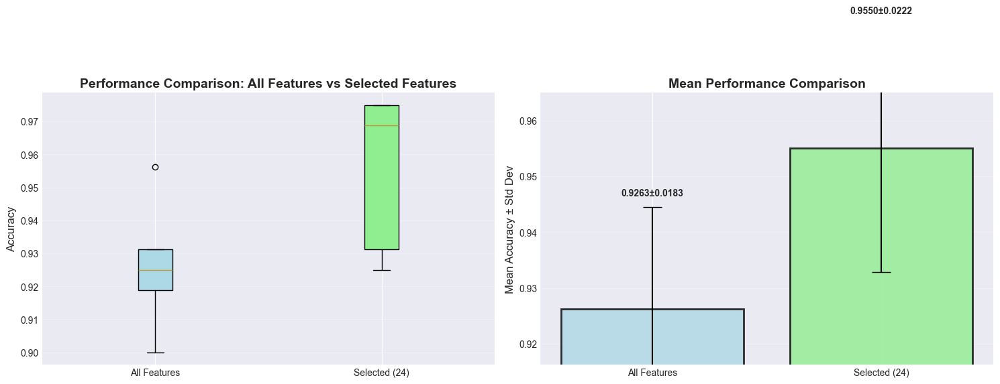


Performance Comparison:
  All Features: 0.926250 ± 0.018286
  Selected Features (24): 0.955000 ± 0.022150
  Feature Reduction: 24/50 = 48.0%
  Performance Change: +2.87%

=== synthetic_3 | svm | logarithmic ===


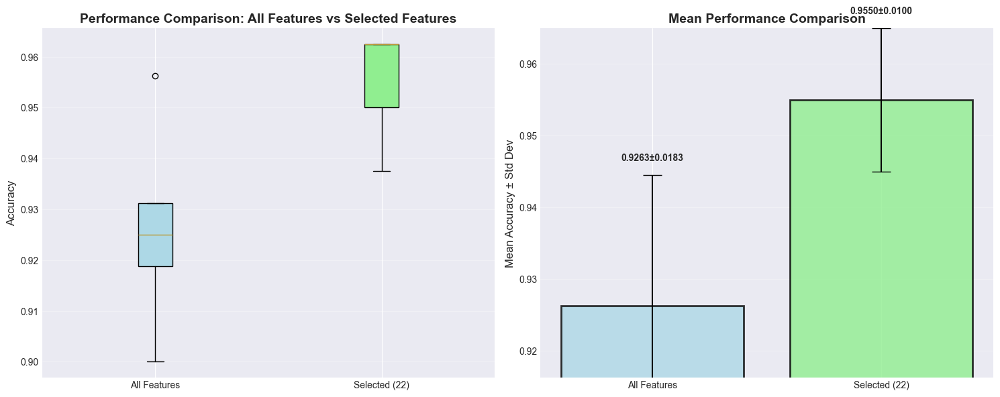


Performance Comparison:
  All Features: 0.926250 ± 0.018286
  Selected Features (22): 0.955000 ± 0.010000
  Feature Reduction: 22/50 = 44.0%
  Performance Change: +2.87%

=== synthetic_3 | svm | fermat ===


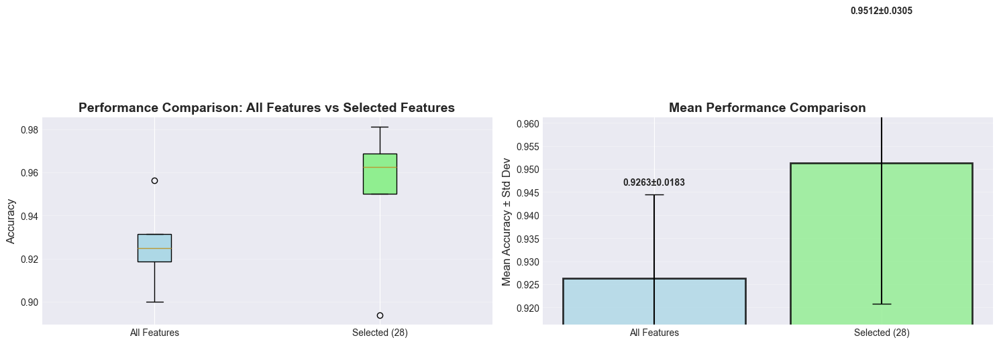


Performance Comparison:
  All Features: 0.926250 ± 0.018286
  Selected Features (28): 0.951250 ± 0.030465
  Feature Reduction: 28/50 = 56.0%
  Performance Change: +2.50%

=== synthetic_3 | svm | hyperbolic ===


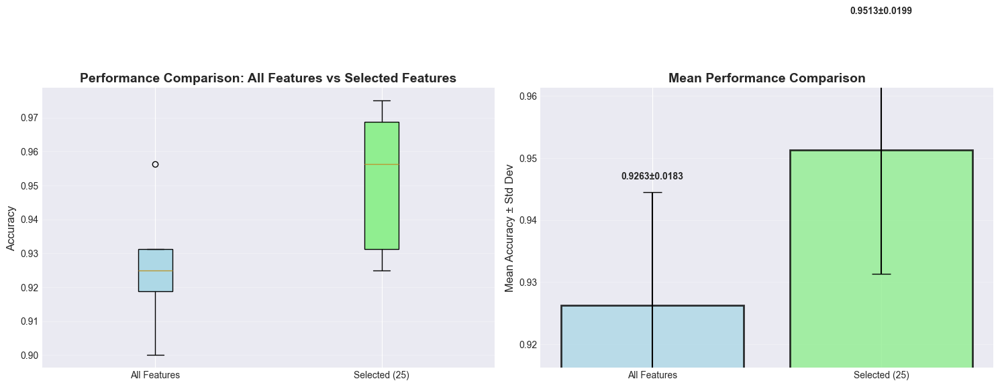


Performance Comparison:
  All Features: 0.926250 ± 0.018286
  Selected Features (25): 0.951250 ± 0.019922
  Feature Reduction: 25/50 = 50.0%
  Performance Change: +2.50%

=== synthetic_3 | svm | euler ===


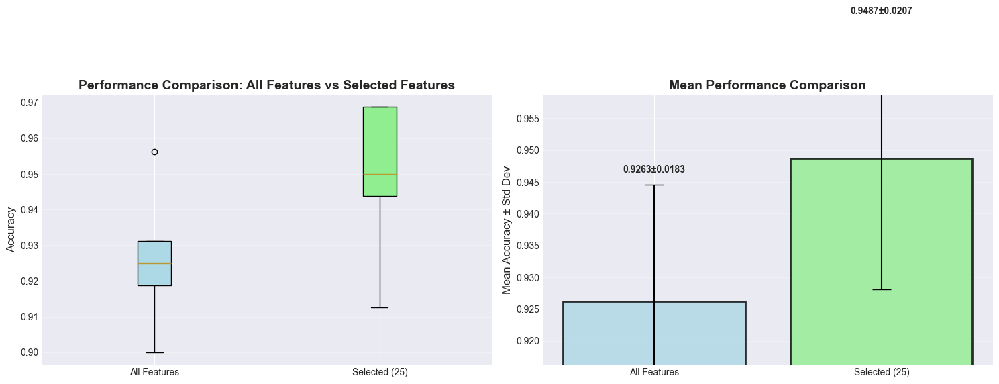


Performance Comparison:
  All Features: 0.926250 ± 0.018286
  Selected Features (25): 0.948750 ± 0.020691
  Feature Reduction: 25/50 = 50.0%
  Performance Change: +2.25%

=== synthetic_3 | knn | standard ===


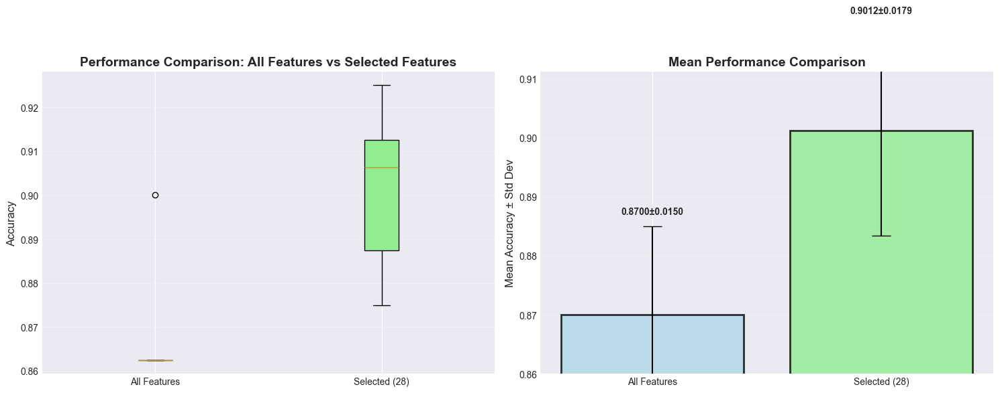


Performance Comparison:
  All Features: 0.870000 ± 0.015000
  Selected Features (28): 0.901250 ± 0.017854
  Feature Reduction: 28/50 = 56.0%
  Performance Change: +3.12%

=== synthetic_3 | knn | archimedean ===


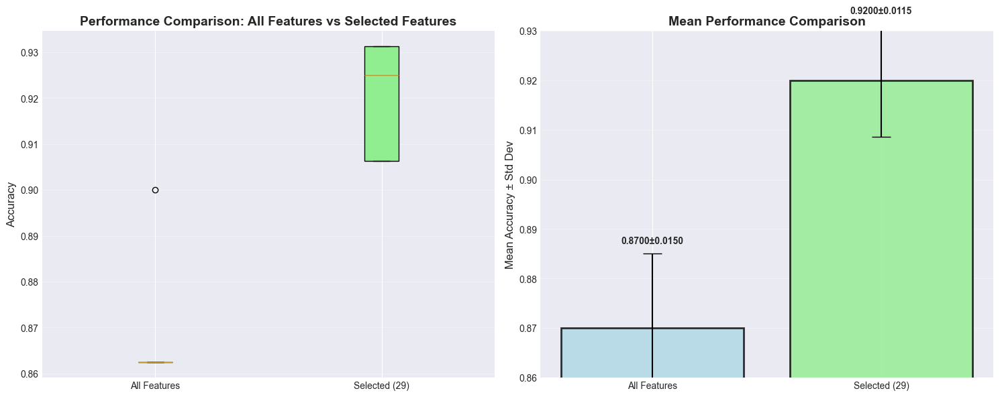


Performance Comparison:
  All Features: 0.870000 ± 0.015000
  Selected Features (29): 0.920000 ± 0.011456
  Feature Reduction: 29/50 = 58.0%
  Performance Change: +5.00%

=== synthetic_3 | knn | logarithmic ===


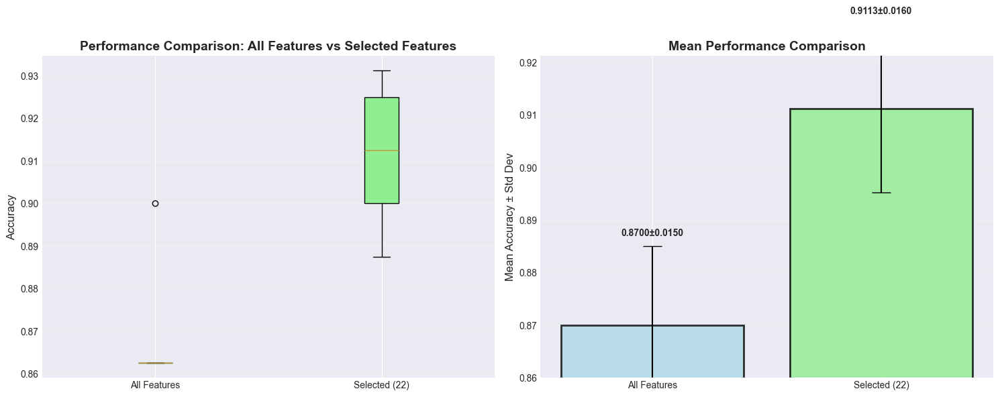


Performance Comparison:
  All Features: 0.870000 ± 0.015000
  Selected Features (22): 0.911250 ± 0.016008
  Feature Reduction: 22/50 = 44.0%
  Performance Change: +4.13%

=== synthetic_3 | knn | fermat ===


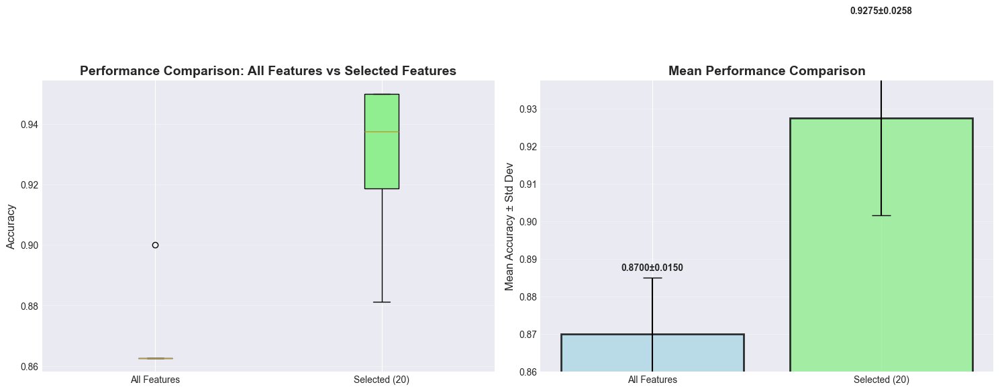


Performance Comparison:
  All Features: 0.870000 ± 0.015000
  Selected Features (20): 0.927500 ± 0.025800
  Feature Reduction: 20/50 = 40.0%
  Performance Change: +5.75%

=== synthetic_3 | knn | hyperbolic ===


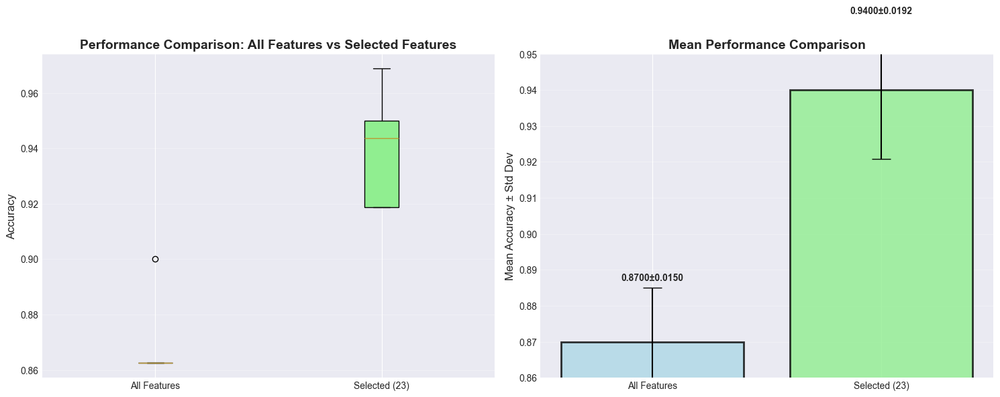


Performance Comparison:
  All Features: 0.870000 ± 0.015000
  Selected Features (23): 0.940000 ± 0.019203
  Feature Reduction: 23/50 = 46.0%
  Performance Change: +7.00%

=== synthetic_3 | knn | euler ===


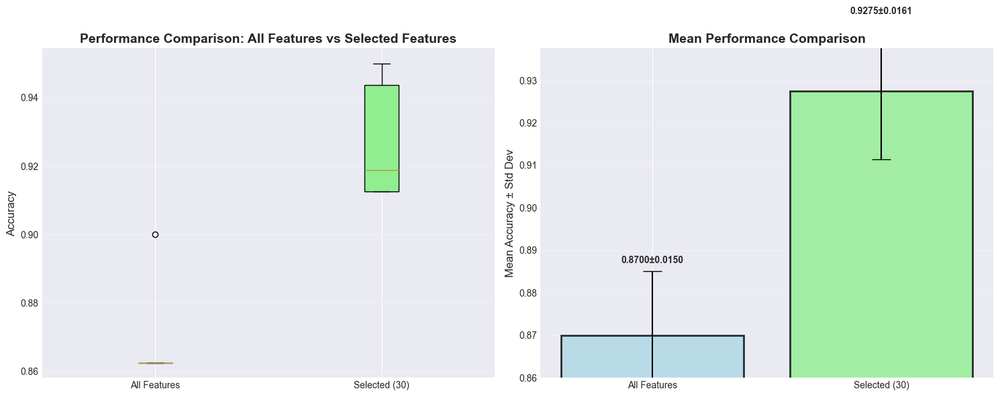


Performance Comparison:
  All Features: 0.870000 ± 0.015000
  Selected Features (30): 0.927500 ± 0.016105
  Feature Reduction: 30/50 = 60.0%
  Performance Change: +5.75%


In [51]:
def compare_with_all_features(X, y, best_chromosome, classifier='rf', cv_folds=5):
    """
    Compare performance with selected features vs all features
    """
    # Evaluate with selected features
    selected_features = np.where(best_chromosome == 1)[0]
    X_selected = X[:, selected_features]
    
    # Initialize classifier
    if classifier == 'rf':
        clf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
    elif classifier == 'svm':
        clf = SVC(kernel='rbf', random_state=42, probability=True)
    elif classifier == 'knn':
        clf = KNeighborsClassifier(n_neighbors=5)
    
    # Cross-validation with selected features
    cv = StratifiedKFold(n_splits=cv_folds, shuffle=True, random_state=42)
    scores_selected = cross_val_score(clf, X_selected, y, cv=cv, scoring='accuracy')
    
    # Cross-validation with all features
    scores_all = cross_val_score(clf, X, y, cv=cv, scoring='accuracy')
    
    # Create comparison plot
    fig, axes = plt.subplots(1, 2, figsize=(15, 6))
    
    # Plot 1: Box plot comparison
    data_to_plot = [scores_all, scores_selected]
    bp = axes[0].boxplot(data_to_plot, labels=['All Features', f'Selected ({len(selected_features)})'], 
                         patch_artist=True)
    bp['boxes'][0].set_facecolor('lightblue')
    bp['boxes'][1].set_facecolor('lightgreen')
    axes[0].set_ylabel('Accuracy', fontsize=12)
    axes[0].set_title('Performance Comparison: All Features vs Selected Features', 
                      fontsize=14, fontweight='bold')
    axes[0].grid(True, alpha=0.3, axis='y')


    means = [scores_all.mean(), scores_selected.mean()]
    stds = [scores_all.std(), scores_selected.std()]

    bars = axes[1].bar(
    ['All Features', f'Selected ({len(selected_features)})'],
    means, yerr=stds, capsize=10,
    color=['lightblue', 'lightgreen'],
    edgecolor='black', linewidth=2)

    for bar in bars:
        bar.set_alpha(0.8)


    axes[1].set_ylabel('Mean Accuracy ± Std Dev', fontsize=12)
    axes[1].set_title('Mean Performance Comparison', fontsize=14, fontweight='bold')
    axes[1].grid(True, alpha=0.3, axis='y')

    low = min(means) - 0.01
    high = max(means) + 0.01
    axes[1].set_ylim([low, high])

    # labels
    for i, (mean, std) in enumerate(zip(means, stds)):
        axes[1].text(i, mean + std + 0.002, f'{mean:.4f}±{std:.4f}',
                     ha='center', fontsize=10, fontweight='bold')

    plt.tight_layout()
    plt.show()

    # Print statistics
    total = len(feature_names)
    selected = np.sum(best_chromosome)
    removed = total - selected
    print(f"\n{'='*60}")
    print("Performance Comparison:")
    print(f"  All Features: {scores_all.mean():.6f} ± {scores_all.std():.6f}")
    print(f"  Selected Features ({len(selected_features)}): {scores_selected.mean():.6f} ± {scores_selected.std():.6f}")
    print(f"  Feature Reduction: {removed}/{X.shape[1]} = { removed /X.shape[1]*100:.1f}%")
    print(f"  Performance Change: {(scores_selected.mean() - scores_all.mean())*100:+.2f}%")
    print(f"{'='*60}")
    
    return scores_all, scores_selected

if len(all_results) > 0:
    for dataset_name, clf_dict in all_results.items():
        for clf_name, spiral_dict in clf_dict.items():
            for variant, res in spiral_dict.items():
                print(f"\n=== {dataset_name} | {clf_name} | {variant} ===")
                scores_all, scores_selected = compare_with_all_features(
                    res['X'],
                    res['y'],
                    res['best_chromosome'],
                    classifier=clf_name,
                    cv_folds=5
                )
else:
    print("No results available.")



### 5.5 Summary Statistics


In [52]:
def print_summary_statistics(ga, best_chromosome, feature_names):
    """
    Print comprehensive summary statistics
    """
    print(f"\n{'='*70}")
    print("GENETIC ALGORITHM FEATURE SELECTION - SUMMARY STATISTICS")
    print(f"{'='*70}")
    
    print(f"\n Algorithm Configuration:")
    print(f"  Population Size: {ga.pop_size}")
    print(f"  Generations: {ga.n_generations}")
    print(f"  Crossover Rate: {ga.crossover_rate}")
    print(f"  Mutation Rate: {ga.mutation_rate:.6f}")
    print(f"  Classifier: {ga.classifier}")
    print(f"  Metric: {ga.metric}")
    print(f"  CV Folds: {ga.cv_folds}")
    print(f"  Elitism: {ga.elitism}")
    
    print(f"\n Final Results:")
    final_fitness = ga.history['best_fitness'][-1]
    final_performance = ga.history['best_performance'][-1]
    n_selected = np.sum(best_chromosome)
    
    print(f"  Best Fitness: {final_fitness:.6f}")
    print(f"  Best Performance: {final_performance:.6f}")
    print(f"  Selected Features: {n_selected}/{ga.n_features} ({n_selected/ga.n_features*100:.1f}%)")
    
    print(f"\n Evolution Statistics:")
    print(f"  Initial Fitness: {ga.history['best_fitness'][0]:.6f}")
    print(f"  Final Fitness: {final_fitness:.6f}")
    print(f"  Fitness Improvement: {final_fitness - ga.history['best_fitness'][0]:.6f} "
          f"({(final_fitness/ga.history['best_fitness'][0]-1)*100:+.2f}%)")
    print(f"  Initial Features: {ga.history['best_n_features'][0]}")
    print(f"  Final Features: {n_selected}")
    print(f"  Feature Reduction: {ga.history['best_n_features'][0] - n_selected} "
          f"({(1 - n_selected/ga.history['best_n_features'][0])*100:+.1f}%)")
    
    print(f"\n Population Diversity:")
    print(f"  Initial Diversity: {ga.history['diversity'][0]:.2f}")
    print(f"  Final Diversity: {ga.history['diversity'][-1]:.2f}")
    print(f"  Diversity Change: {ga.history['diversity'][-1] - ga.history['diversity'][0]:.2f}")
    
    print(f"\n Selected Features:")
    selected_indices = np.where(best_chromosome == 1)[0]
    for i, idx in enumerate(selected_indices):
        print(f"  {i+1:2d}. [{idx:2d}] {feature_names[idx]}")
    
    print(f"\n{'='*70}\n")

# Print summary for ALL datasets, ALL classifiers, ALL spiral types
if len(all_results) > 0:

    for dataset_name, clf_dict in all_results.items():
        print(f"\n============ Dataset: {dataset_name} ============")

        for clf_name, spiral_dict in clf_dict.items():
            print(f"\n--- Classifier: {clf_name.upper()} ---")

            for spiral_type, result in spiral_dict.items():
                print(f"\n>>> Spiral Type: {spiral_type.upper()} <<<")

                print_summary_statistics(
                    result['ga'],
                    result['best_chromosome'],
                    result['feature_names']
                )

else:
    print("No results available.")





============ Dataset: breast_cancer ============

--- Classifier: RF ---

>>> Spiral Type: STANDARD <<<

GENETIC ALGORITHM FEATURE SELECTION - SUMMARY STATISTICS

 Algorithm Configuration:
  Population Size: 20
  Generations: 10
  Crossover Rate: 0.8
  Mutation Rate: 0.033333
  Classifier: rf
  Metric: accuracy
  CV Folds: 5
  Elitism: True

 Final Results:
  Best Fitness: 0.975408
  Best Performance: 0.971883
  Selected Features: 11/30 (36.7%)

 Evolution Statistics:
  Initial Fitness: 0.961357
  Final Fitness: 0.975408
  Fitness Improvement: 0.014051 (+1.46%)
  Initial Features: 12
  Final Features: 11
  Feature Reduction: 1 (+8.3%)

 Population Diversity:
  Initial Diversity: 15.00
  Final Diversity: 6.24
  Diversity Change: -8.76

 Selected Features:
   1. [ 1] mean texture
   2. [ 3] mean area
   3. [10] radius error
   4. [12] perimeter error
   5. [17] concave points error
   6. [19] fractal dimension error
   7. [20] worst radius
   8. [21] worst texture
   9. [24] worst smoot

## 6. Experiment with Different Parameters


### 7.1 Performance Comparison Across Datasets


In [83]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def collect_results(all_results, classifiers):
    """
    """
    rows = []

    for ds_name, clf_dict in all_results.items():
        for clf_name, spiral_dict in clf_dict.items():
            if clf_name not in classifiers:
                continue

            for spiral_type, result in spiral_dict.items():
                rows.append({
                    "dataset": ds_name,
                    "classifier": clf_name,
                    "spiral": spiral_type,
                    "perf_sel": result["performance_selected"],
                    "perf_all": result["performance_all"],
                    "n_total": result["n_features"],
                    "n_sel": result["n_selected"],
                    "ratio": result["reduction_ratio"],
                    "fit": result["best_fitness"],
                    "ga_time": result["ga_time"],
                    "eval_time": result["eval_time"],
                    "total_time": result["total_time"]
                })

    return pd.DataFrame(rows)


In [85]:
CLASSIFIER_FULL = {
    "rf": "Random Forest",
    "svm": "Support Vector Machine",
    "knn": "K-Nearest Neighbors"
}


def _convert_classifier_names(df):
    """Internal helper to map rf→Random Forest etc."""
    df = df.copy()
    df["classifier"] = df["classifier"].map(CLASSIFIER_FULL)
    return df


def plot_box_swarm(df):
    df = _convert_classifier_names(df)

    plt.figure(figsize=(16,6))

    sns.boxplot(
        data=df,
        x="spiral",
        y="perf_sel",
        hue="classifier",
        palette="Set2"
    )

    sns.swarmplot(
        data=df,
        x="spiral",
        y="perf_sel",
        hue="classifier",
        dodge=True,
        color="black",
        size=3,
        alpha=0.6
    )

    plt.title("Selected Feature Accuracy by Spiral Type", fontsize=14)
    plt.ylabel("Accuracy")
    plt.xlabel("Spiral Type")
    plt.xticks(rotation=45)
    plt.ylim([0.85, 1.02])
    plt.grid(axis="y", alpha=0.3)

    plt.legend(title="Classifier", bbox_to_anchor=(1.05, 1), loc="upper left")
    plt.tight_layout()
    plt.show()


def plot_reduction(df):
    df = _convert_classifier_names(df)

    plt.figure(figsize=(14,6))
    df2 = df.groupby(["classifier","spiral"])["ratio"].mean().reset_index()

    sns.barplot(
        data=df2, x="classifier", y="ratio",
        hue="spiral", palette="viridis"
    )

    plt.title("Mean Feature Reduction Ratio", fontsize=14)
    plt.ylabel("Reduction Ratio")
    plt.xlabel("Classifier")
    plt.grid(axis="y", alpha=0.3)
    plt.xticks(rotation=15)

    plt.tight_layout()
    plt.show()


def plot_time(df):
    df = _convert_classifier_names(df)

    plt.figure(figsize=(14,6))

    df2 = df.groupby(["classifier","spiral"])[
        ["ga_time","eval_time","total_time"]
    ].mean().reset_index()

    df2_melt = df2.melt(
        id_vars=["classifier","spiral"],
        var_name="Phase",
        value_name="Seconds"
    )

    sns.barplot(
        data=df2_melt, x="classifier", y="Seconds",
        hue="Phase", palette="coolwarm"
    )

    plt.title("Mean Time Cost per Classifier", fontsize=14)
    plt.ylabel("Time (seconds)")
    plt.xlabel("Classifier")
    plt.grid(axis="y", alpha=0.3)
    plt.xticks(rotation=15)

    plt.tight_layout()
    plt.show()


def plot_feature_heatmap(df):
    df = _convert_classifier_names(df)

    pivot = df.pivot_table(
        index="dataset",
        columns="spiral",
        values="n_sel",
        aggfunc="mean"
    )

    plt.figure(figsize=(12,6))
    sns.heatmap(pivot, annot=True, cmap="YlGnBu", fmt=".1f")

    plt.title("Mean Number of Selected Features", fontsize=14)
    plt.ylabel("Dataset")
    plt.xlabel("Spiral Type")
    plt.tight_layout()
    plt.show()


In [86]:
def plot_cross_dataset_comparison(all_results, classifiers=["rf","svm","knn"]):
    if len(all_results) == 0:
        print("No results to plot")
        return

    df = collect_results(all_results, classifiers)
    plot_box_swarm(df)
    plot_reduction(df)
    plot_time(df)
    plot_feature_heatmap(df)

    print("\nPlots completed.")


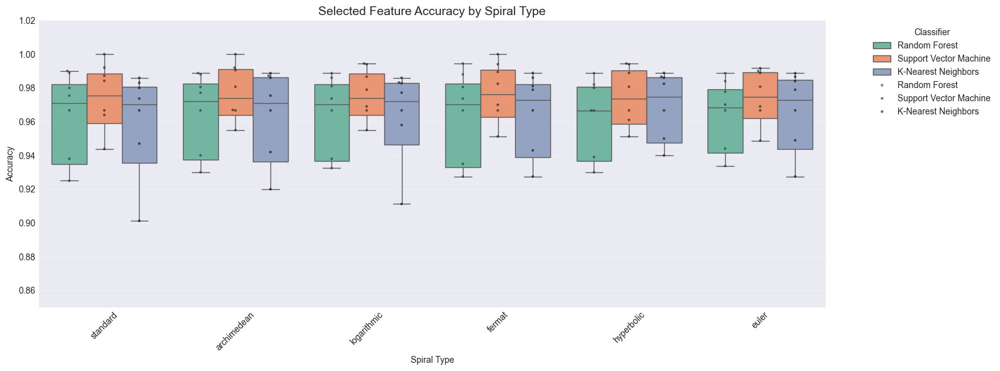

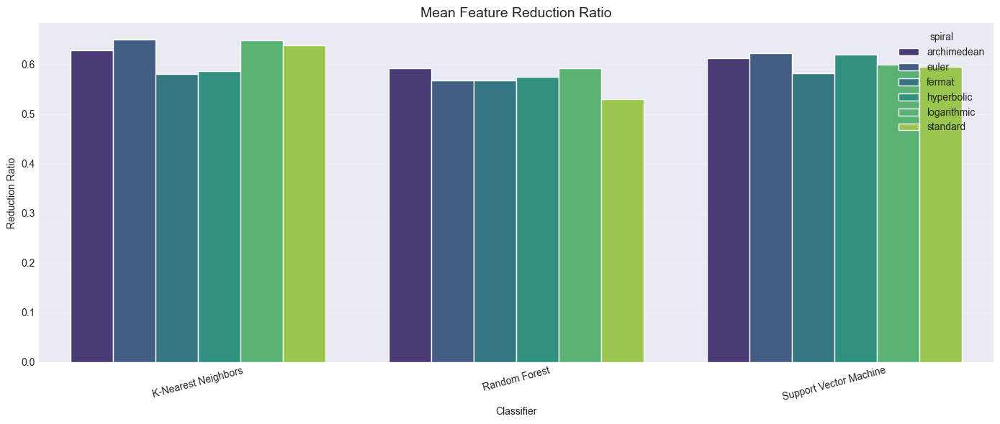

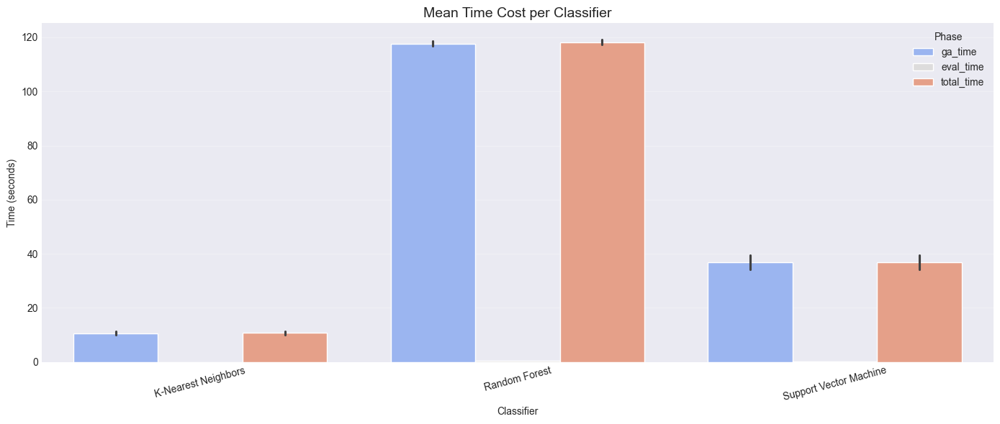

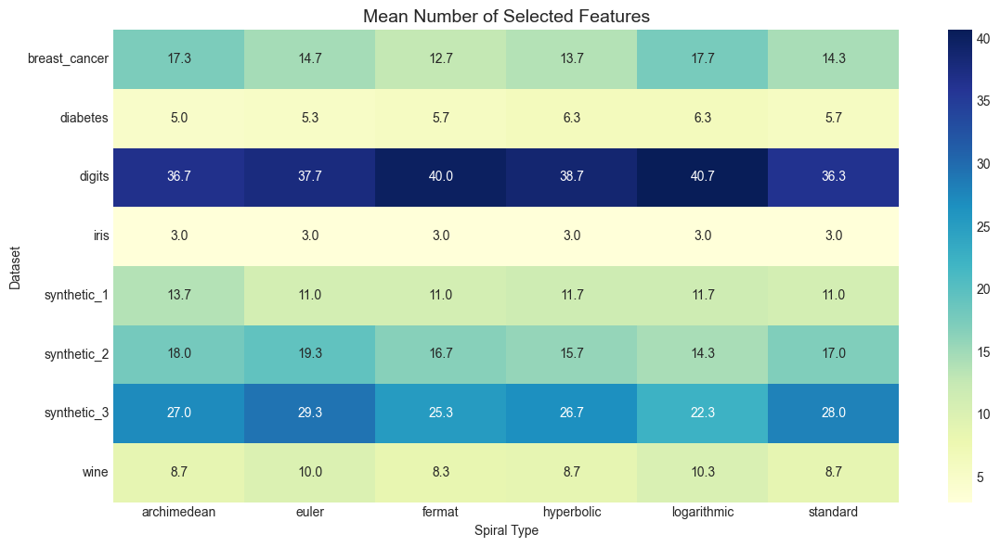


Plots completed.


In [87]:
plot_cross_dataset_comparison(all_results, CLASSIFIERS)


In [89]:
CLASSIFIER_FULL = {
        "rf": "Random Forest",
        "svm": "Support Vector Machine",
        "knn": "K-Nearest Neighbors"
}

def create_summary_table(all_results):
    """
    Create a comprehensive summary table of all results across datasets and classifiers
    """
    if len(all_results) == 0:
        print("No results to display!")
        return
    
    # Prepare data for table


    data = []

    for ds_name, clf_dict in all_results.items():
        for clf_name, spirals in clf_dict.items():
            clf_pretty = CLASSIFIER_FULL.get(clf_name, clf_name)

            for spiral_type, result in spirals.items():

                data.append({
                    'Dataset': ds_name,
                    'Classifier': clf_pretty,
                    'Spiral': spiral_type,

                    # numeric fields (no string formatting)
                    'Total Features': result['n_features'],
                    'Selected Features': result['n_selected'],
                    'Reduction Ratio': result['reduction_ratio'],

                    'Performance All': result['performance_all'],
                    'Performance Selected': result['performance_selected'],
                    'Performance Diff': result['performance_selected'] - result['performance_all'],

                    'Best Fitness': result['best_fitness'],
                    'GA Time (s)': result['ga_time'],
                    'Eval Time (s)': result['eval_time'],
                    'Total Time (s)': result['total_time'],
                })

    # Create DataFrame
    df = pd.DataFrame(data)
    
    # Display table
    print("\n" + "="*100)
    print("COMPREHENSIVE SUMMARY TABLE - ALL DATASETS")
    print("="*100)
    print(df.to_string(index=False))
    print("="*100)

    
    return df

# Create and display summary table
if len(all_results) > 0:
    summary_df = create_summary_table(all_results)



COMPREHENSIVE SUMMARY TABLE - ALL DATASETS
      Dataset             Classifier      Spiral  Total Features  Selected Features  Reduction Ratio  Performance All  Performance Selected  Performance Diff  Best Fitness  GA Time (s)  Eval Time (s)  Total Time (s)
breast_cancer          Random Forest    standard              30                 11         0.366667         0.956094              0.975408          0.019314      0.975408   151.243580       1.024970      152.268550
breast_cancer          Random Forest archimedean              30                 15         0.500000         0.956094              0.977162          0.021068      0.977162   116.170108       0.445043      116.615152
breast_cancer          Random Forest logarithmic              30                 11         0.366667         0.956094              0.973669          0.017575      0.973669   114.803783       0.434222      115.238005
breast_cancer          Random Forest      fermat              30                 11         

### 7.3 Statistical Analysis


In [90]:
def statistical_analysis(all_results):
    """
    Perform statistical analysis across all datasets and classifiers.
    Clean, safe, and aligned indexing.
    """

    if len(all_results) == 0:
        print("No results to analyze!")
        return

    print("\n" + "="*80)
    print("STATISTICAL ANALYSIS ACROSS ALL DATASETS AND CLASSIFIERS")
    print("="*80)

    dataset_names = []
    classifier_names = []
    spiral_names = []
    performances_selected = []
    performances_all = []
    reduction_ratios = []
    n_features_selected = []
    best_fitnesses = []
    ga_times = []
    total_times = []

    for ds_name, clf_dict in all_results.items():
        for clf_name, spiral_dict in clf_dict.items():
            for spiral_type, result in spiral_dict.items():

                dataset_names.append(ds_name)
                classifier_names.append(clf_name)
                spiral_names.append(spiral_type)

                performances_selected.append(result['performance_selected'])
                performances_all.append(result['performance_all'])
                reduction_ratios.append(result['reduction_ratio'])
                n_features_selected.append(result['n_selected'])
                best_fitnesses.append(result['best_fitness'])
                ga_times.append(result['ga_time'])
                total_times.append(result['total_time'])


    performances_selected = np.array(performances_selected)
    performances_all = np.array(performances_all)
    reduction_ratios = np.array(reduction_ratios)
    n_features_selected = np.array(n_features_selected)
    best_fitnesses = np.array(best_fitnesses)
    ga_times = np.array(ga_times)
    total_times = np.array(total_times)

    # --- BASIC METRICS ---
    print("\nPerformance Statistics:")
    print(f"  Mean (All Features):       {performances_all.mean():.4f} ± {performances_all.std():.4f}")
    print(f"  Mean (Selected Features):  {performances_selected.mean():.4f} ± {performances_selected.std():.4f}")
    diff = performances_selected - performances_all
    print(f"  Mean Improvement:          {diff.mean():+.4f}")


    print("\nFeature Reduction Statistics:")
    print(f"  Mean Reduction Ratio:      {reduction_ratios.mean():.4f} ± {reduction_ratios.std():.4f}")
    print(f"  Mean Selected Features:    {n_features_selected.mean():.2f} ± {n_features_selected.std():.2f}")
    print(f"  Min Selected Features:     {n_features_selected.min()}")
    print(f"  Max Selected Features:     {n_features_selected.max()}")

    best_idx = np.argmax(best_fitnesses)
    worst_idx = np.argmin(best_fitnesses)

    print("\nFitness Statistics:")
    print(f"  Mean Best Fitness:         {best_fitnesses.mean():.4f} ± {best_fitnesses.std():.4f}")
    print(f"  Best Overall Fitness:      {best_fitnesses[best_idx]:.4f} "
          f"(Dataset: {dataset_names[best_idx]}, Classifier: {classifier_names[best_idx]})")
    print(f"  Worst Overall Fitness:     {best_fitnesses[worst_idx]:.4f} "
          f"(Dataset: {dataset_names[worst_idx]}, Classifier: {classifier_names[worst_idx]})")


    improved = np.sum(diff > 0)
    degraded = np.sum(diff < 0)
    unchanged = np.sum(diff == 0)

    total_cases = len(diff)

    print("\nPerformance Change Analysis:")
    print(f"  Improved:  {improved}/{total_cases} ({improved/total_cases*100:.1f}%)")
    print(f"  Degraded:  {degraded}/{total_cases} ({degraded/total_cases*100:.1f}%)")
    print(f"  Unchanged: {unchanged}/{total_cases} ({unchanged/total_cases*100:.1f}%)")


    print("\nCorrelation Analysis:")
    print(f"  Reduction Ratio vs Perf:   {np.corrcoef(reduction_ratios, performances_selected)[0,1]:.4f}")
    print(f"  Selected Features vs Perf: {np.corrcoef(n_features_selected, performances_selected)[0,1]:.4f}")
    print(f"  Best Fitness vs Perf:      {np.corrcoef(best_fitnesses, performances_selected)[0,1]:.4f}")
    print(f"  Total Time vs # Features:  {np.corrcoef(total_times, n_features_selected)[0,1]:.4f}")


    print("\nAnalysis by Classifier:")
    unique_clfs = sorted(set(classifier_names))
    for clf in unique_clfs:
        idxs = [i for i,c in enumerate(classifier_names) if c == clf]
        clf_perf = performances_selected[idxs]
        clf_time = total_times[idxs]
        print(f"  {clf.upper()}:")
        print(f"    Mean Performance:        {clf_perf.mean():.4f} ± {clf_perf.std():.4f}")
        print(f"    Mean Total Time:         {clf_time.mean():.2f}s ± {clf_time.std():.2f}s")

    print("\n" + "="*80)


In [91]:
statistical_analysis(all_results)



STATISTICAL ANALYSIS ACROSS ALL DATASETS AND CLASSIFIERS

Performance Statistics:
  Mean (All Features):       0.9257 ± 0.0853
  Mean (Selected Features):  0.9438 ± 0.0732
  Mean Improvement:          +0.0181

Feature Reduction Statistics:
  Mean Reduction Ratio:      0.5997 ± 0.1408
  Mean Selected Features:    15.77 ± 11.20
  Min Selected Features:     2
  Max Selected Features:     48

Fitness Statistics:
  Mean Best Fitness:         0.9438 ± 0.0732
  Best Overall Fitness:      1.0000 (Dataset: wine, Classifier: svm)
  Worst Overall Fitness:     0.7442 (Dataset: diabetes, Classifier: rf)

Performance Change Analysis:
  Improved:  137/144 (95.1%)
  Degraded:  1/144 (0.7%)
  Unchanged: 6/144 (4.2%)

Correlation Analysis:
  Reduction Ratio vs Perf:   0.1189
  Selected Features vs Perf: 0.2848
  Best Fitness vs Perf:      1.0000
  Total Time vs # Features:  0.3758

Analysis by Classifier:
  KNN:
    Mean Performance:        0.9413 ± 0.0721
    Mean Total Time:         10.71s ± 9.68s
  